We will learn genetic algorithms in this; and we will write an algorirthm for linear regression for least MAE

https://youtu.be/uQj5UNhCPuo?feature=shared


Watch this video first which will help you understand what genetic algorithms are

# Genetic Algorithms

Genetic Algorithms (GAs) are optimization and search techniques inspired by the principles of natural selection and evolution. They are used to solve problems that are difficult or infeasible to address with conventional methods. GAs simulate the process of evolution to evolve solutions over successive iterations.

## Key Concepts in Genetic Algorithms
1. **Population**: A set of candidate solutions to the problem.
2. **Chromosome**: A representation of a candidate solution, often encoded as a string (binary, numeric, or symbolic).
3. **Genes**: The individual components or parameters of a chromosome.
4. **Fitness Function**: A measure of how good a solution is for the given problem.
5. **Selection**: Choosing parent solutions from the population based on their fitness.
6. **Crossover (Recombination)**: Combining parts of two parent chromosomes to create offspring.
7. **Mutation**: Randomly altering genes in a chromosome to maintain genetic diversity.
8. **Elitism**: Retaining the best solutions from one generation to the next to preserve quality.

## How Genetic Algorithms Work
1. **Initialization**: Generate an initial population of candidate solutions randomly or based on some heuristics.
2. **Evaluation**: Assess the fitness of each candidate solution using the fitness function.
3. **Selection**: Choose the most fit individuals for reproduction.
4. **Reproduction**:
   - **Crossover**: Create new individuals by combining features of selected parents.
   - **Mutation**: Introduce small random changes in offspring.
5. **Replacement**: Form a new generation by replacing some or all of the old population with the new one.
6. **Iteration**: Repeat the process until a stopping condition is met (e.g., a satisfactory fitness level or a maximum number of generations).

## Applications of Genetic Algorithms
- **Optimization Problems**: Finding optimal solutions for mathematical, engineering, or financial problems.
- **Machine Learning**: Feature selection, hyperparameter tuning, and neural architecture search.
- **Scheduling**: Solving complex scheduling problems, such as in manufacturing or airline crew assignments.
- **Game Design**: Developing strategies or AI for games.
- **Bioinformatics**: Sequence alignment, protein structure prediction, etc.

Genetic algorithms are particularly useful for problems with large search spaces, non-linear relationships, or multiple conflicting objectives.


In [1]:
import random
import numpy as np
import matplotlib.pyplot as plt

In [14]:
# Constants
PARAMETER = 10
POPULATION_SIZE = 50
MAX_GENERATIONS = 200
LINEAR_REGRESSION_ERROR_RANGE = 3
ERROR_RANGE = 1.0001
MUTATION_RATE = 0.1
NUM_POINTS = 45
NUM_ELITES = 2  # Number of best lines to retain across generations

In [ ]:

# Function 1: Generate random points along a line with added noise

def generate_random_points(num_points, slope, intercept):
    noise = np.random.normal(0, LINEAR_REGRESSION_ERROR_RANGE, num_points)
    x_coords = np.random.uniform(-PARAMETER, PARAMETER, num_points)
    y_coords = slope * x_coords + intercept + noise
    return np.column_stack((x_coords, y_coords))


In [4]:

# Function 2: Generate random lines by connecting two random points
'''
Instructions:
- Write a function that generates a list of random lines.
- Each line is represented as a list with a slope and intercept.
- Both slope and intercept should be random floats in the range [-PARAMETER, PARAMETER].
'''

def generate_random_lines(num_lines):
    # Replace the pass statement with your implementation.
    lines = []
    for _ in range(num_lines):
        slope = random.uniform(-PARAMETER, PARAMETER)
        intercept = random.uniform(-PARAMETER, PARAMETER)
        lines.append([slope, intercept])
    return lines


In [5]:

# Function 3: Measure the error (badness) of all lines using vectorized operations
'''
Instructions:
- Write a function that calculates how well a line fits the points.
- Use the formula: error = sum((predicted_y - actual_y) ** 2) for each line.
- Use NumPy for vectorized calculations.
'''

def calculate_errors(lines, points):
    # Replace the pass statement with your implementation.
    lines = np.array(lines)      # shape: (L, 2)
    points = np.array(points)    # shape: (N, 2)

    m = lines[:, 0]              # shape: (L,)
    c = lines[:, 1]              # shape: (L,)

    x = points[:, 0]             # shape: (N,)
    y = points[:, 1]             # shape: (N,)

    # Predicted y for every (line, point)
    y_pred = m[:, None] * x[None, :] + c[:, None]  # shape: (L, N)

    # Squared error
    errors = np.sum((y_pred - y[None, :]) ** 2, axis=1)

    return errors
    


In [6]:

# Function 4: Enhanced mutation function
'''
Instructions:
- Write a function that randomly mutates a line (its slope and intercept).
- Use the MUTATION_RATE to decide whether to mutate each parameter.
- Mutate by adding a small random value proportional to the current value.
'''

def mutate(line, mutation_rate=MUTATION_RATE):
    # Replace the pass statement with your implementation.
    m, c = line

    # Mutate slope
    if random.random() < mutation_rate:
        m += random.uniform(-0.1, 0.1) * (abs(m) + 1e-6)

    # Mutate intercept
    if random.random() < mutation_rate:
        c += random.uniform(-0.1, 0.1) * (abs(c) + 1e-6)

    return [m, c]


In [7]:

# Function 5: Create the next generation using crossover, mutation, and elitism
'''
Instructions:
- Write a function to create the next generation of lines.
- Retain the best `num_elites` lines as is.
- Perform crossover by mixing the slope of one parent with the intercept of another.
- Apply mutations to the offspring.
- Ensure the next generation has the same number of lines as the current generation.
'''

def create_next_generation(lines, points, num_elites=NUM_ELITES):
    # Replace the pass statement with your implementation.
    # Convert to numpy for convenience
    lines = np.array(lines)

    # 1. Compute errors (lower is better)
    errors = calculate_errors(lines, points)

    # 2. Sort lines by fitness (ascending error)
    sorted_indices = np.argsort(errors)
    sorted_lines = lines[sorted_indices]

    # 3. Elitism: keep the best lines unchanged
    next_generation = list(sorted_lines[:num_elites])

    # 4. Generate offspring until population is restored
    while len(next_generation) < len(lines):
        # Select two parents from elites
        parent1 = random.choice(sorted_lines[:num_elites])
        parent2 = random.choice(sorted_lines[:num_elites])

        # Crossover: mix slope and intercept
        child = [parent1[0], parent2[1]]

        # Mutation
        child = mutate(child)

        next_generation.append(child)

    return next_generation


In [16]:

# Function 6: Visualization function
# This has been implemented for you

def plot_progress(points, actual_line, predicted_line, generation):
    x = points[:, 0]
    y = points[:, 1]

    plt.figure(figsize=(8, 6))
    plt.scatter(x, y, label="Data Points", color="blue")
    
    x_fit = np.linspace(min(x), max(x), 100)
    y_actual = actual_line[0] * x_fit + actual_line[1]
    y_predicted = predicted_line[0] * x_fit + predicted_line[1]

    plt.plot(x_fit, y_actual, label="Actual Line", color="green", linewidth=2)
    plt.plot(x_fit, y_predicted, label=f"Predicted Line (Gen {generation})", color="red", linestyle="dashed")
    
    plt.xlabel("X")
    plt.ylabel("Y")
    plt.title("Genetic Algorithm Progress")
    plt.legend()
    plt.show()
    

In [21]:

# Function 7: Main genetic algorithm implementation
'''
Instructions:
- Write the main loop of the genetic algorithm.
- Initialize a generation of random lines.
- Iterate through generations, calculating errors and selecting the best line.
- Break the loop if the best error is within the acceptable range (defined by ERROR_RANGE).
- Use the `plot_progress` function to visualize progress in each generation.
'''

def genetic_algorithm():
    # Generate test data
    # Generate test data
    num_points = NUM_POINTS
    true_slope = random.uniform(-PARAMETER, PARAMETER)
    true_intercept = random.uniform(-PARAMETER, PARAMETER)
    points = generate_random_points(num_points, true_slope, true_intercept)
    actual_line = [true_slope, true_intercept]

    print("Actual Line:", actual_line)

    # 1. Initialize population
    lines = generate_random_lines(POPULATION_SIZE)

    best_error = float('inf')
    best_line = None

    # 2. Main GA loop
    for generation in range(MAX_GENERATIONS):
        # Calculate errors
        errors = calculate_errors(lines, points)

        # Find best line of this generation
        best_idx = np.argmin(errors)
        curr_best_error = errors[best_idx]
        curr_best_line = lines[best_idx]

        # Track global best
        if curr_best_error < best_error:
            best_error = curr_best_error
            best_line = curr_best_line

        # Visualize progress
        plot_progress(points, actual_line, best_line, generation)

        print(
            f"Generation {generation:3d} | "
            f"Best Error: {curr_best_error:.6f} | "
            f"Best Line: {curr_best_line}"
        )

        # 3. Stopping condition
        if curr_best_error <= ERROR_RANGE:
            print("Converged within acceptable error range.")
            break

        # 4. Create next generation
        lines = create_next_generation(lines, points)

    print("\nFinal Best Line:", best_line)
    print("Final Error:", best_error)

    return best_line



Actual Line: [-9.597802651676812, -4.905446341881399]


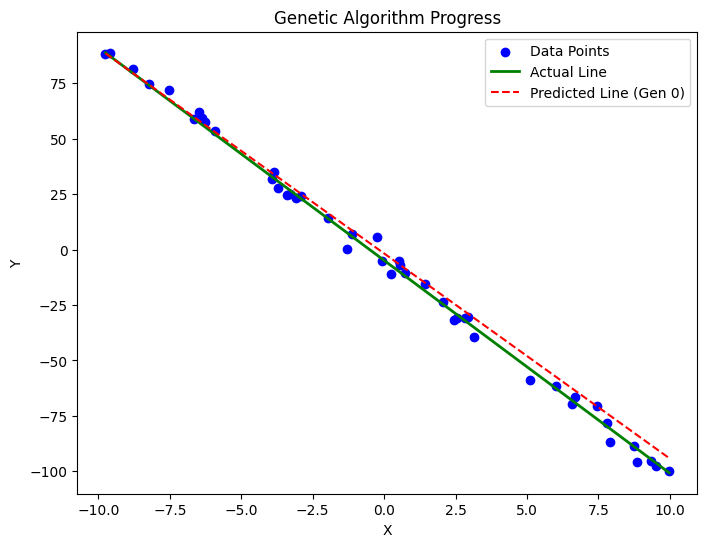

Generation   0 | Best Error: 1174.639033 | Best Line: [-9.24770306528896, -1.7775560442323357]


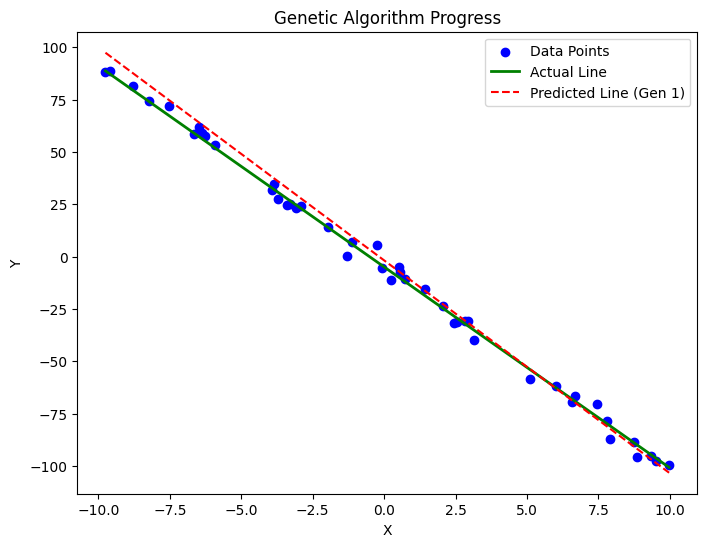

Generation   1 | Best Error: 1106.952465 | Best Line: [np.float64(-10.166063896720111), np.float64(-1.7775560442323357)]


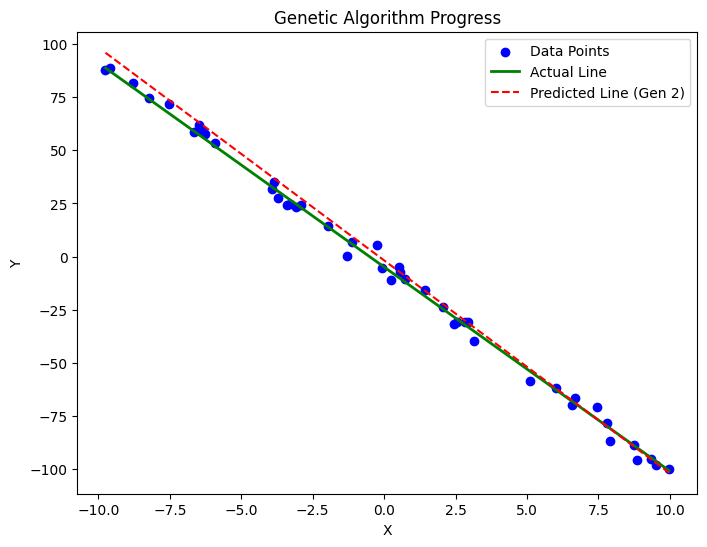

Generation   2 | Best Error: 942.534262 | Best Line: [np.float64(-10.011618615473937), np.float64(-1.7775560442323357)]


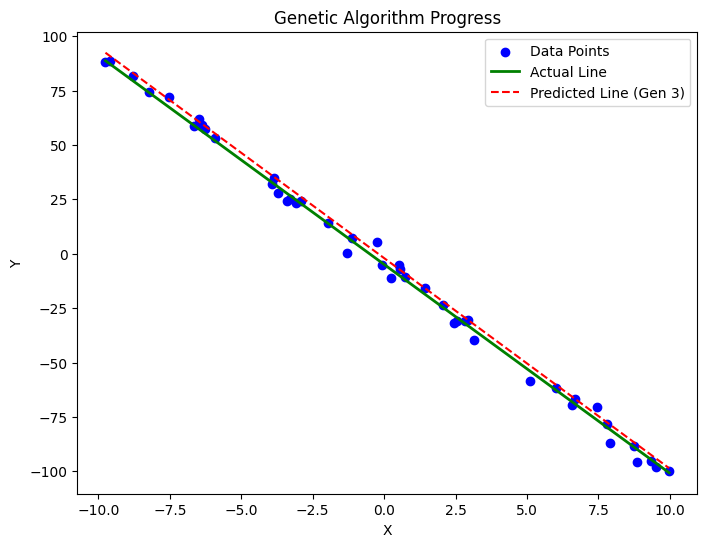

Generation   3 | Best Error: 770.919342 | Best Line: [np.float64(-9.677224724436256), np.float64(-2.0109808847947432)]


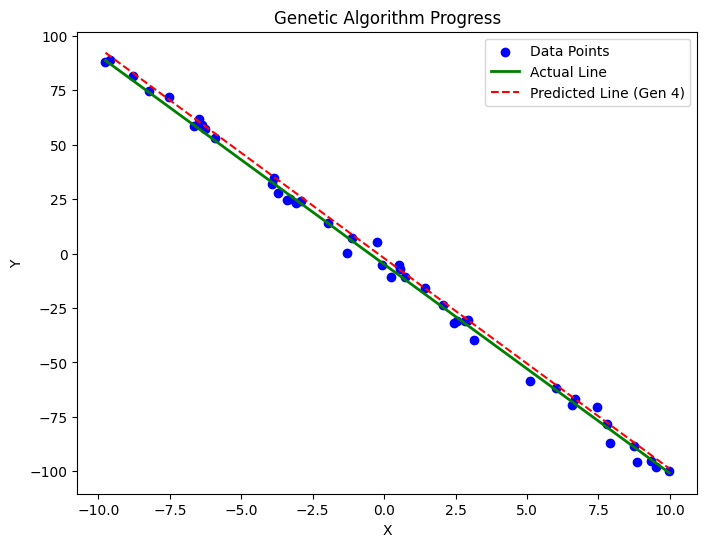

Generation   4 | Best Error: 746.706558 | Best Line: [np.float64(-9.677224724436256), np.float64(-2.1124837212236036)]


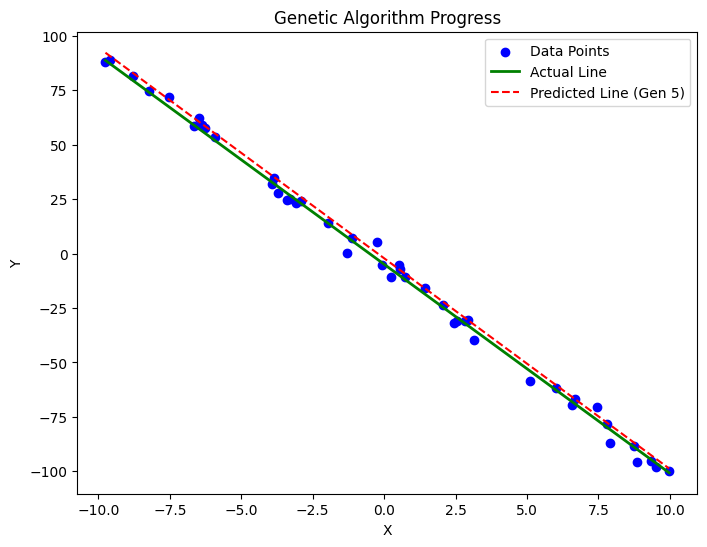

Generation   5 | Best Error: 735.581857 | Best Line: [np.float64(-9.677224724436256), np.float64(-2.1604731215945776)]


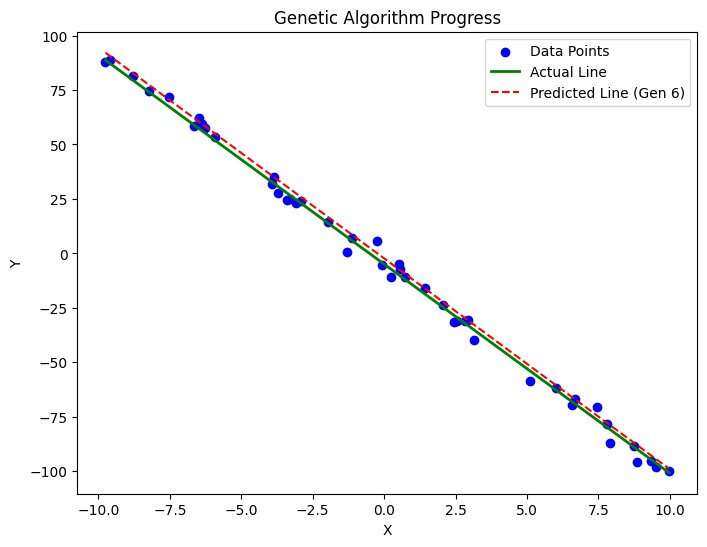

Generation   6 | Best Error: 707.826854 | Best Line: [np.float64(-9.677224724436256), np.float64(-2.284333751720772)]


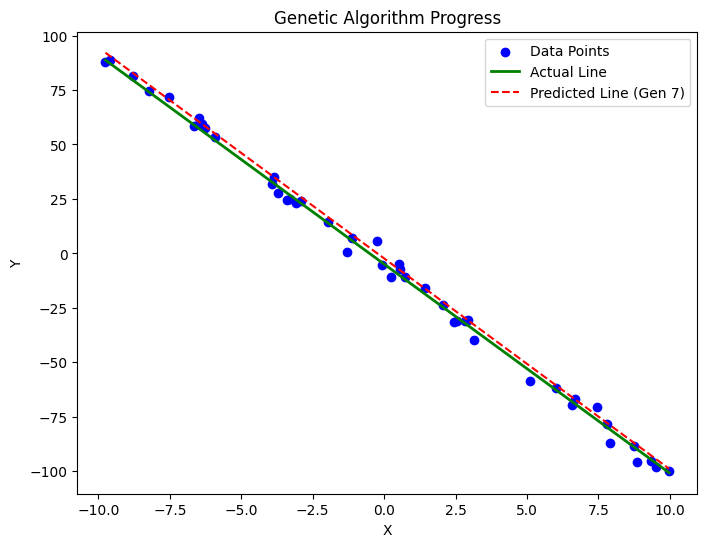

Generation   7 | Best Error: 706.383601 | Best Line: [np.float64(-9.677224724436256), np.float64(-2.290947771856081)]


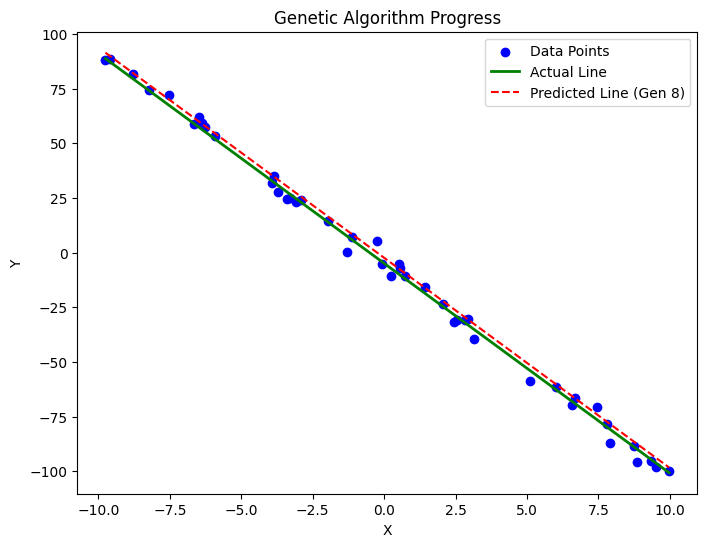

Generation   8 | Best Error: 704.865342 | Best Line: [np.float64(-9.611753386741206), np.float64(-2.374200233645854)]


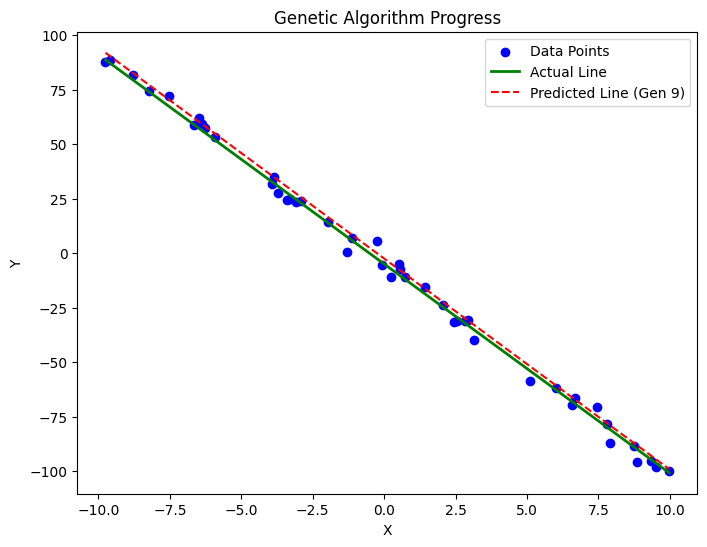

Generation   9 | Best Error: 678.818044 | Best Line: [np.float64(-9.677224724436256), np.float64(-2.4209346585497764)]


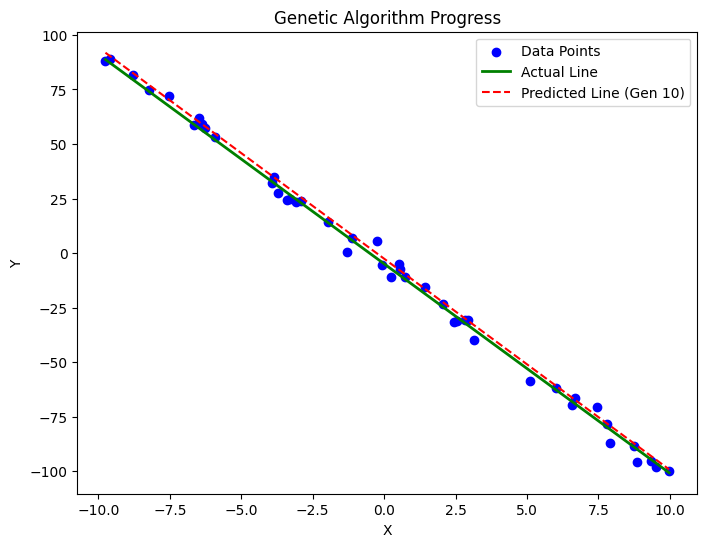

Generation  10 | Best Error: 649.086172 | Best Line: [np.float64(-9.677224724436256), np.float64(-2.5699601955665075)]


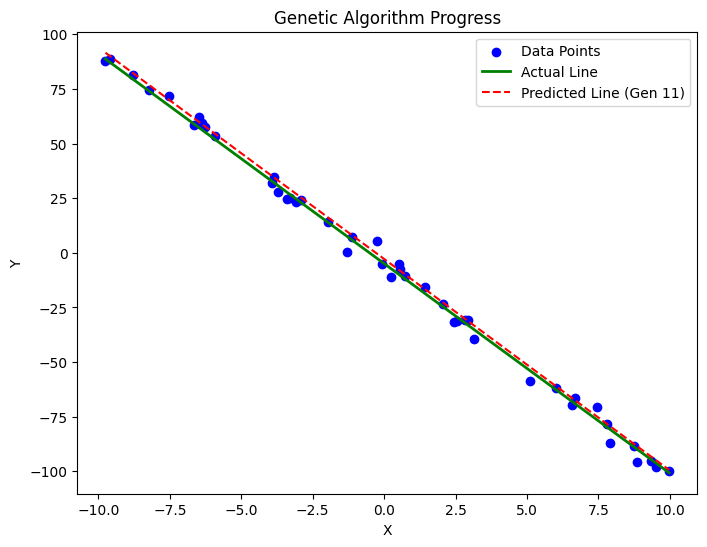

Generation  11 | Best Error: 606.005187 | Best Line: [np.float64(-9.677224724436256), np.float64(-2.806461147336116)]


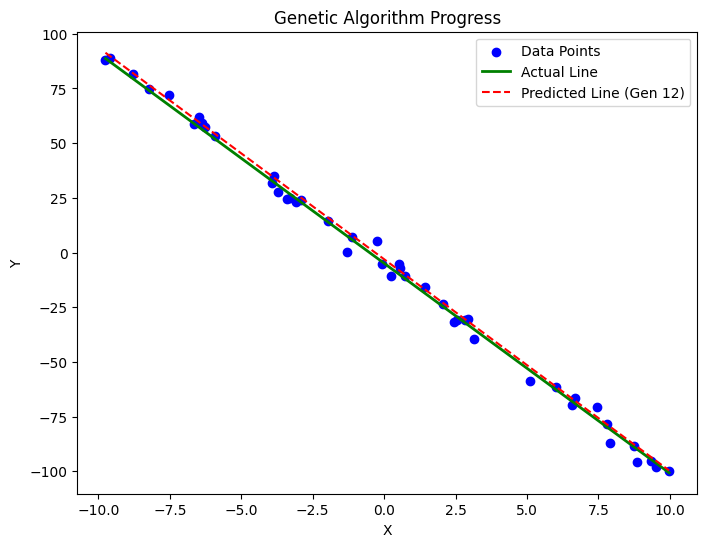

Generation  12 | Best Error: 564.695032 | Best Line: [np.float64(-9.677224724436256), np.float64(-3.064825738275178)]


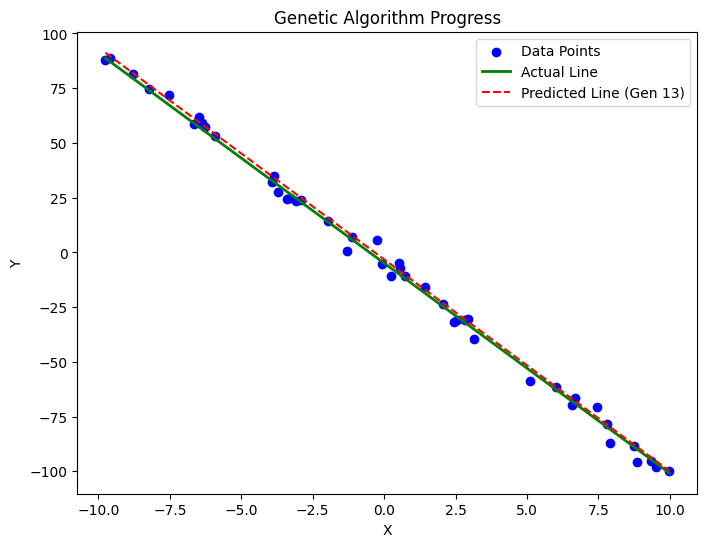

Generation  13 | Best Error: 547.181025 | Best Line: [np.float64(-9.677224724436256), np.float64(-3.1875216418310877)]


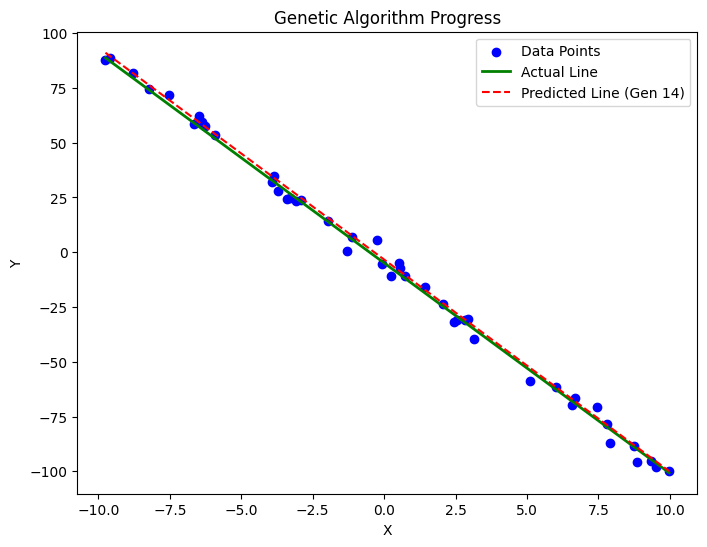

Generation  14 | Best Error: 525.581188 | Best Line: [np.float64(-9.677224724436256), np.float64(-3.354020762288616)]


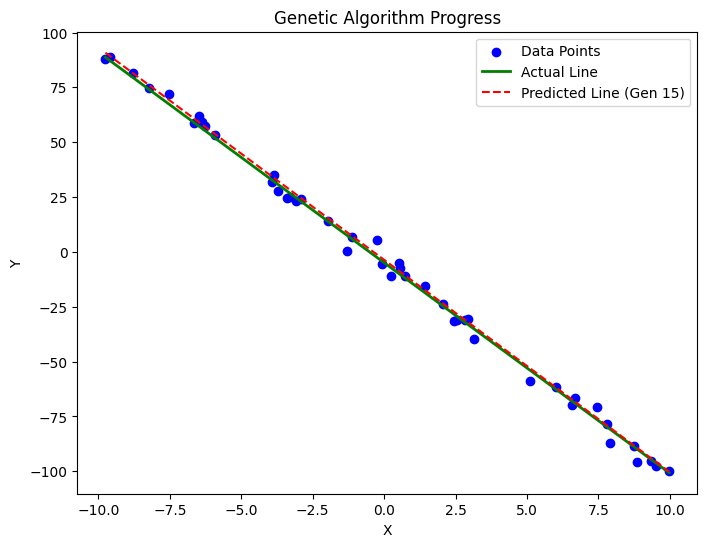

Generation  15 | Best Error: 498.341773 | Best Line: [np.float64(-9.677224724436256), np.float64(-3.5989457262545317)]


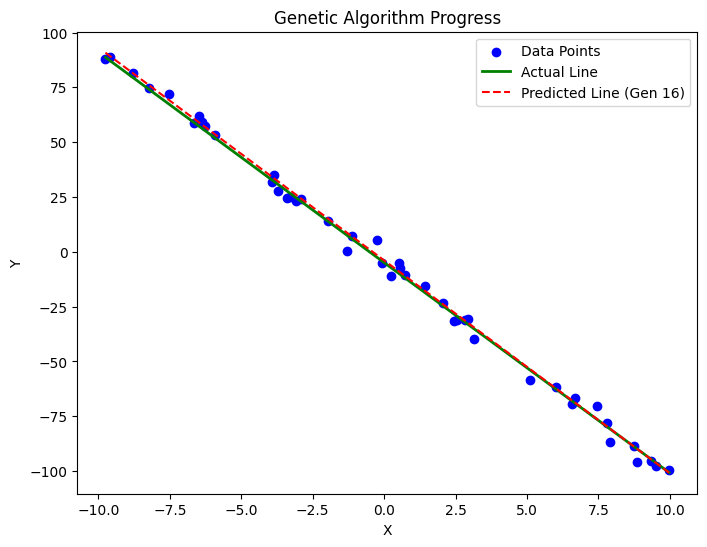

Generation  16 | Best Error: 469.607824 | Best Line: [np.float64(-9.709609817868083), np.float64(-3.9023779868365676)]


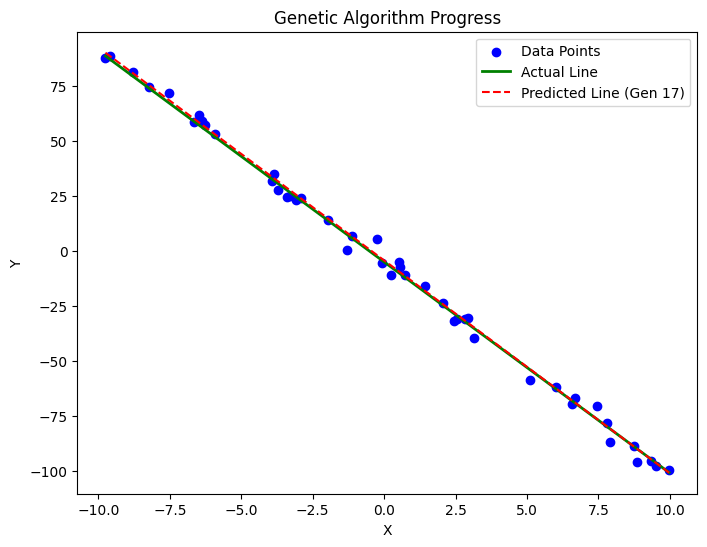

Generation  17 | Best Error: 454.189536 | Best Line: [np.float64(-9.677224724436256), np.float64(-4.20408035996745)]


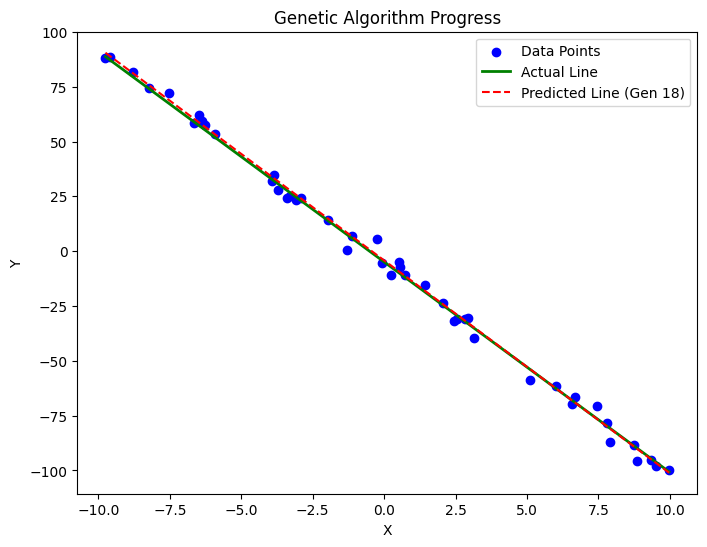

Generation  18 | Best Error: 451.886401 | Best Line: [np.float64(-9.709609817868083), np.float64(-4.20408035996745)]


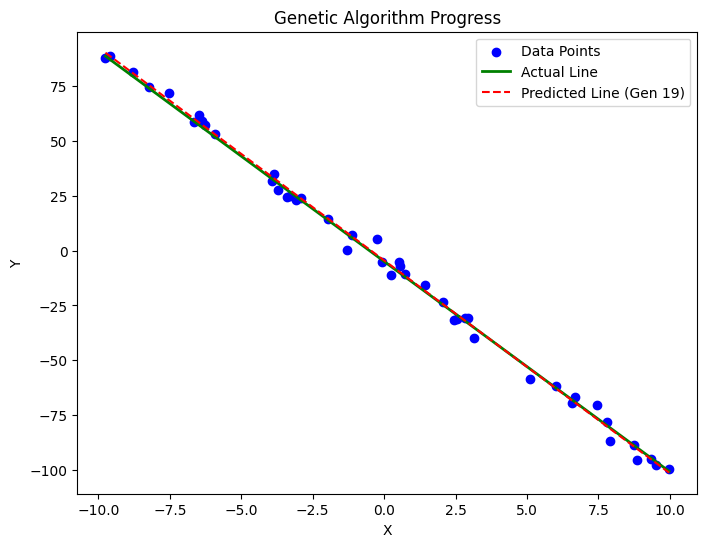

Generation  19 | Best Error: 443.794187 | Best Line: [np.float64(-9.709609817868083), np.float64(-4.437601346302718)]


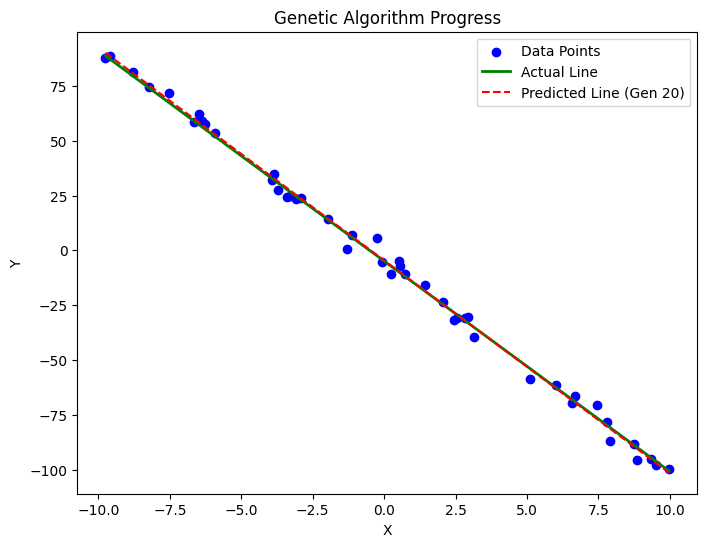

Generation  20 | Best Error: 441.250054 | Best Line: [np.float64(-9.709609817868083), np.float64(-4.5816398504942)]


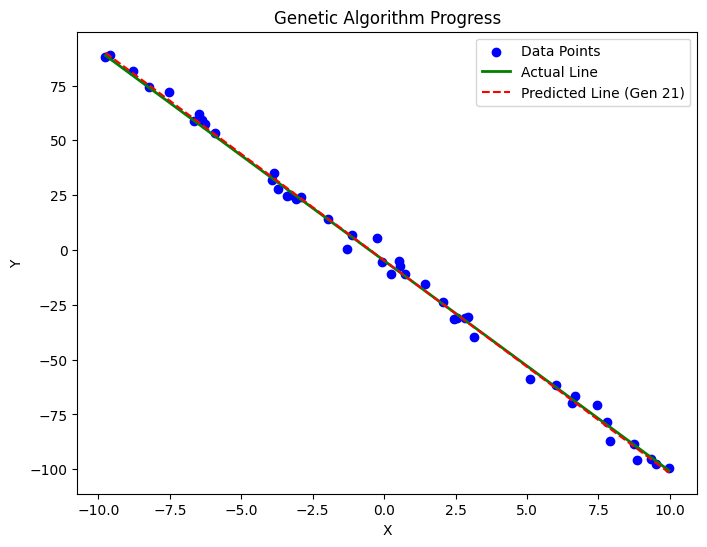

Generation  21 | Best Error: 440.626582 | Best Line: [np.float64(-9.709609817868083), np.float64(-4.745616041491379)]


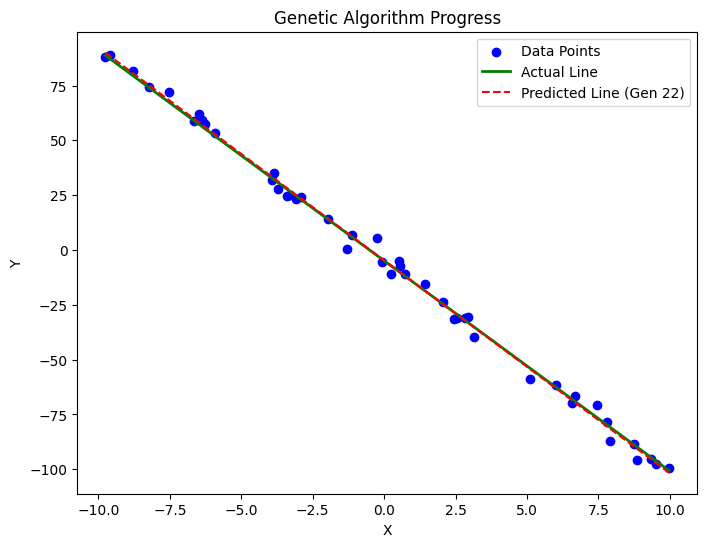

Generation  22 | Best Error: 440.626582 | Best Line: [-9.70960982 -4.74561604]


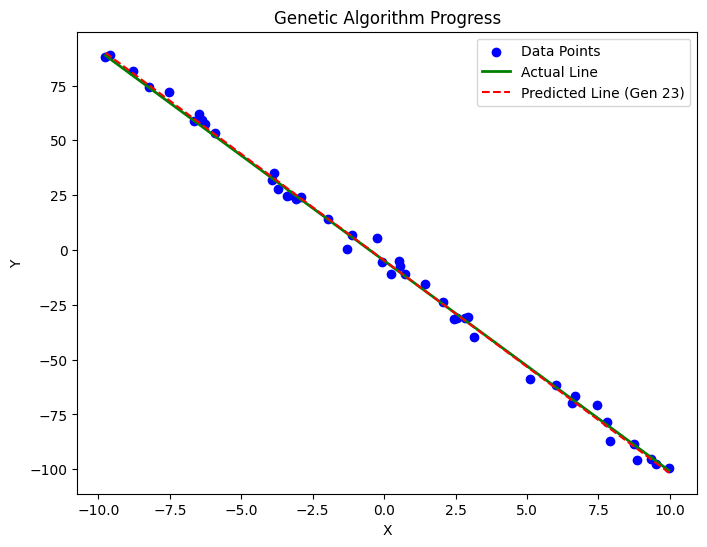

Generation  23 | Best Error: 440.626582 | Best Line: [-9.70960982 -4.74561604]


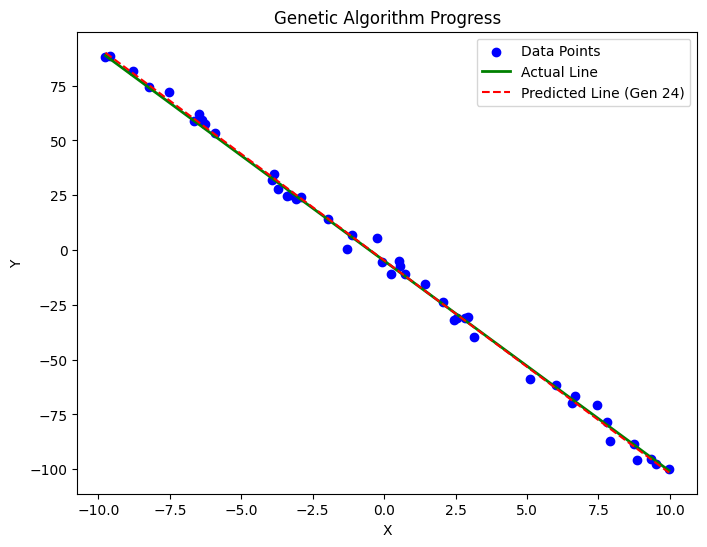

Generation  24 | Best Error: 440.555946 | Best Line: [np.float64(-9.709609817868083), np.float64(-4.708987719577268)]


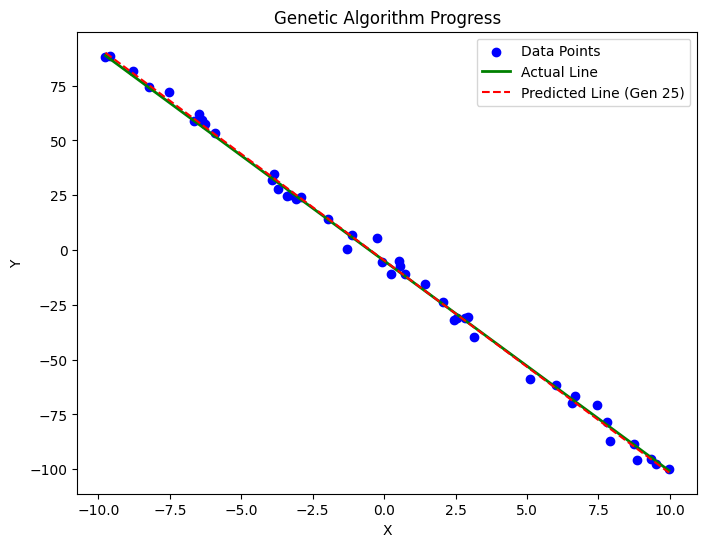

Generation  25 | Best Error: 440.555946 | Best Line: [-9.70960982 -4.70898772]


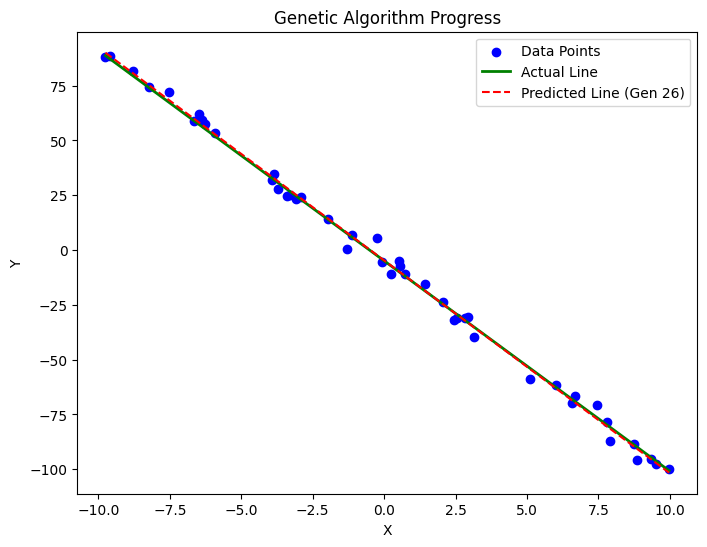

Generation  26 | Best Error: 440.555946 | Best Line: [-9.70960982 -4.70898772]


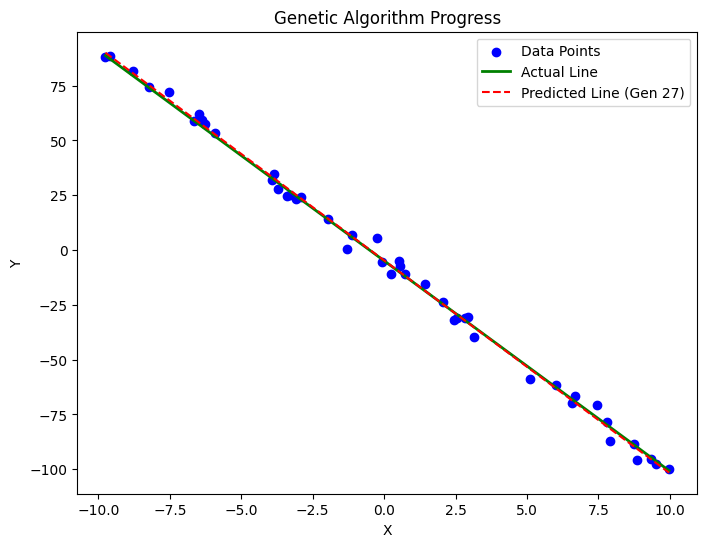

Generation  27 | Best Error: 440.555946 | Best Line: [-9.70960982 -4.70898772]


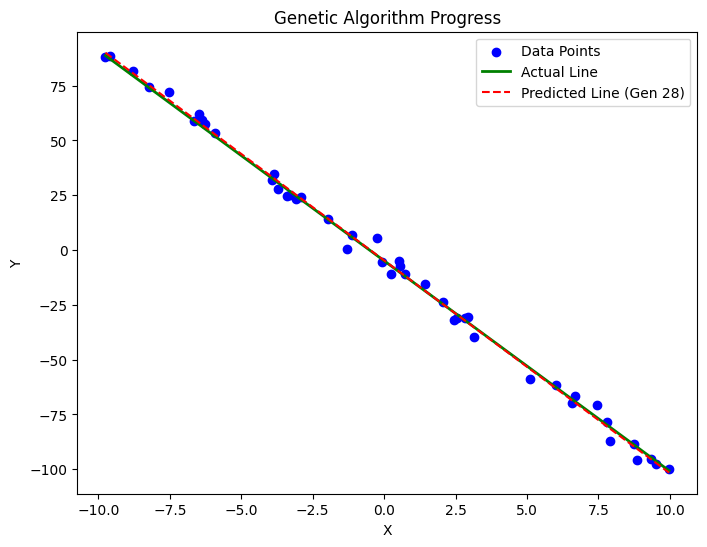

Generation  28 | Best Error: 440.555946 | Best Line: [-9.70960982 -4.70898772]


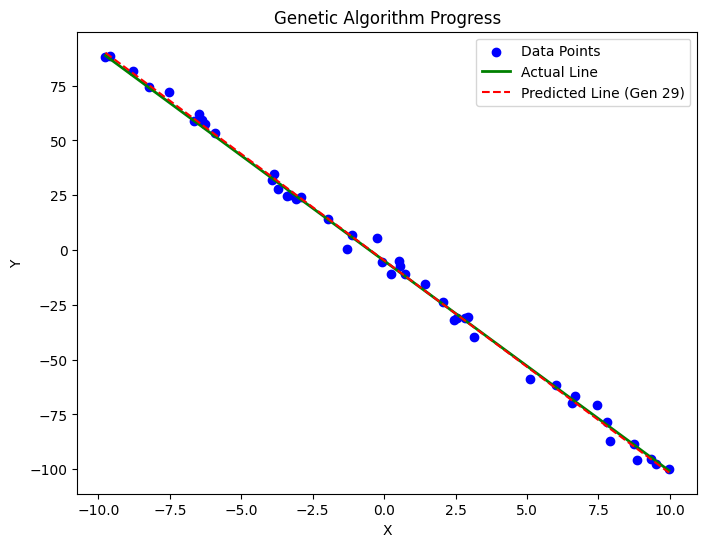

Generation  29 | Best Error: 440.555946 | Best Line: [-9.70960982 -4.70898772]


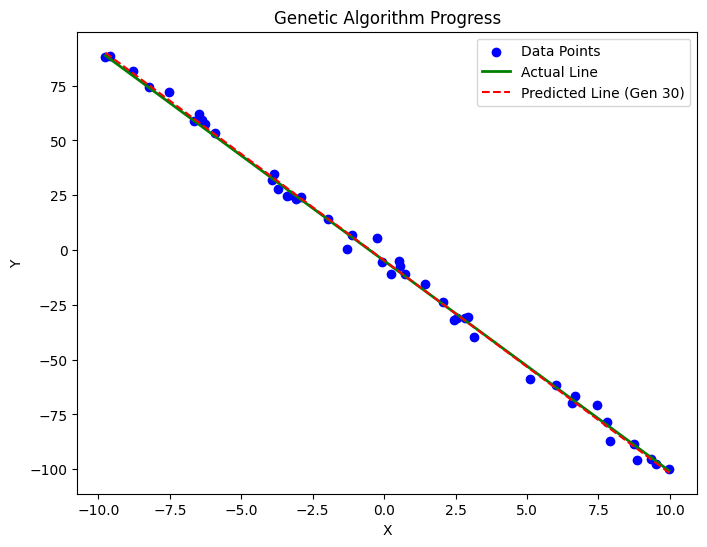

Generation  30 | Best Error: 440.555946 | Best Line: [-9.70960982 -4.70898772]


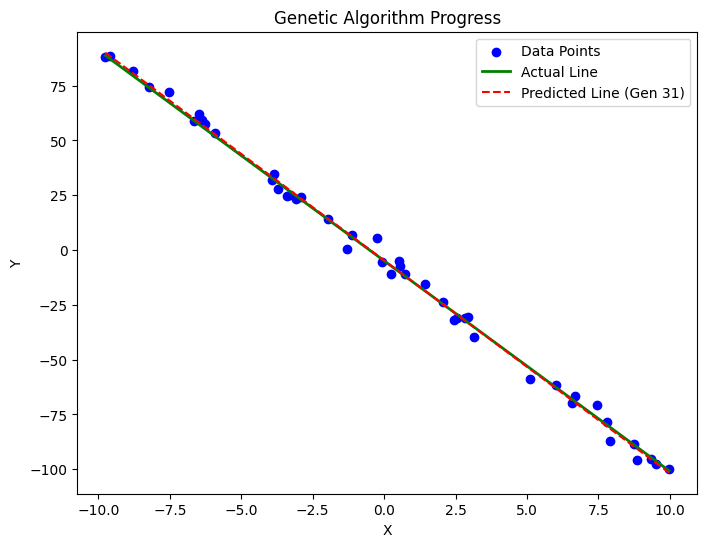

Generation  31 | Best Error: 440.555946 | Best Line: [-9.70960982 -4.70898772]


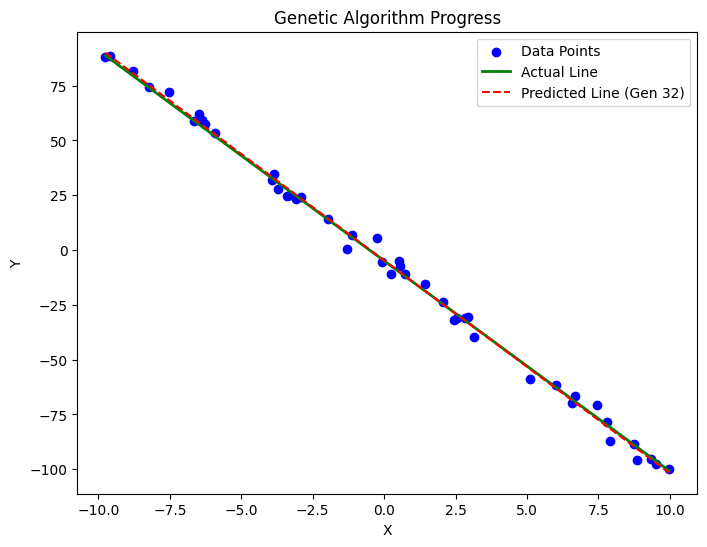

Generation  32 | Best Error: 440.555946 | Best Line: [-9.70960982 -4.70898772]


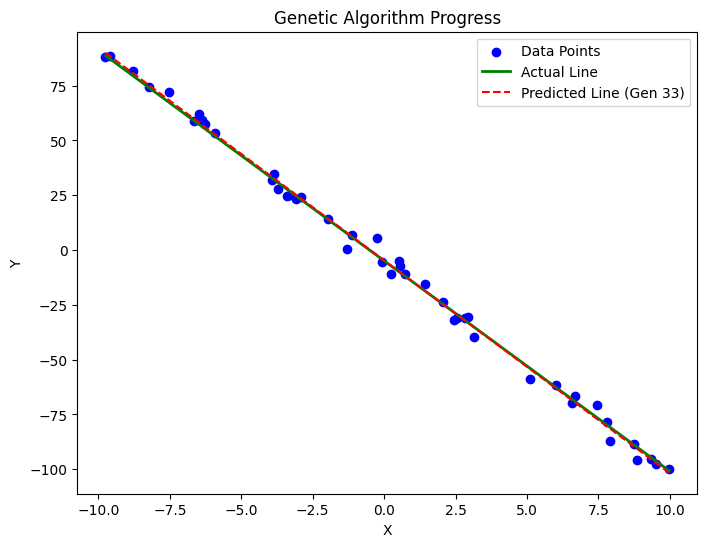

Generation  33 | Best Error: 440.555946 | Best Line: [-9.70960982 -4.70898772]


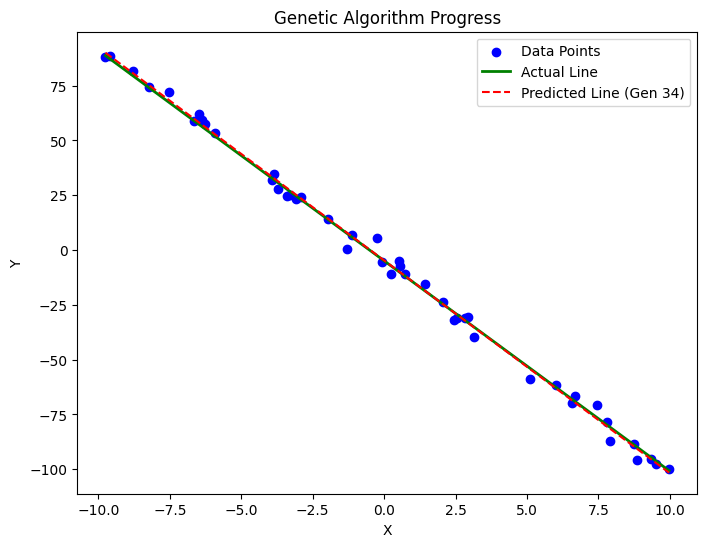

Generation  34 | Best Error: 440.555946 | Best Line: [-9.70960982 -4.70898772]


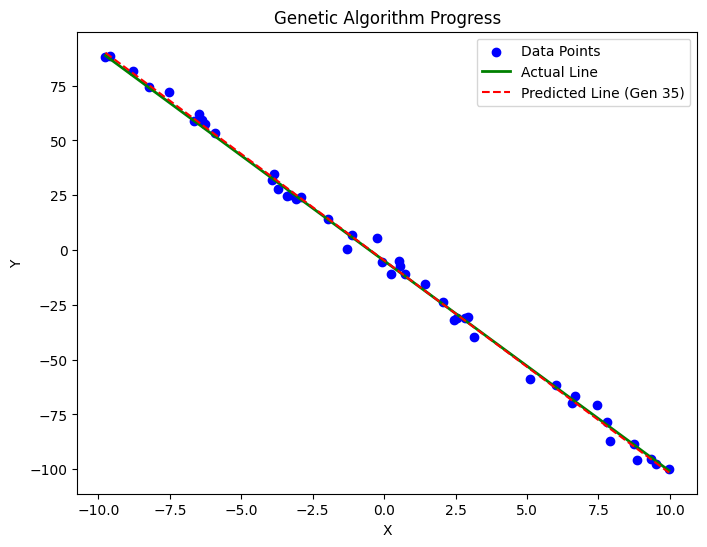

Generation  35 | Best Error: 440.555946 | Best Line: [-9.70960982 -4.70898772]


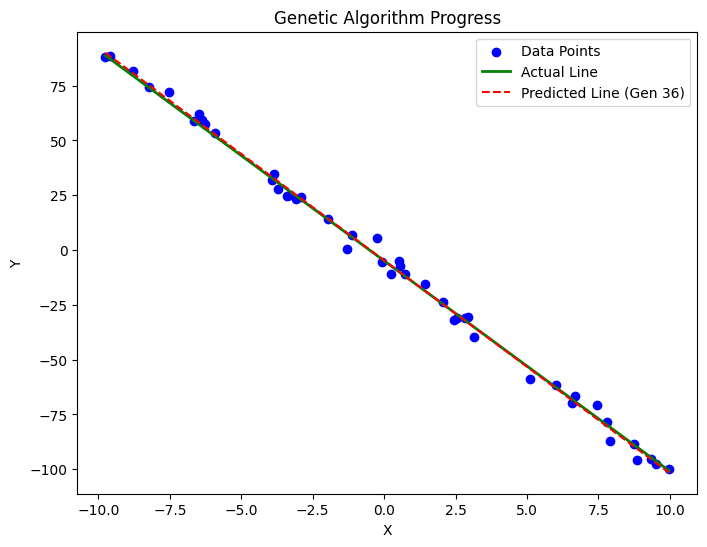

Generation  36 | Best Error: 440.555946 | Best Line: [-9.70960982 -4.70898772]


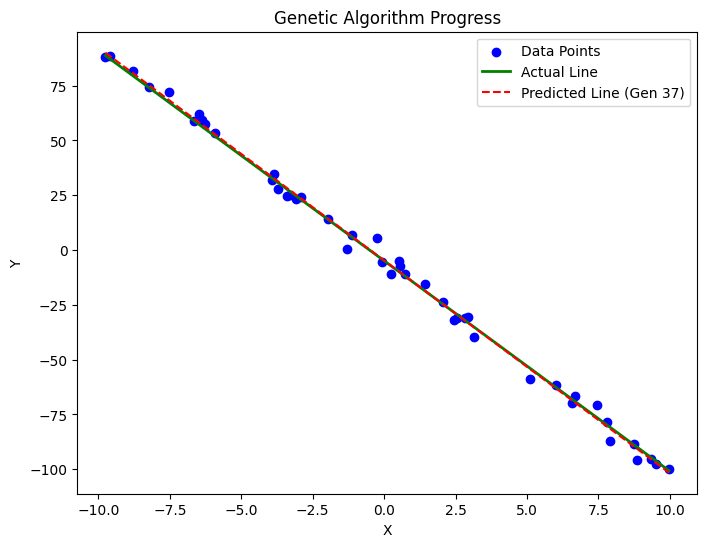

Generation  37 | Best Error: 440.555946 | Best Line: [-9.70960982 -4.70898772]


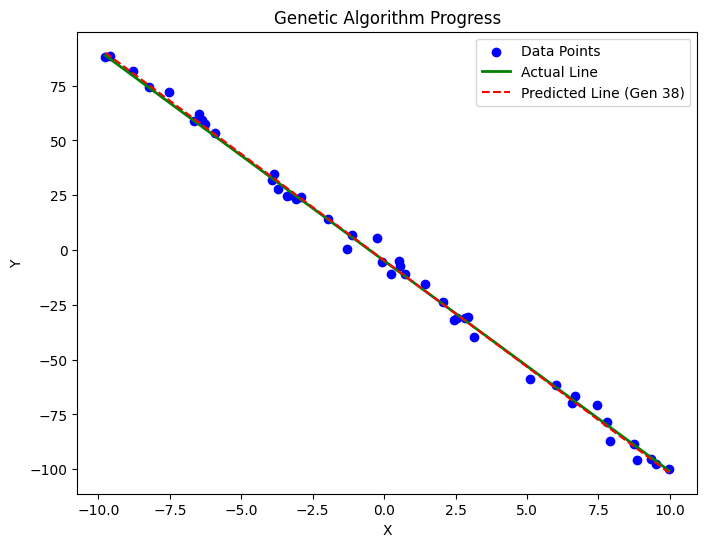

Generation  38 | Best Error: 440.555946 | Best Line: [-9.70960982 -4.70898772]


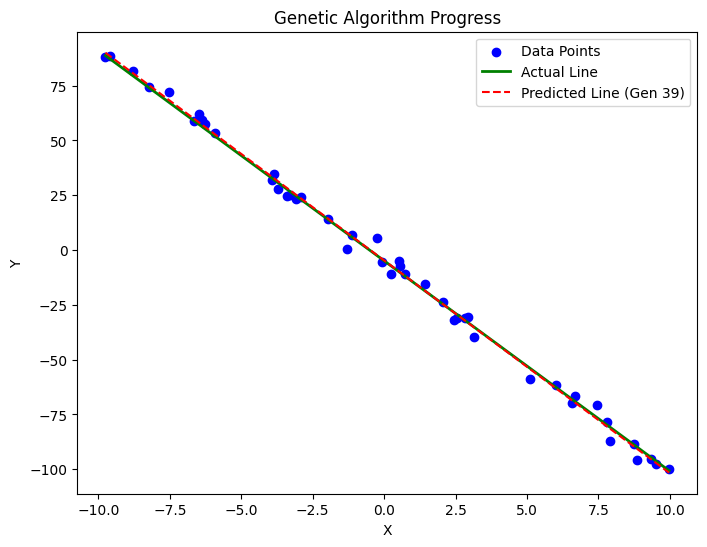

Generation  39 | Best Error: 440.555946 | Best Line: [-9.70960982 -4.70898772]


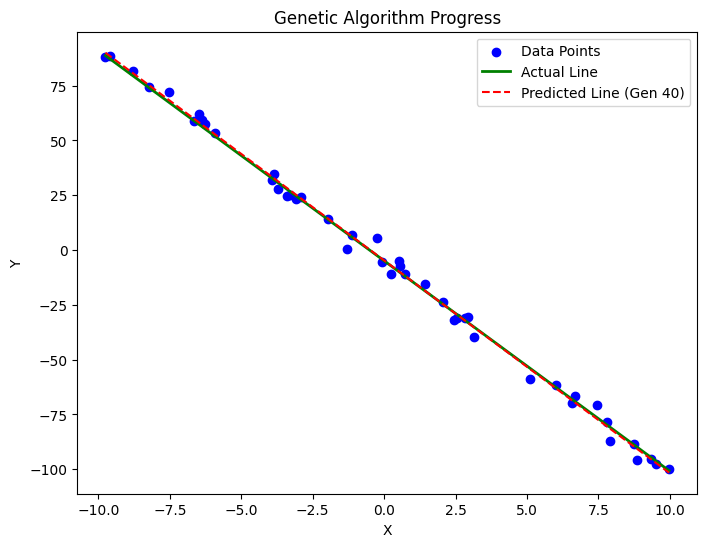

Generation  40 | Best Error: 440.555946 | Best Line: [-9.70960982 -4.70898772]


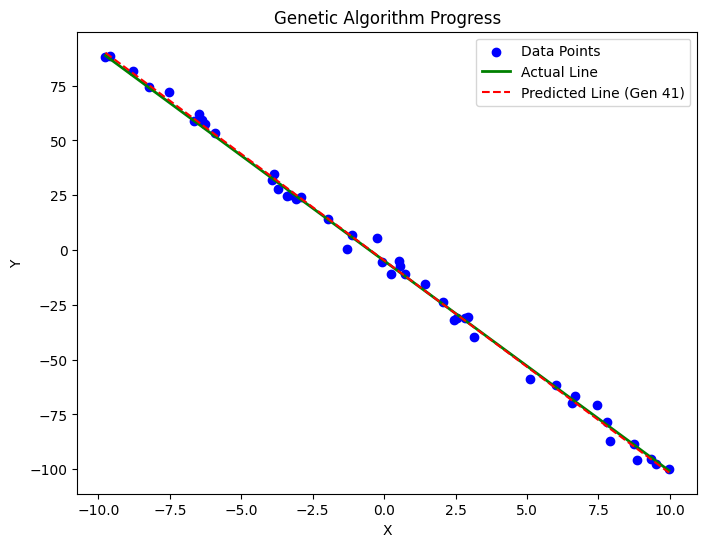

Generation  41 | Best Error: 440.555946 | Best Line: [-9.70960982 -4.70898772]


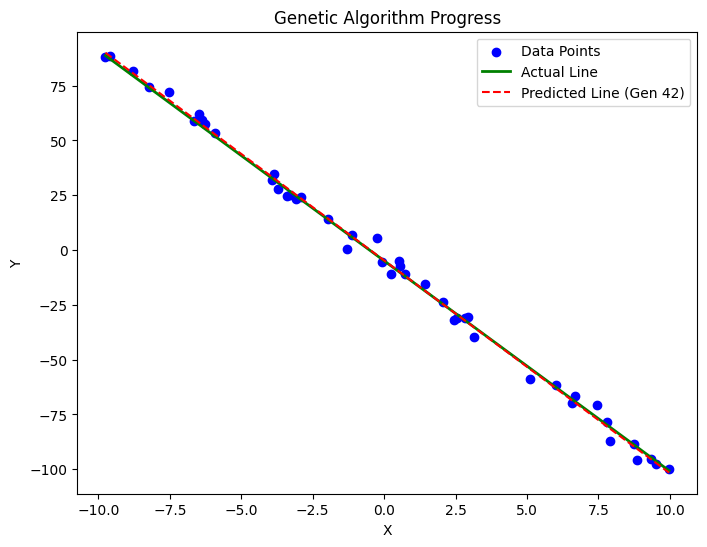

Generation  42 | Best Error: 440.555946 | Best Line: [-9.70960982 -4.70898772]


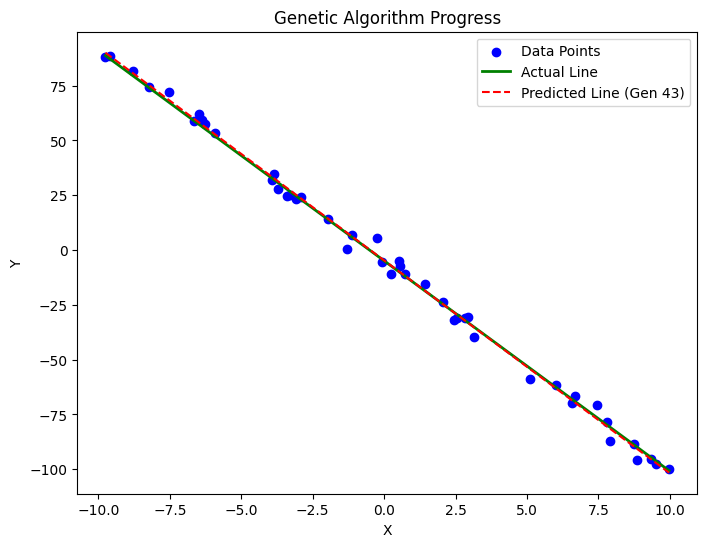

Generation  43 | Best Error: 440.555946 | Best Line: [-9.70960982 -4.70898772]


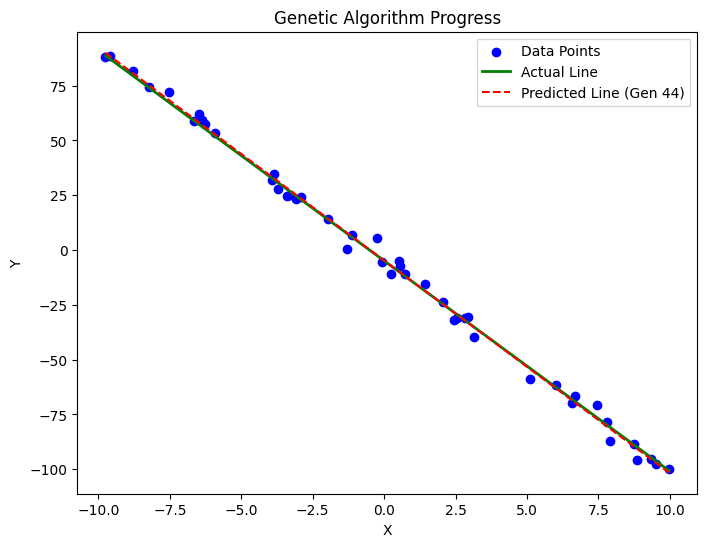

Generation  44 | Best Error: 440.555946 | Best Line: [-9.70960982 -4.70898772]


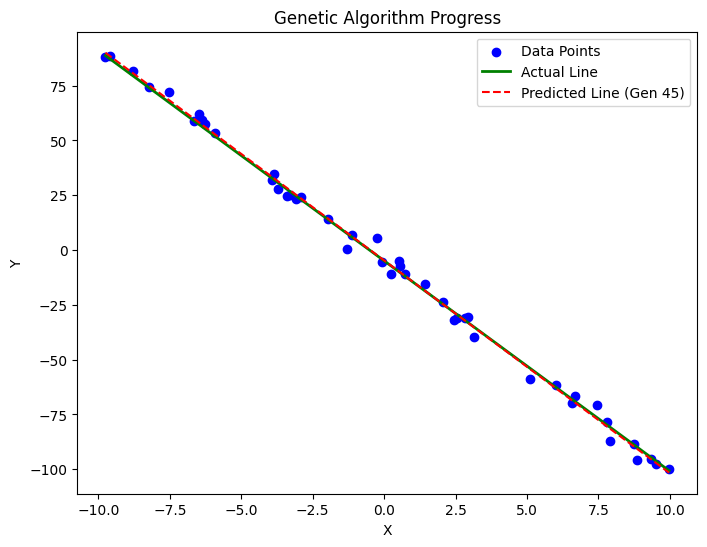

Generation  45 | Best Error: 440.555946 | Best Line: [-9.70960982 -4.70898772]


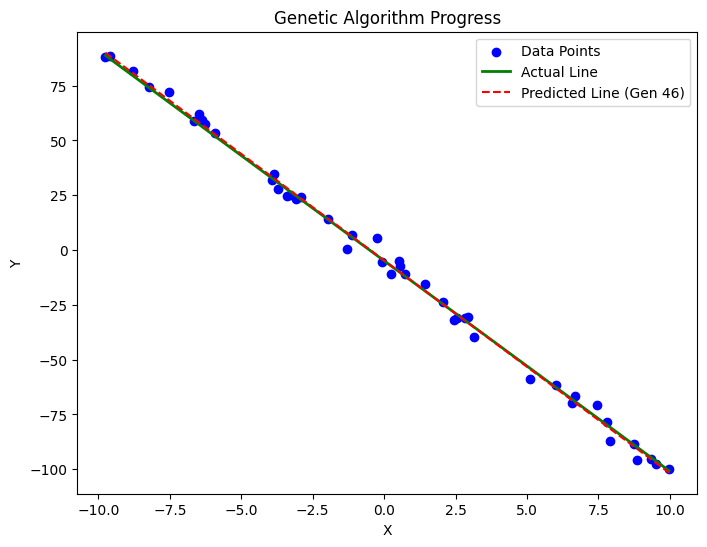

Generation  46 | Best Error: 440.555946 | Best Line: [-9.70960982 -4.70898772]


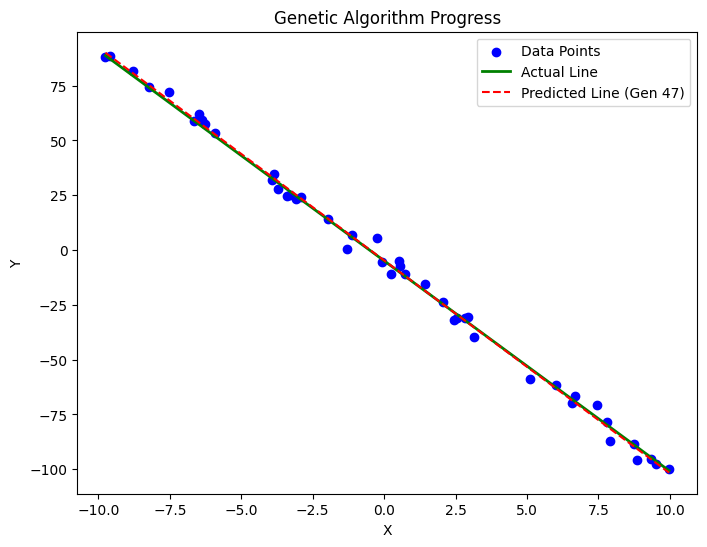

Generation  47 | Best Error: 440.555946 | Best Line: [-9.70960982 -4.70898772]


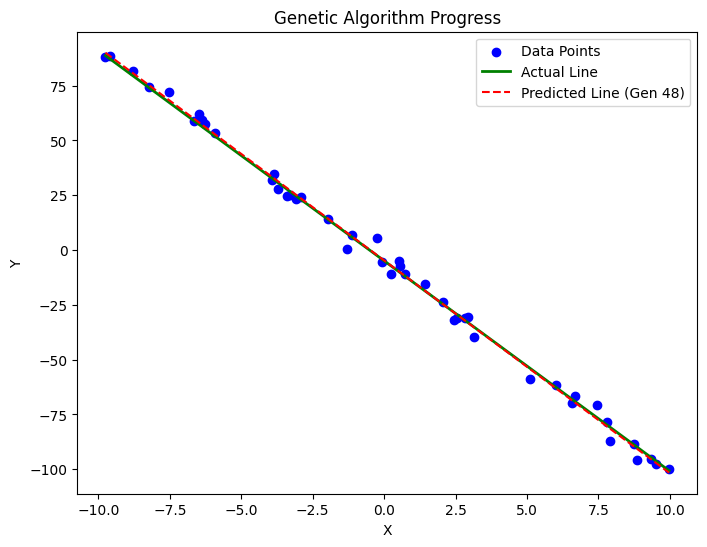

Generation  48 | Best Error: 440.555634 | Best Line: [np.float64(-9.709609817868083), np.float64(-4.7075332614722365)]


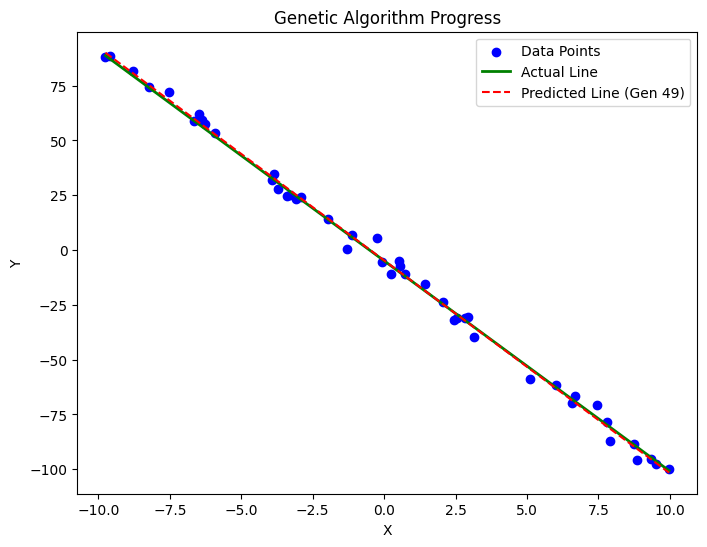

Generation  49 | Best Error: 440.555634 | Best Line: [-9.70960982 -4.70753326]


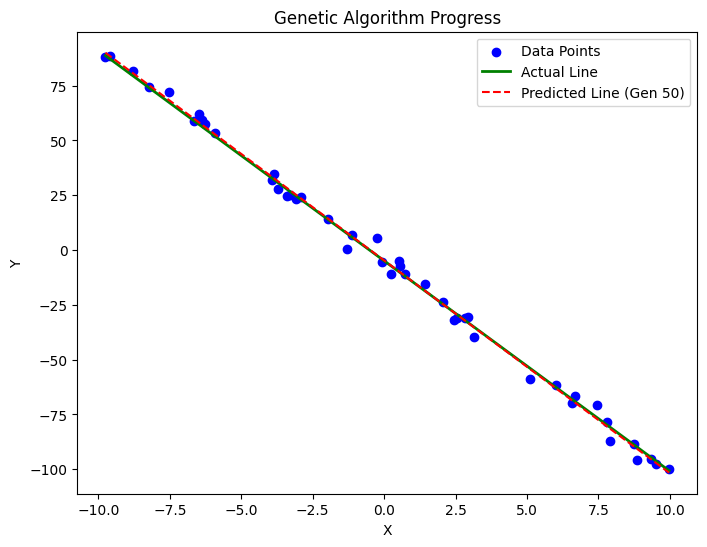

Generation  50 | Best Error: 440.555634 | Best Line: [-9.70960982 -4.70753326]


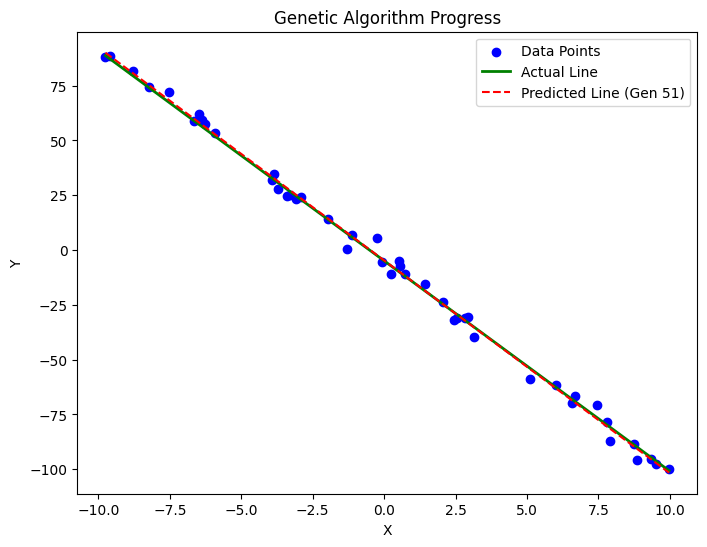

Generation  51 | Best Error: 440.555634 | Best Line: [-9.70960982 -4.70753326]


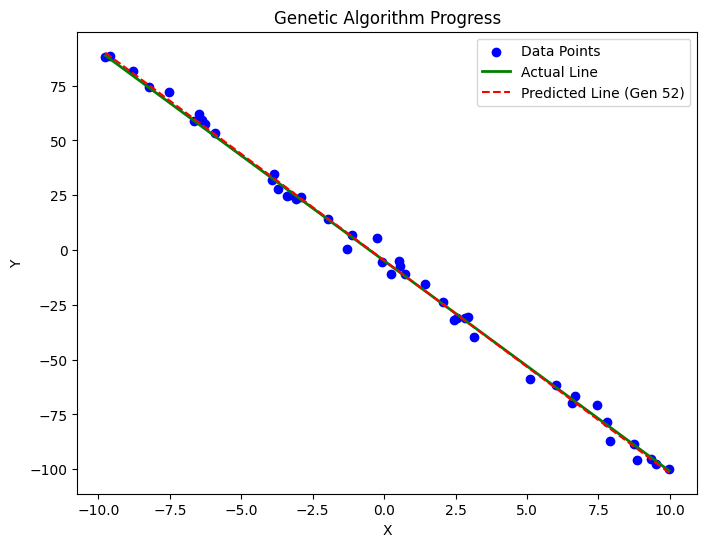

Generation  52 | Best Error: 440.555634 | Best Line: [-9.70960982 -4.70753326]


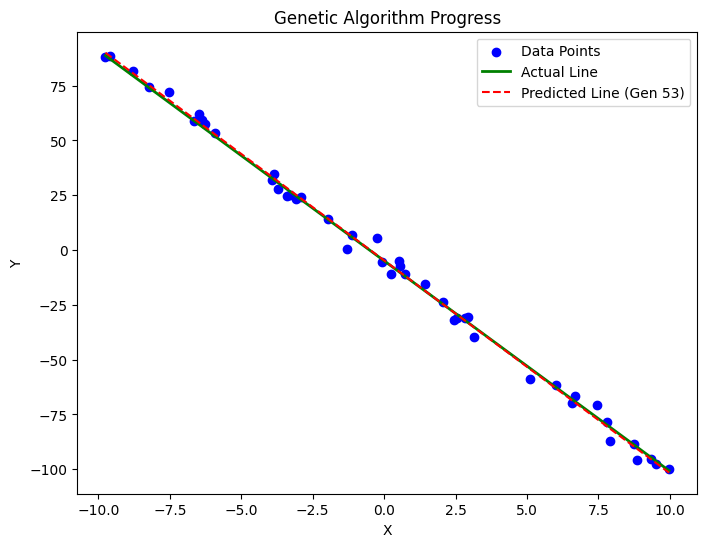

Generation  53 | Best Error: 440.555634 | Best Line: [-9.70960982 -4.70753326]


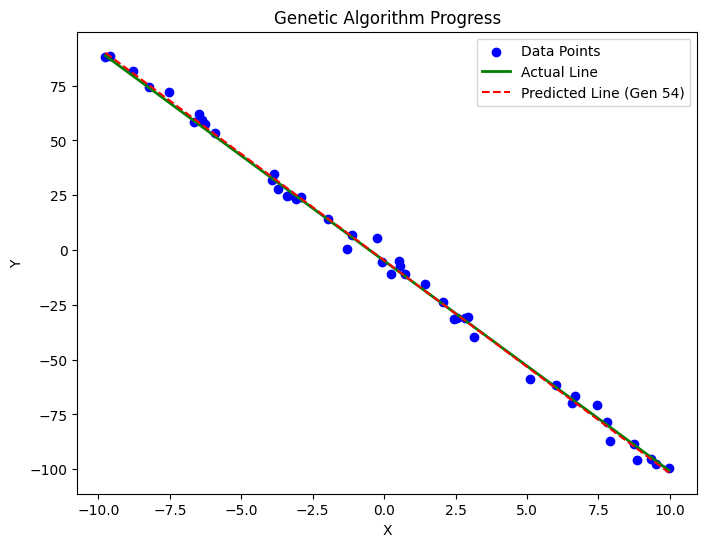

Generation  54 | Best Error: 440.522850 | Best Line: [np.float64(-9.714055217112895), np.float64(-4.7075332614722365)]


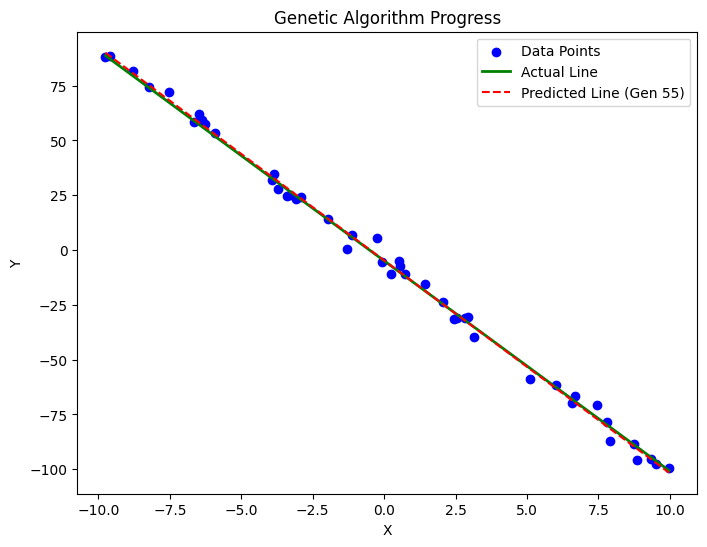

Generation  55 | Best Error: 440.522850 | Best Line: [-9.71405522 -4.70753326]


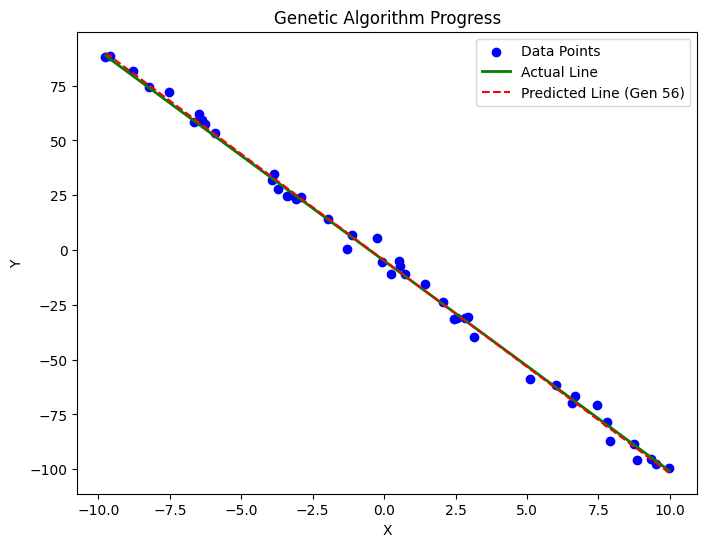

Generation  56 | Best Error: 440.522684 | Best Line: [np.float64(-9.714055217112895), np.float64(-4.7066441030595)]


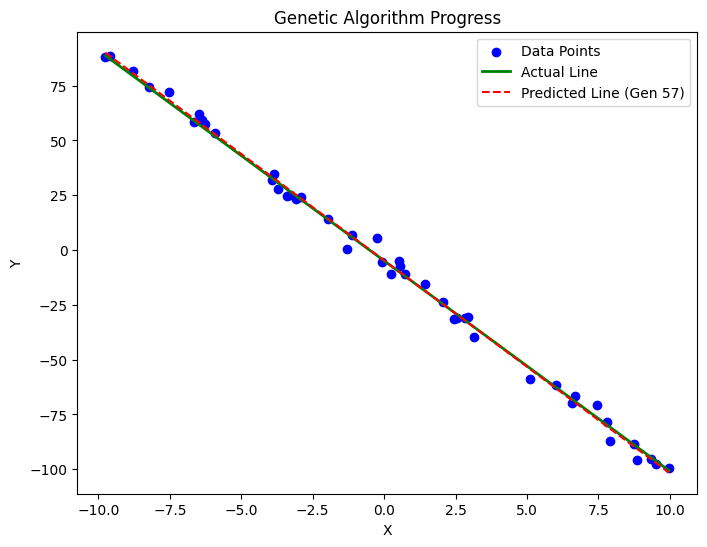

Generation  57 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


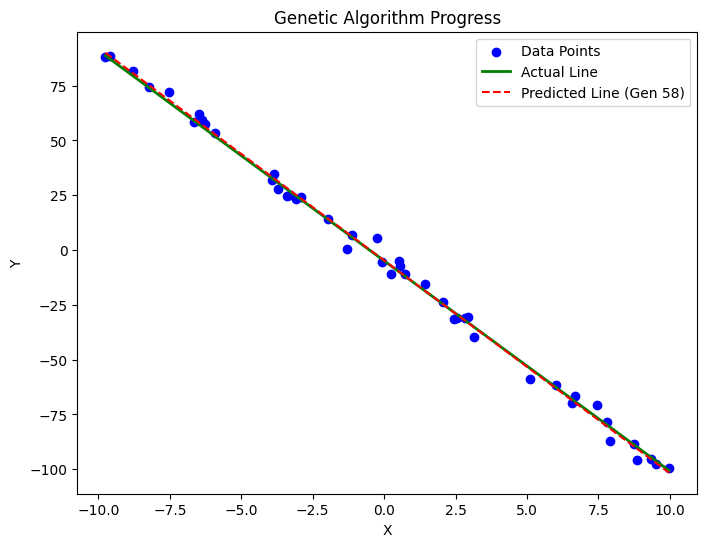

Generation  58 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


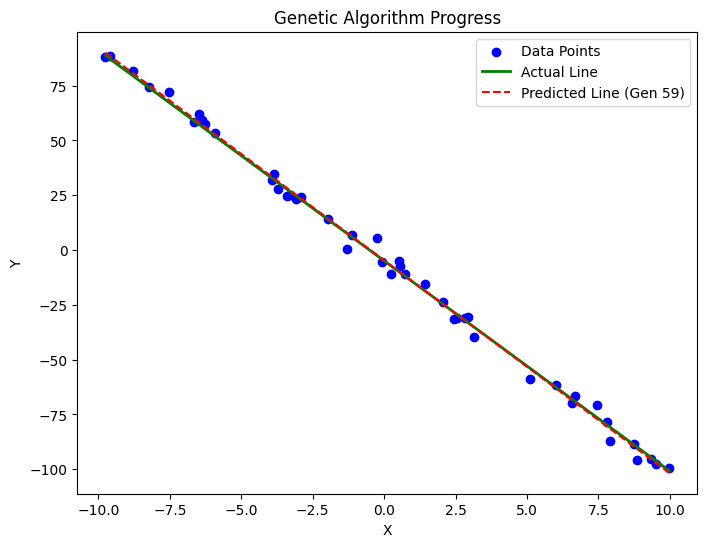

Generation  59 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


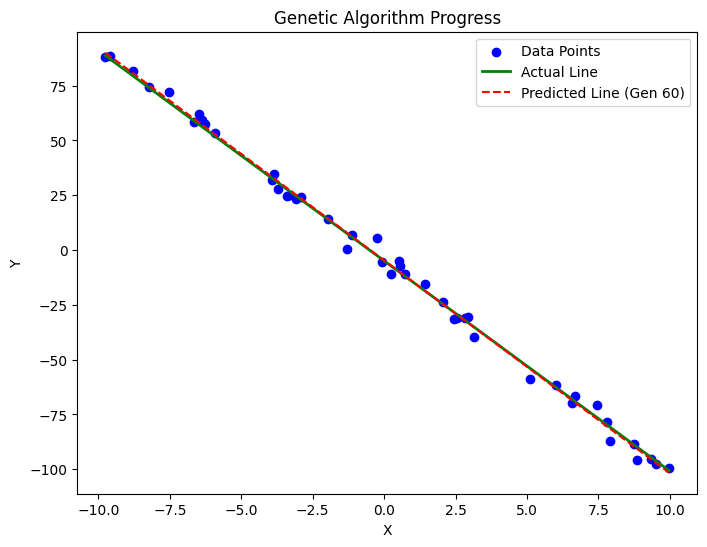

Generation  60 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


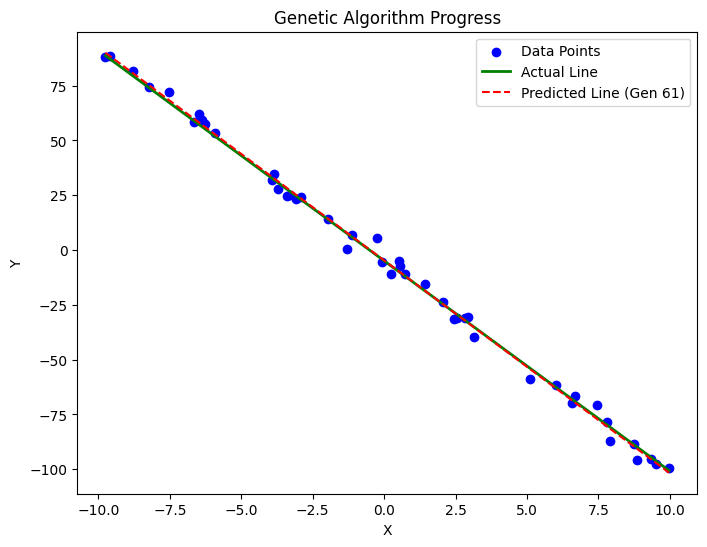

Generation  61 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


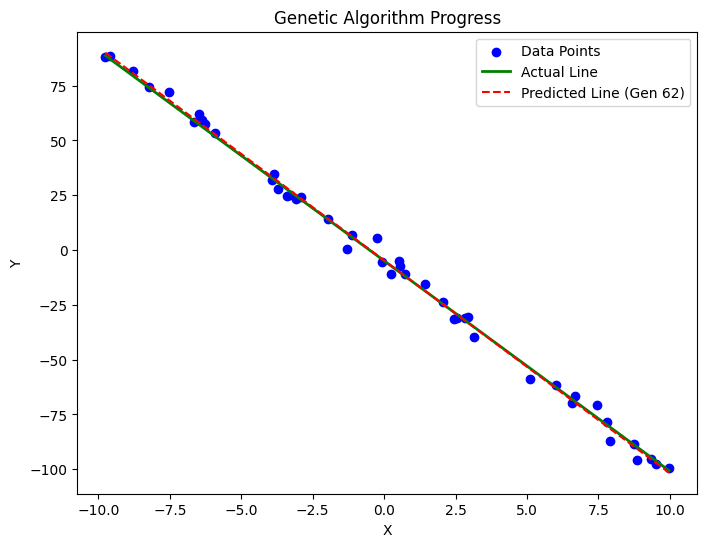

Generation  62 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


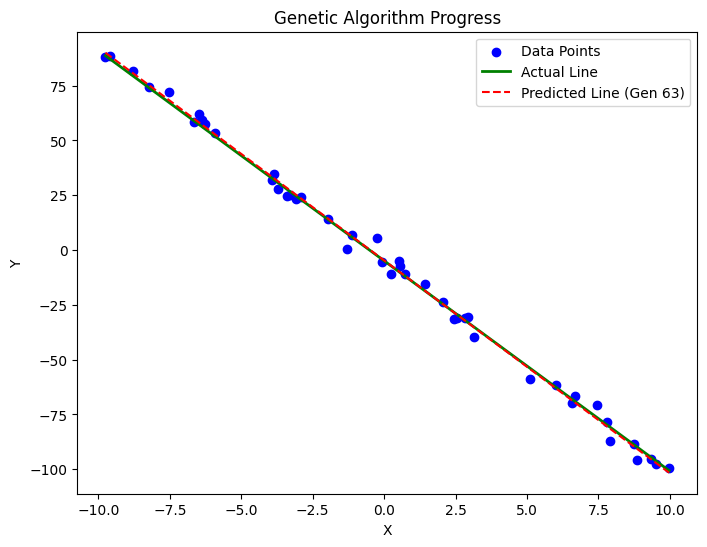

Generation  63 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


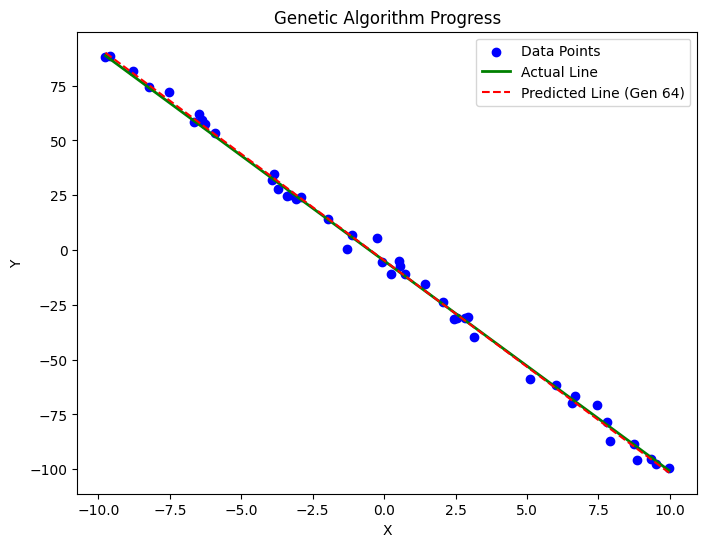

Generation  64 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


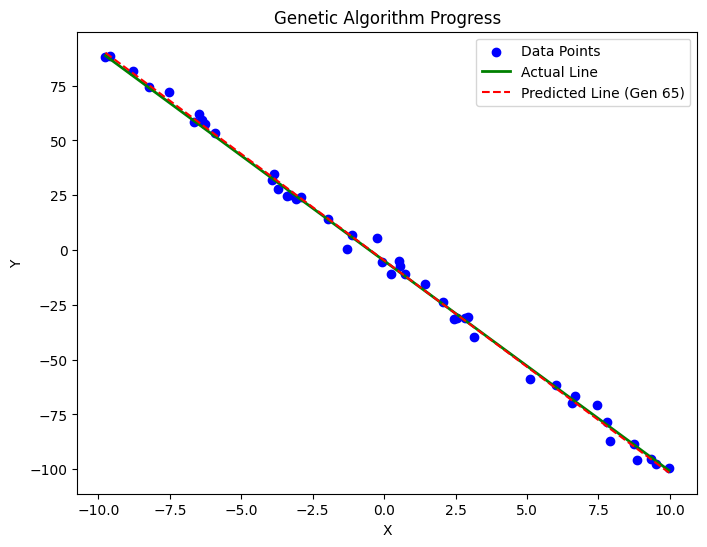

Generation  65 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


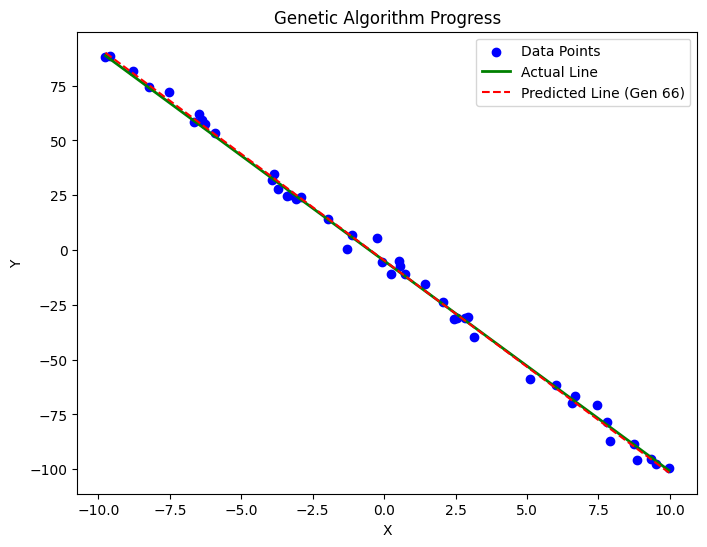

Generation  66 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


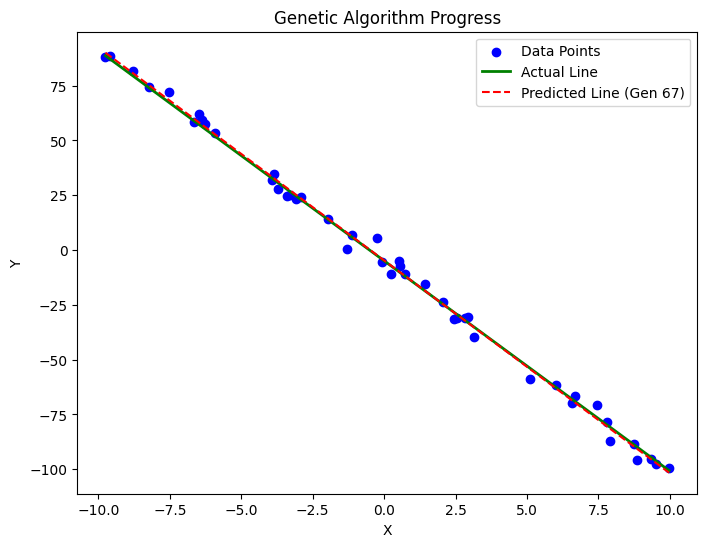

Generation  67 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


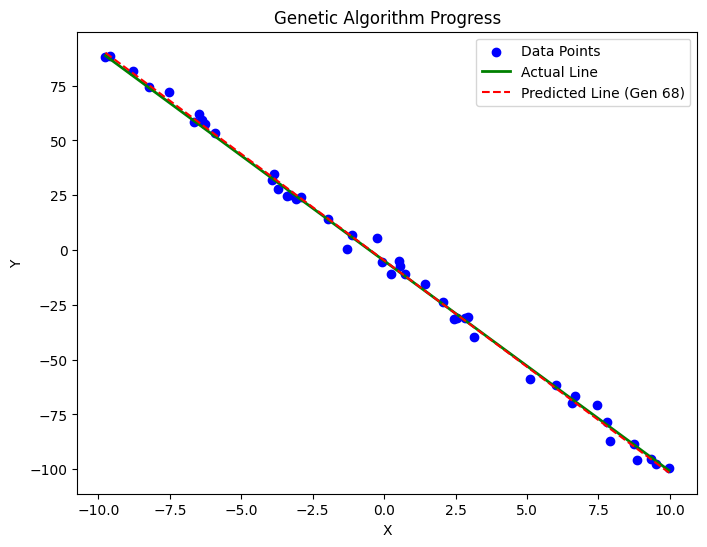

Generation  68 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


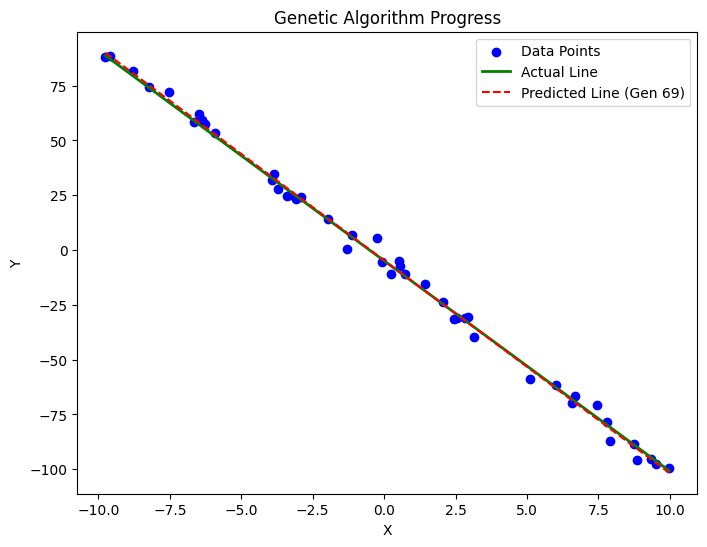

Generation  69 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


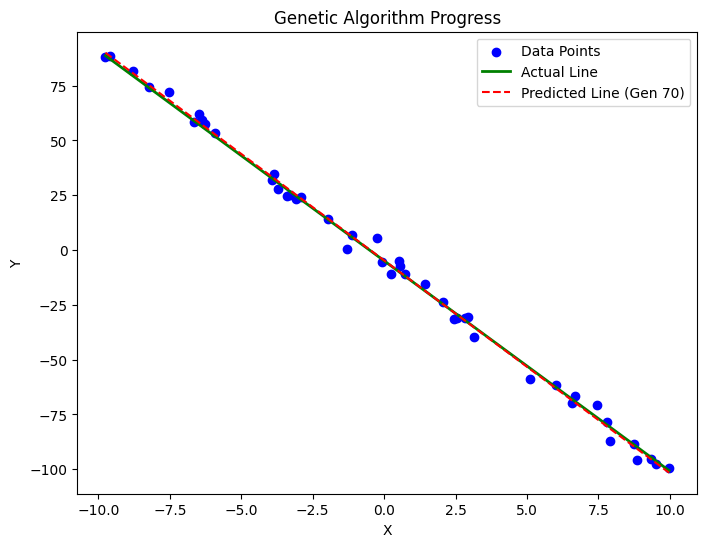

Generation  70 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


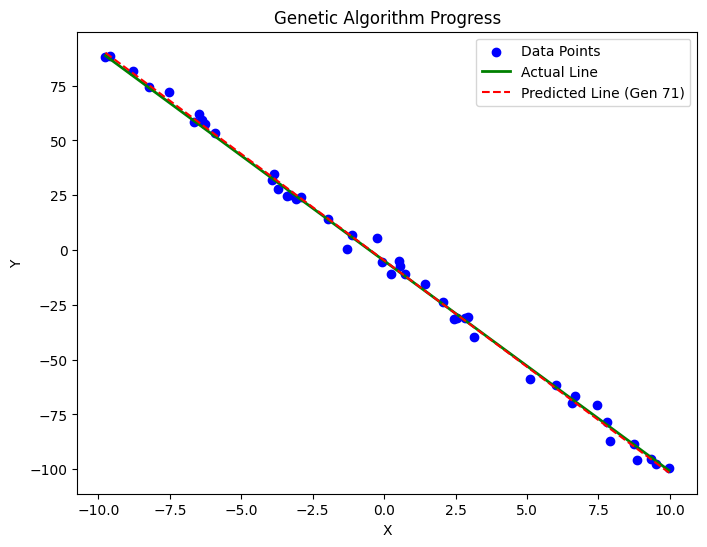

Generation  71 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


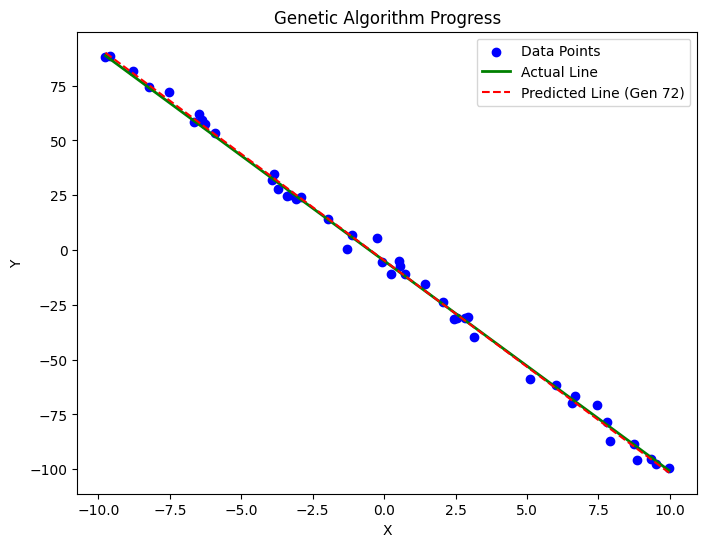

Generation  72 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


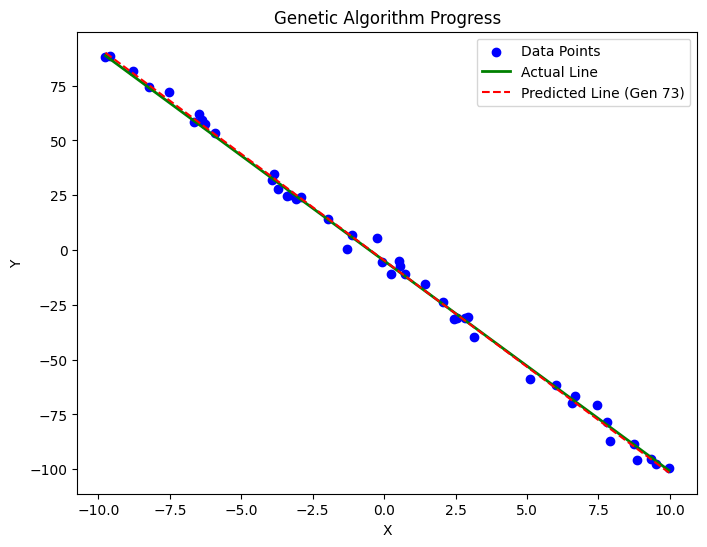

Generation  73 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


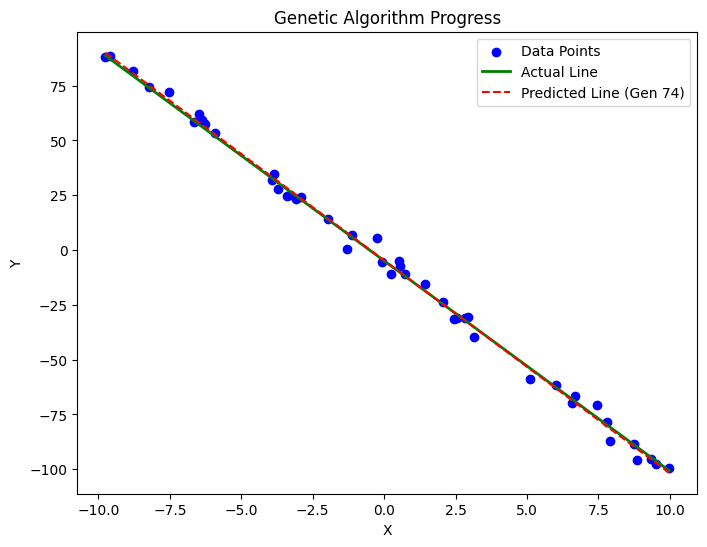

Generation  74 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


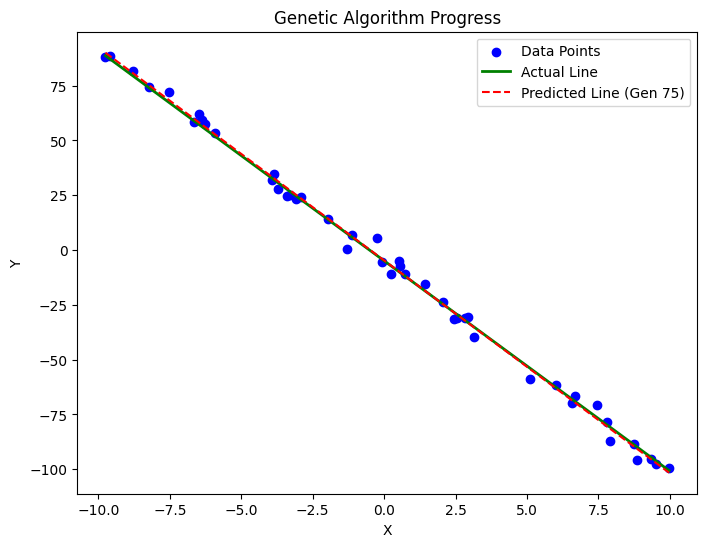

Generation  75 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


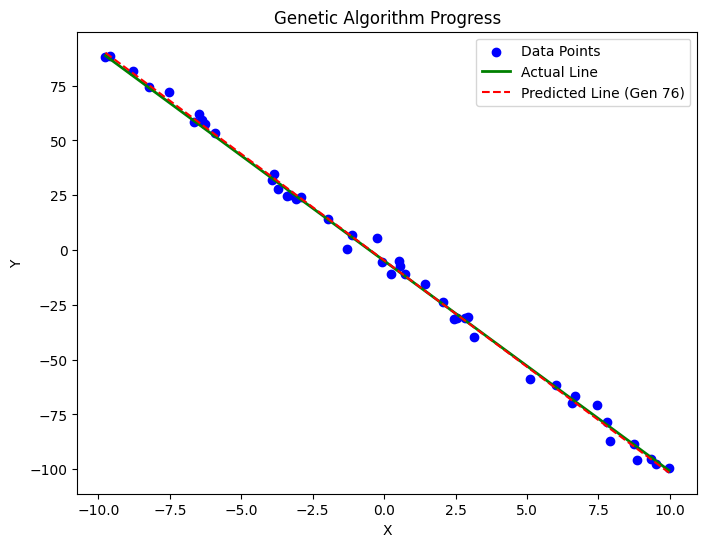

Generation  76 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


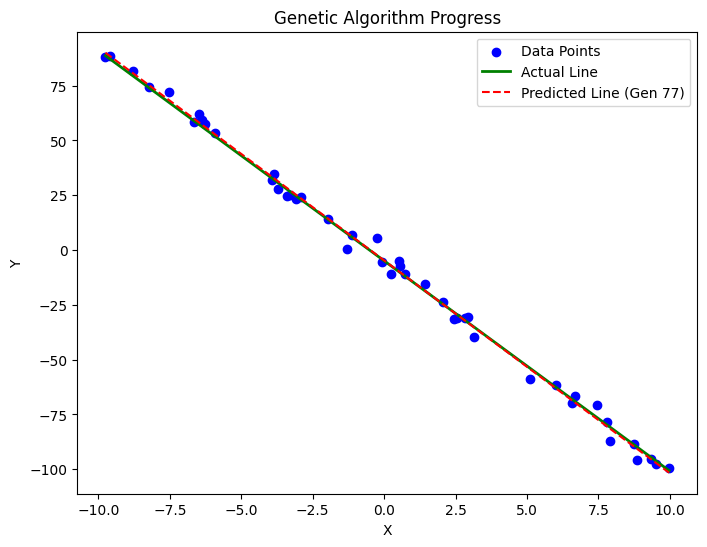

Generation  77 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


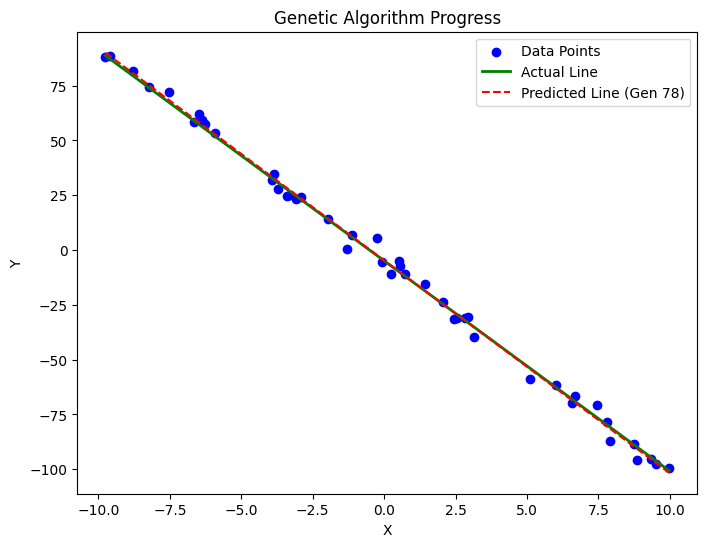

Generation  78 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


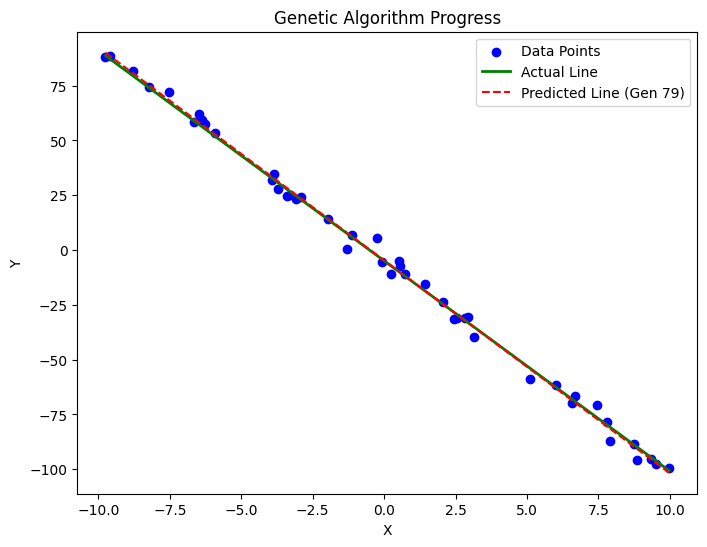

Generation  79 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


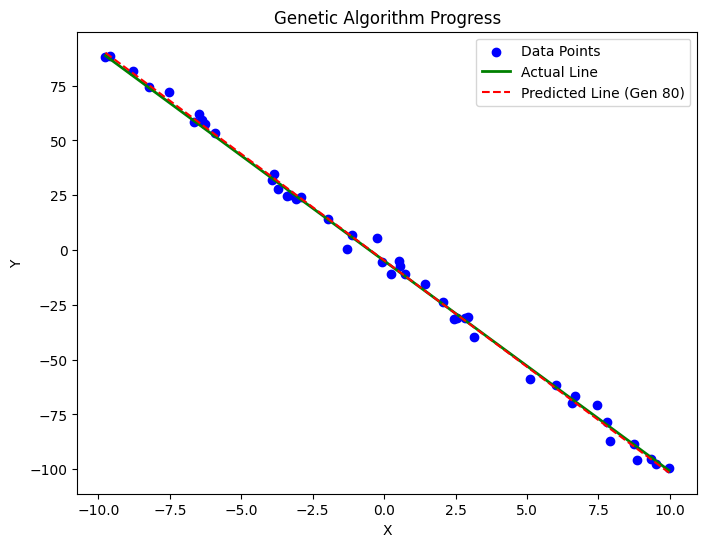

Generation  80 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


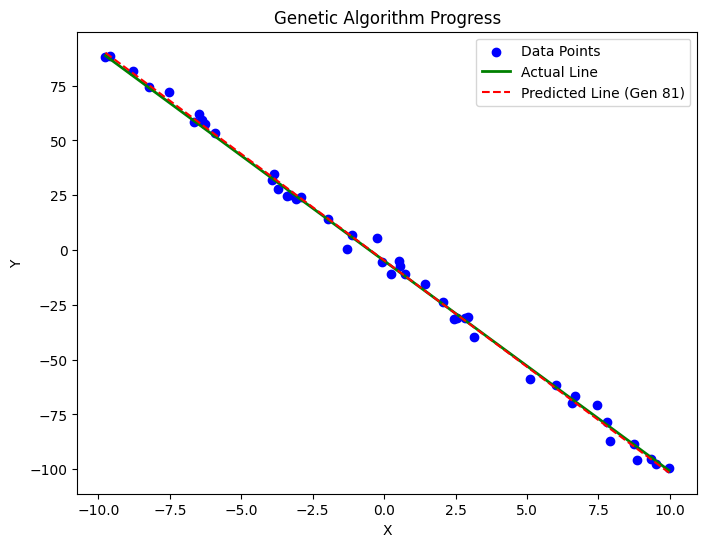

Generation  81 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


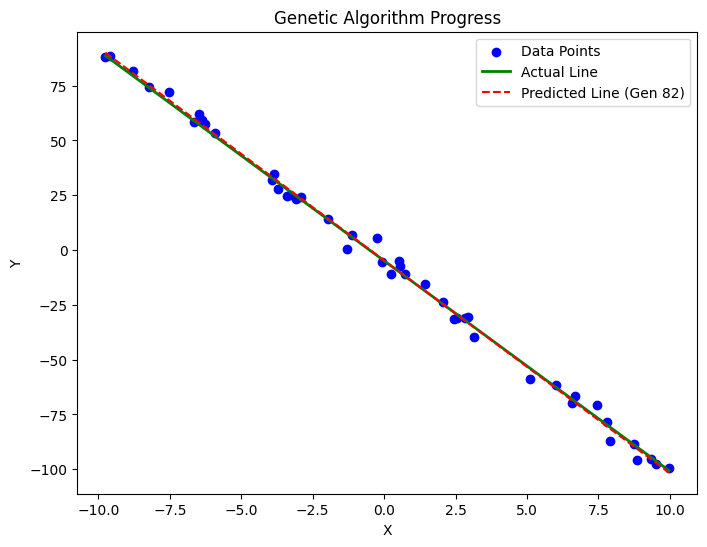

Generation  82 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


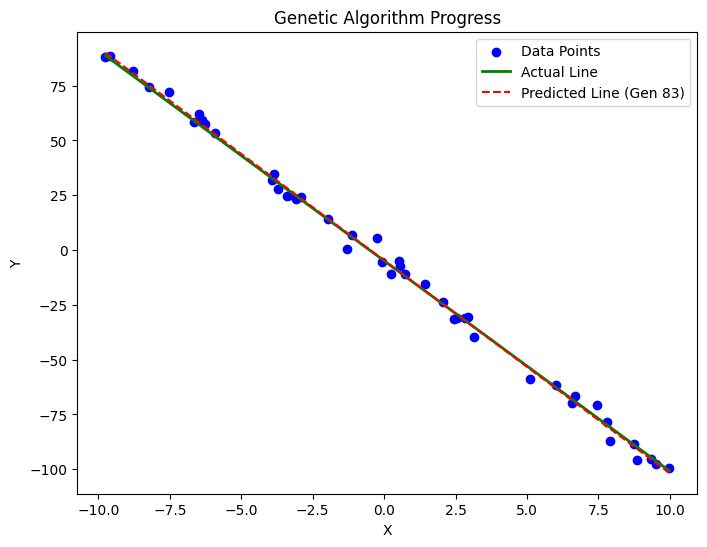

Generation  83 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


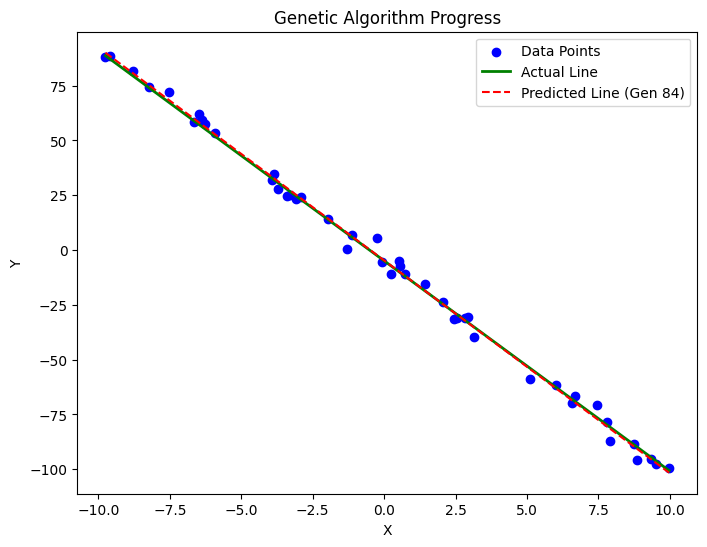

Generation  84 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


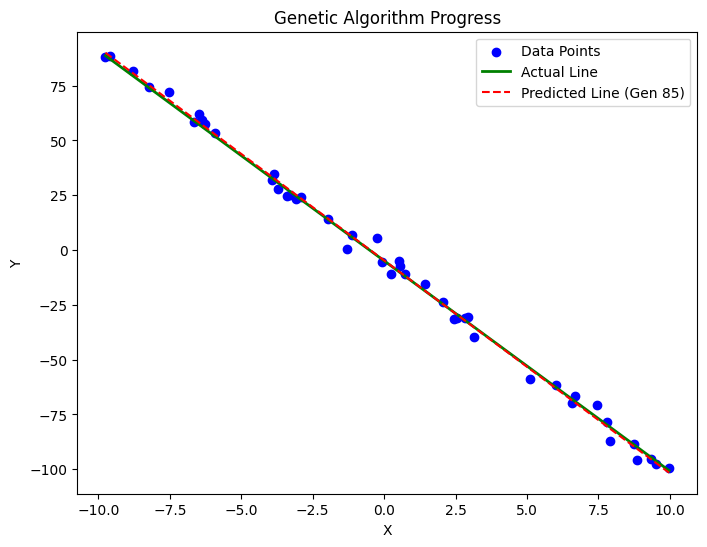

Generation  85 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


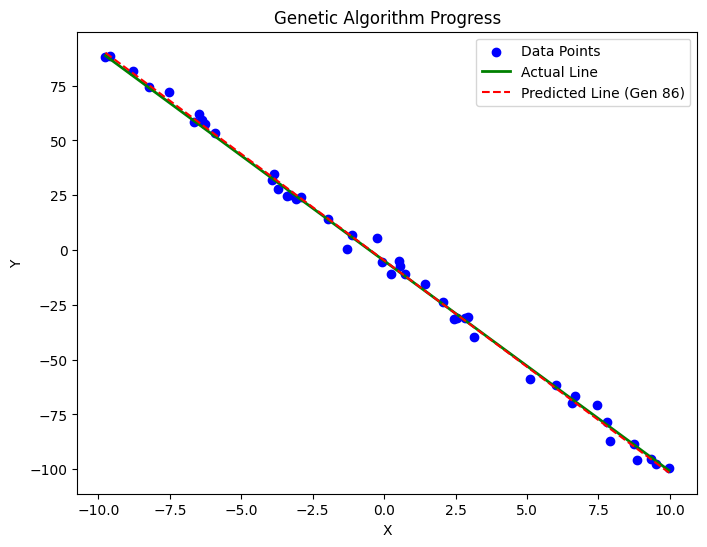

Generation  86 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


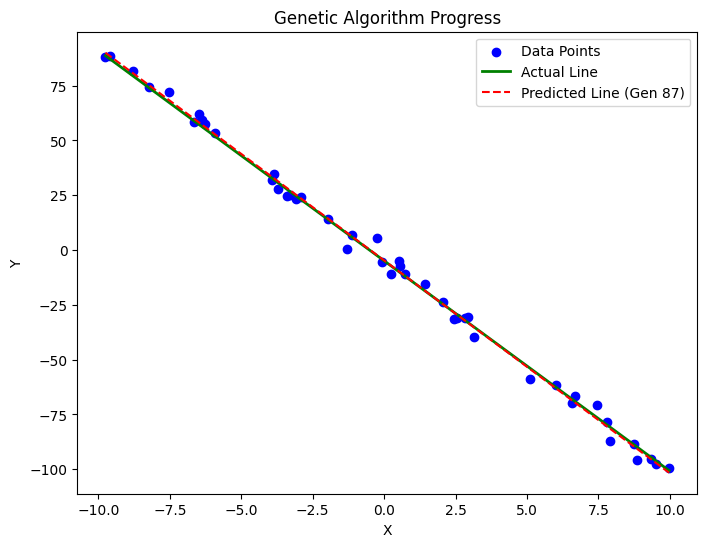

Generation  87 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


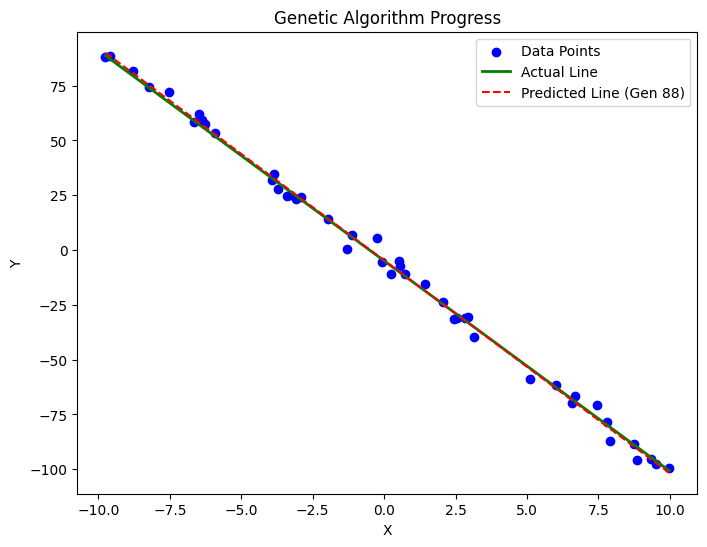

Generation  88 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


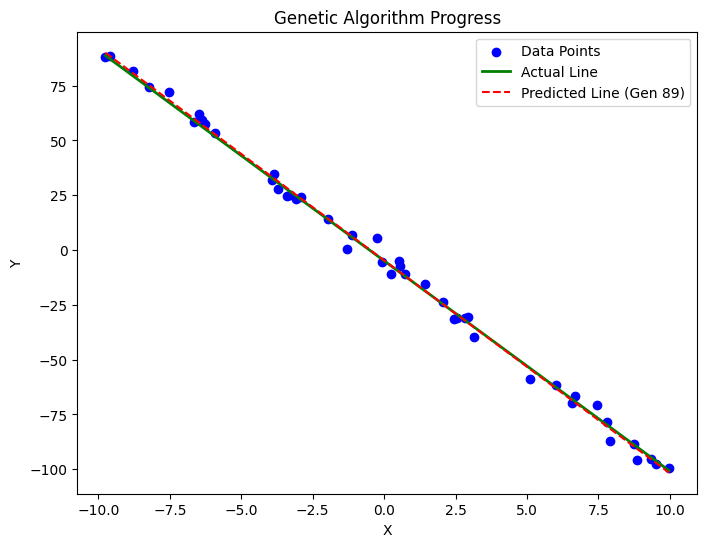

Generation  89 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


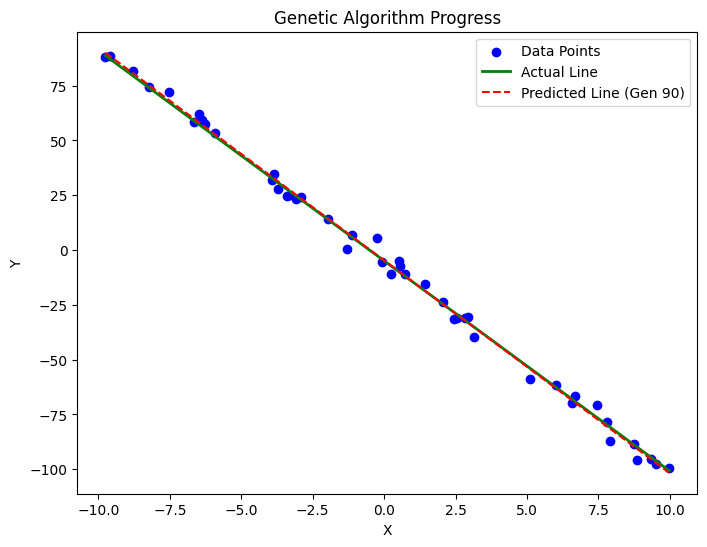

Generation  90 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


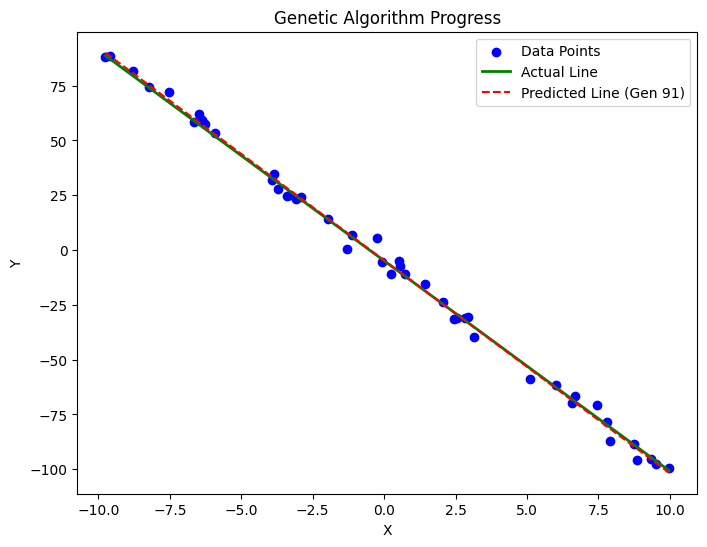

Generation  91 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


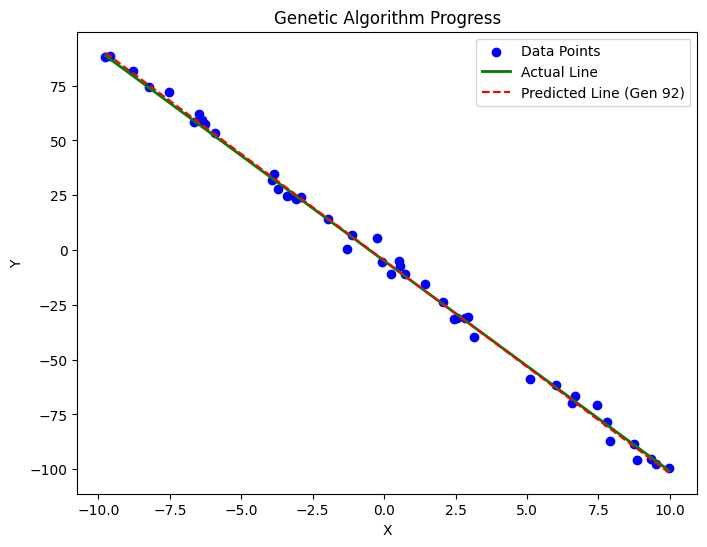

Generation  92 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


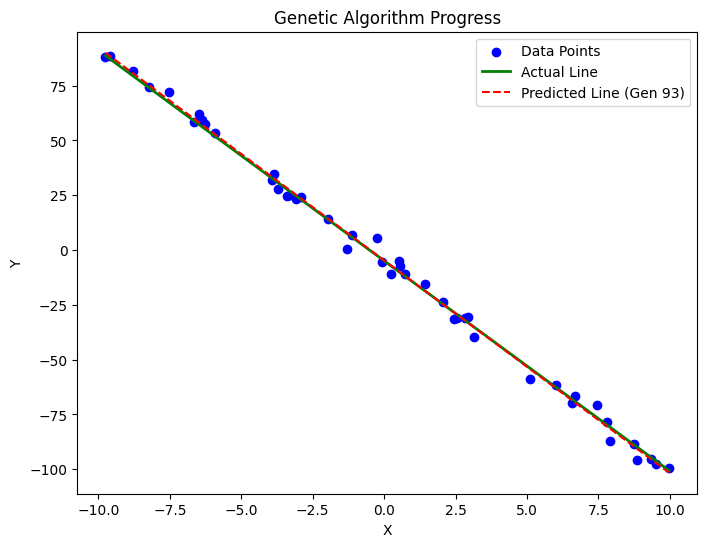

Generation  93 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


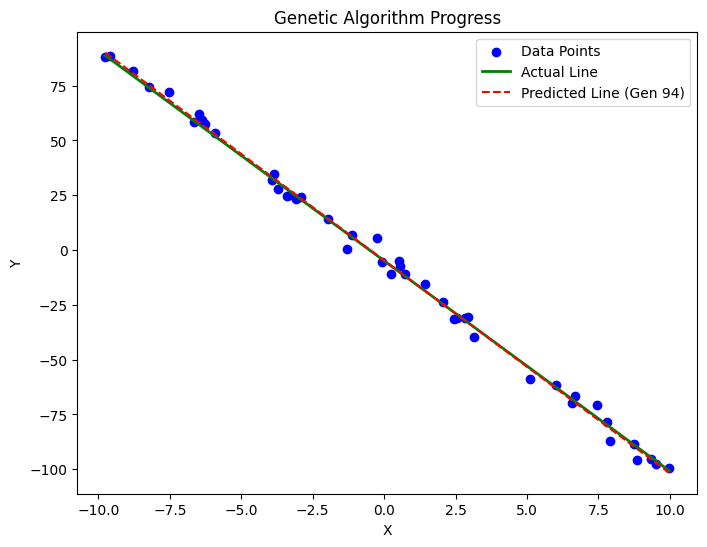

Generation  94 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


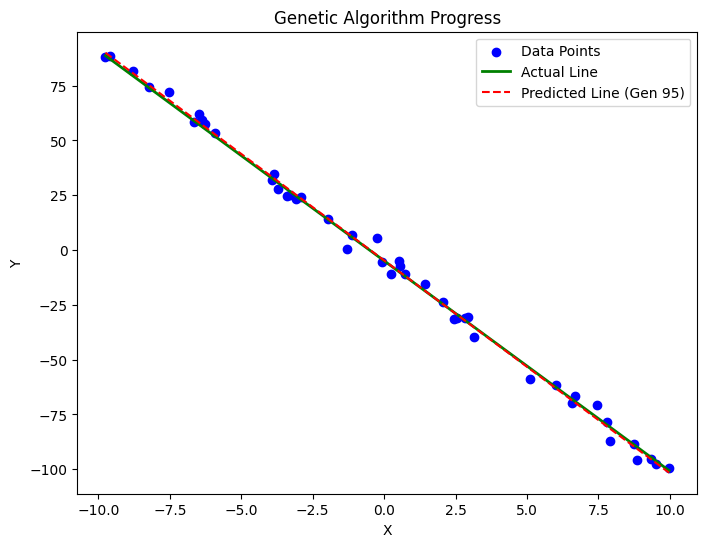

Generation  95 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


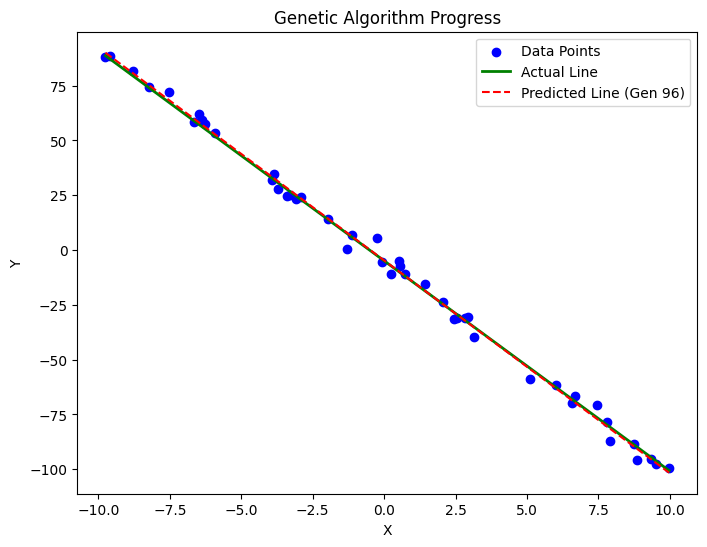

Generation  96 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


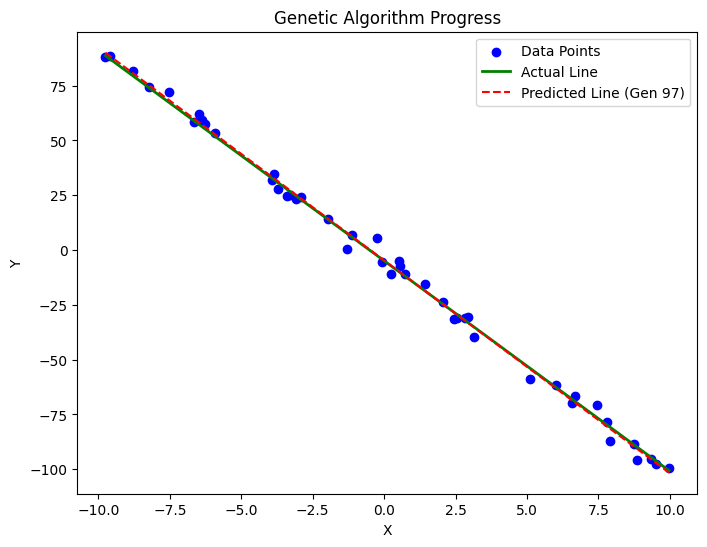

Generation  97 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


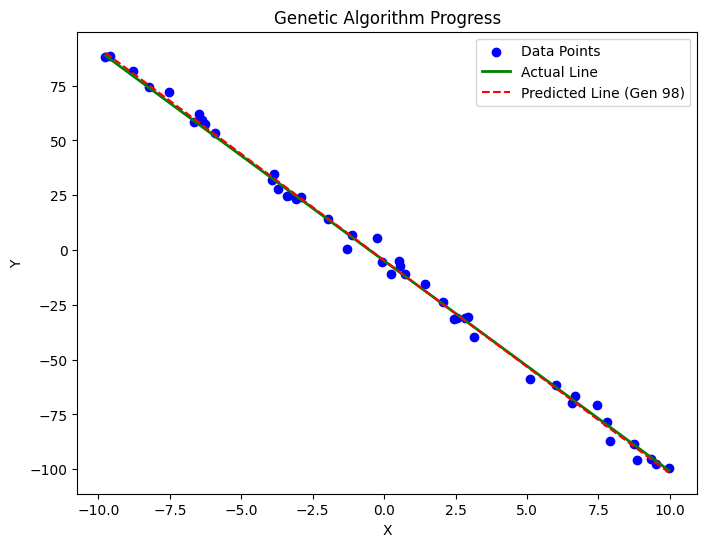

Generation  98 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


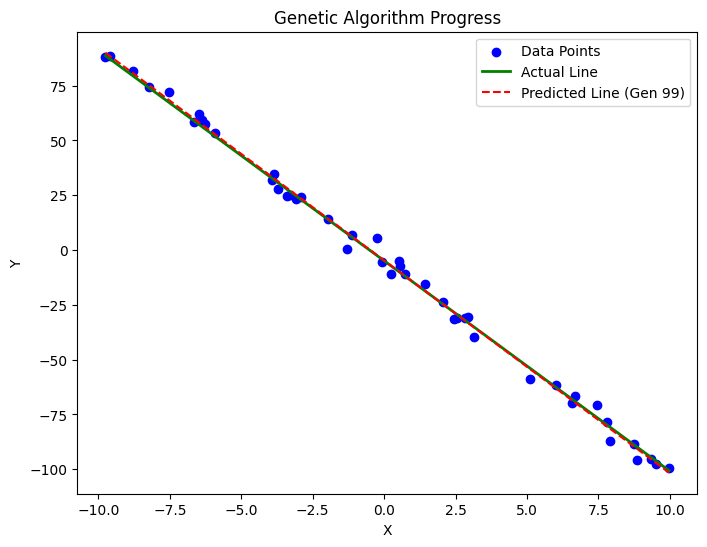

Generation  99 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


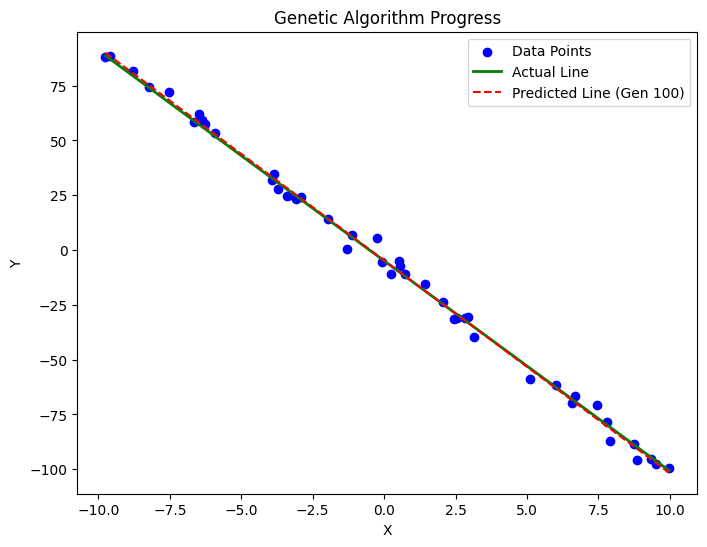

Generation 100 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


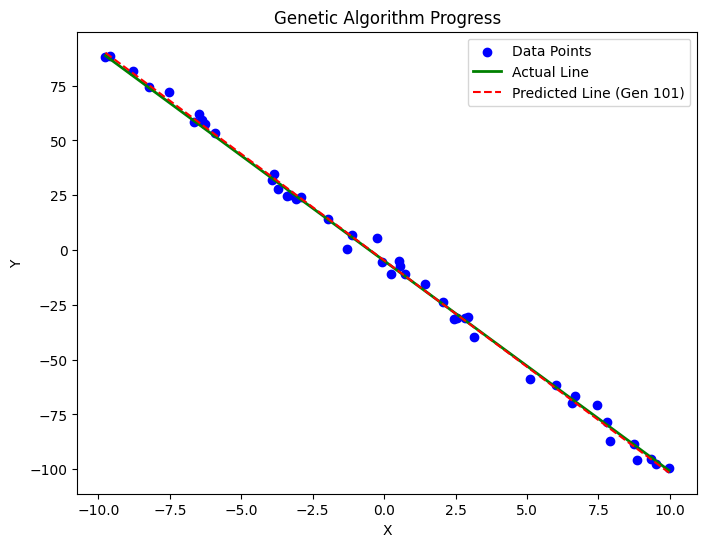

Generation 101 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


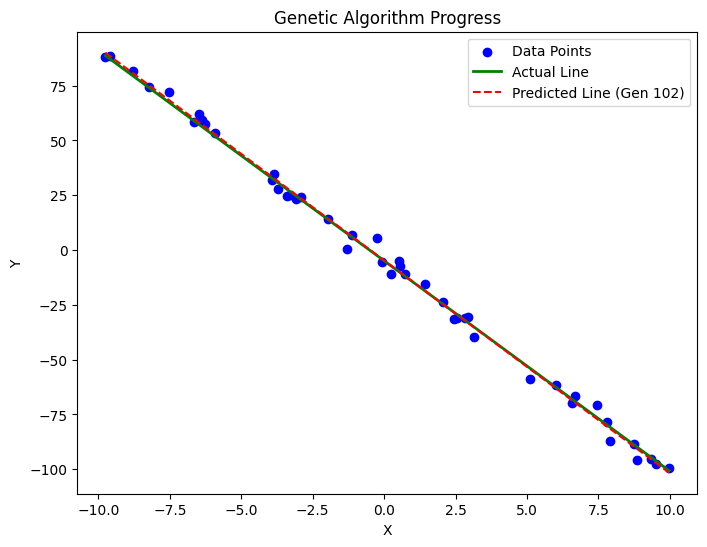

Generation 102 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


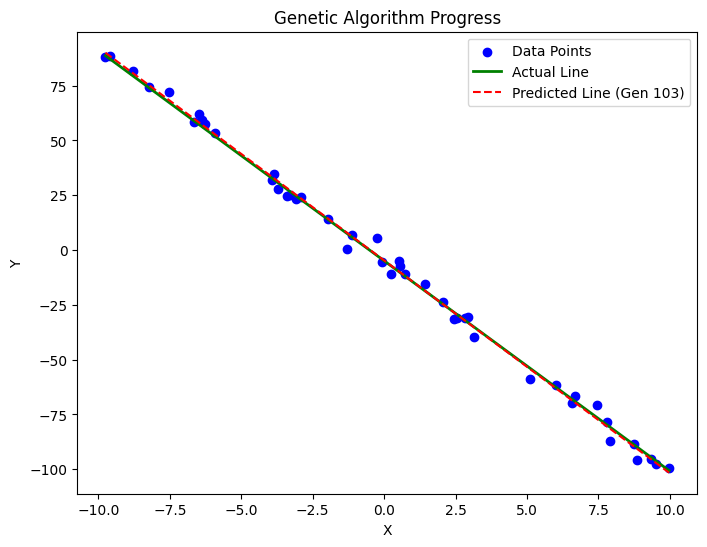

Generation 103 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


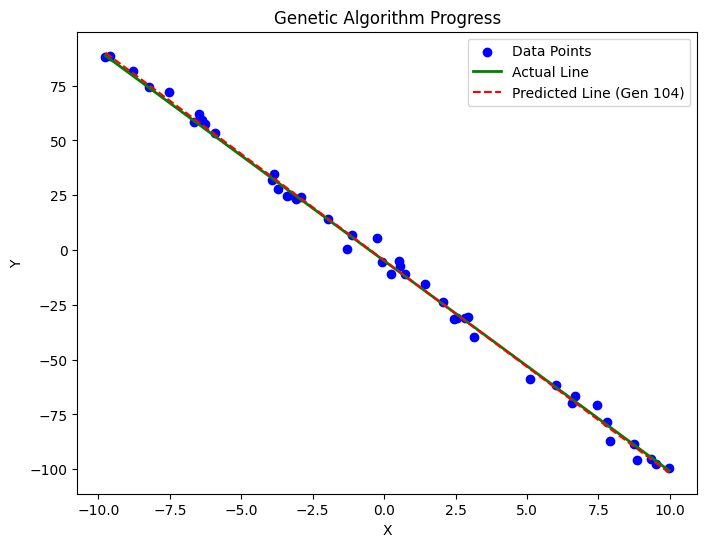

Generation 104 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


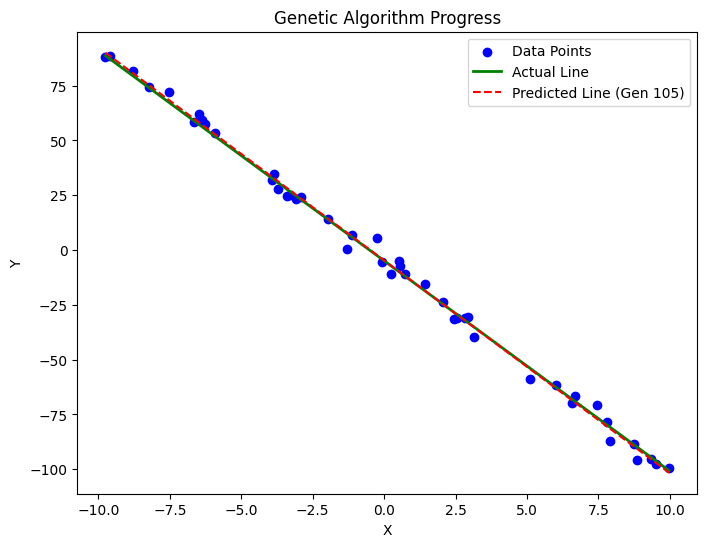

Generation 105 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


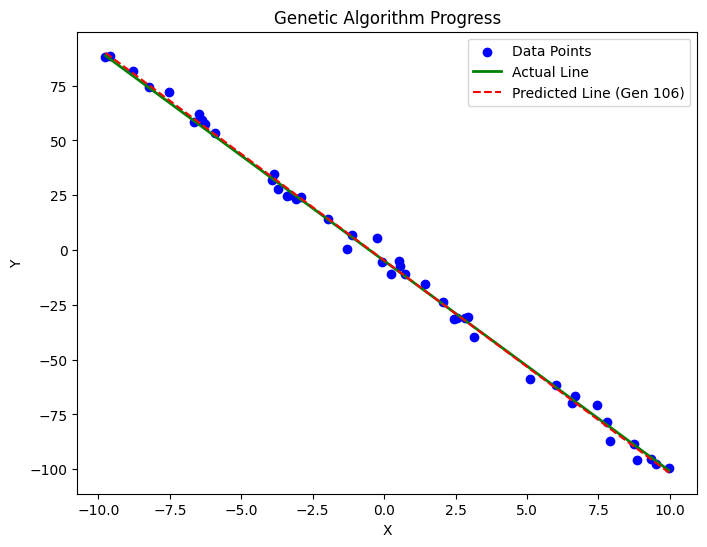

Generation 106 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


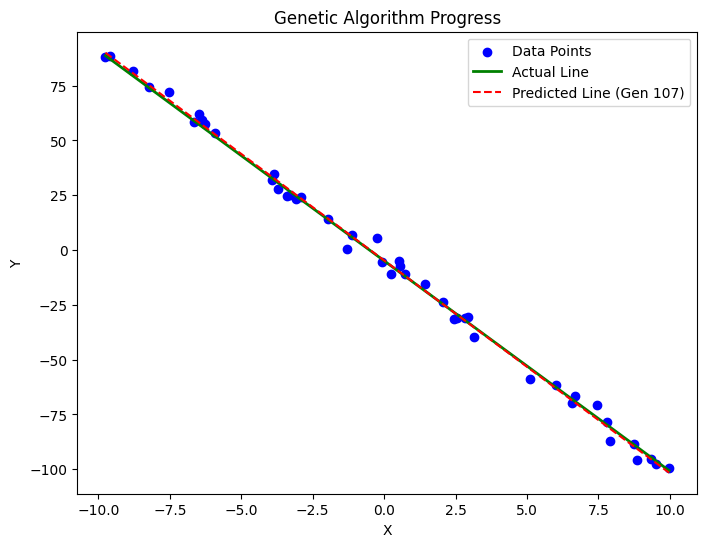

Generation 107 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


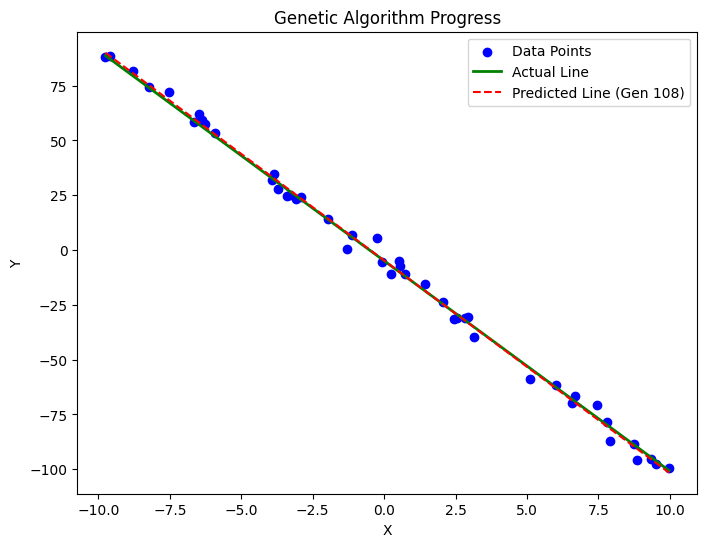

Generation 108 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


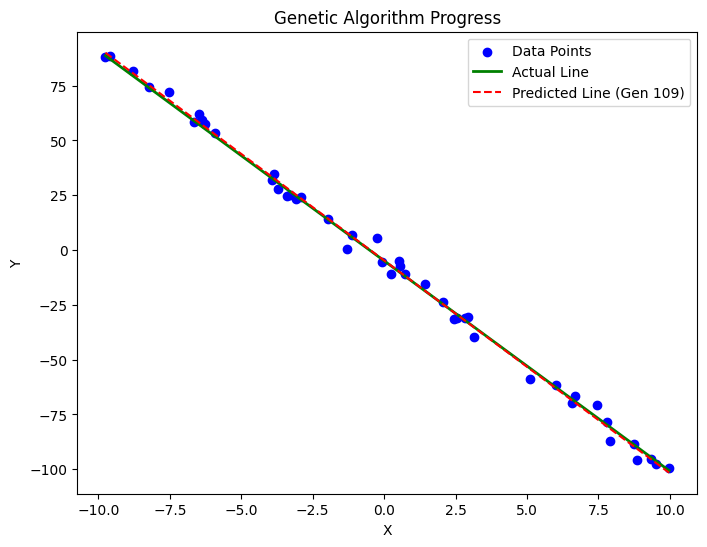

Generation 109 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


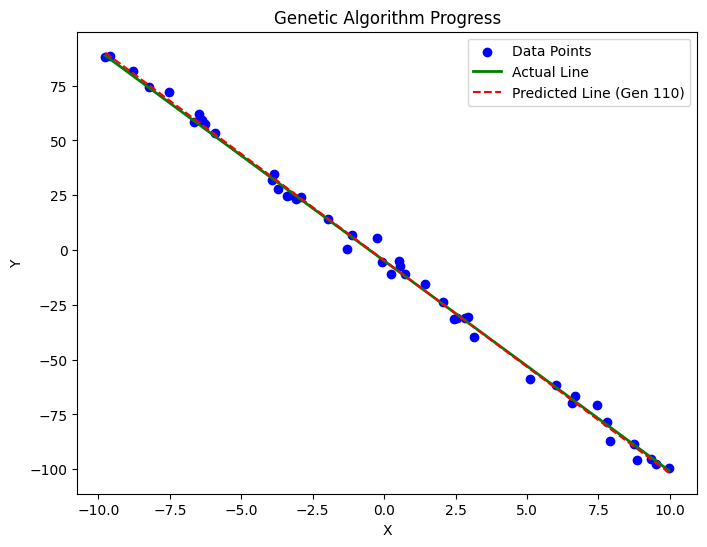

Generation 110 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


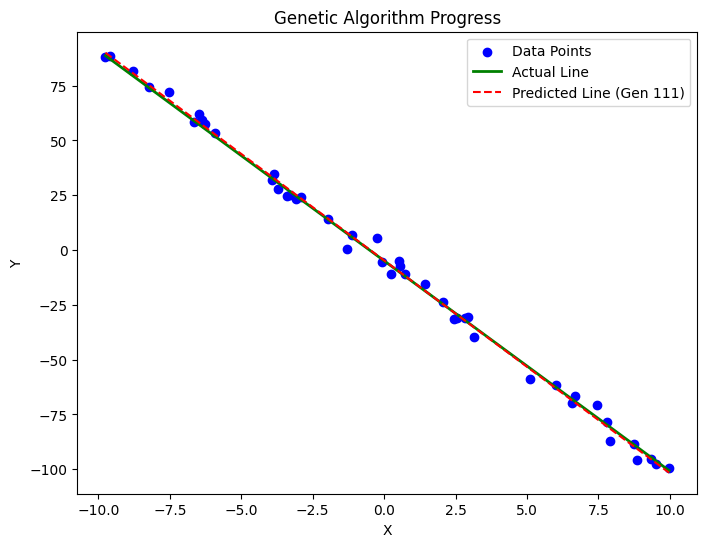

Generation 111 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


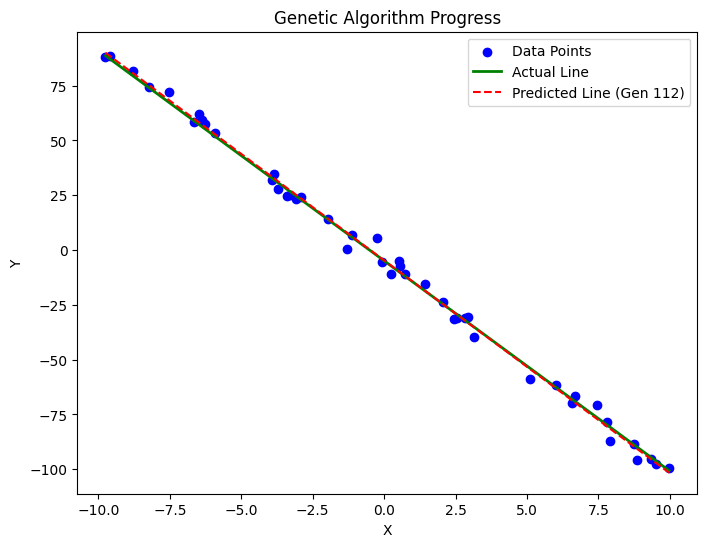

Generation 112 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


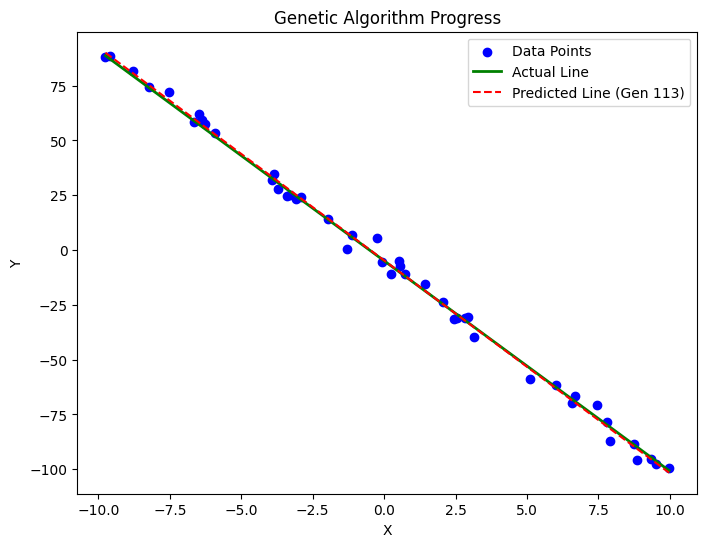

Generation 113 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


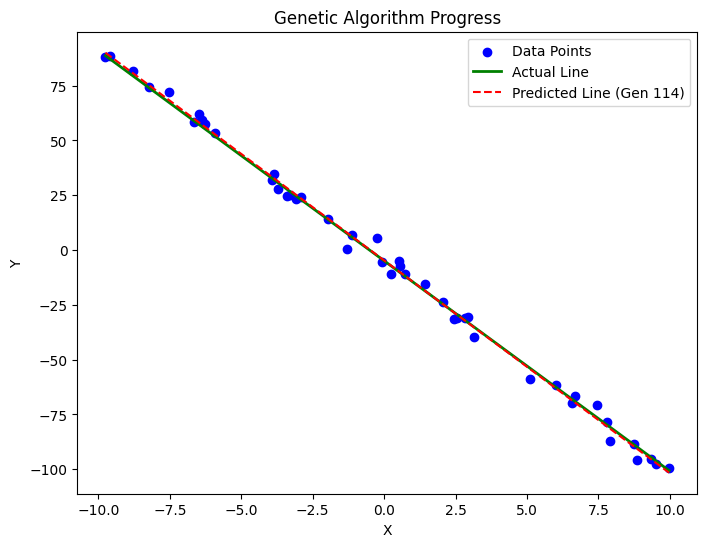

Generation 114 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


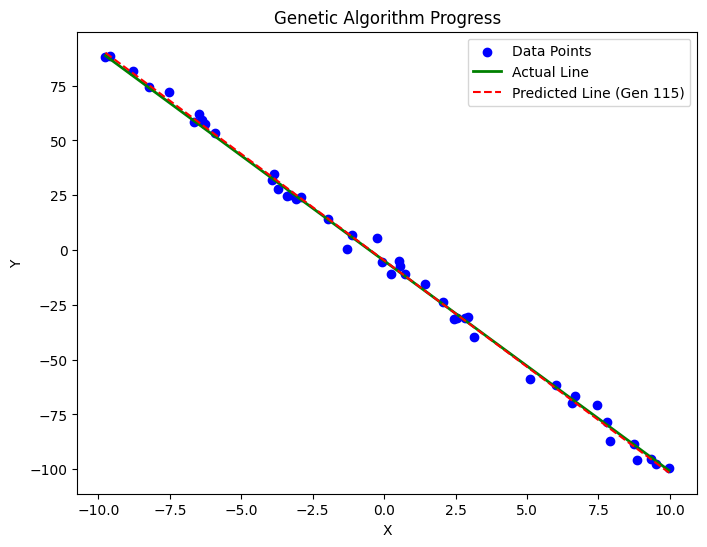

Generation 115 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


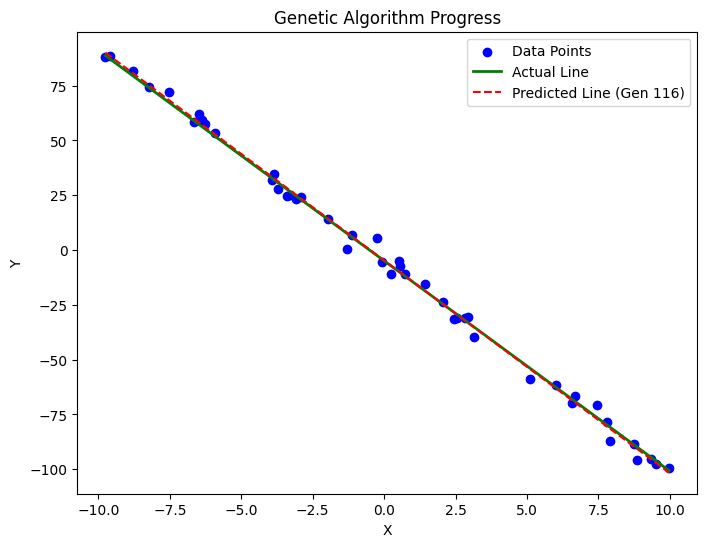

Generation 116 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


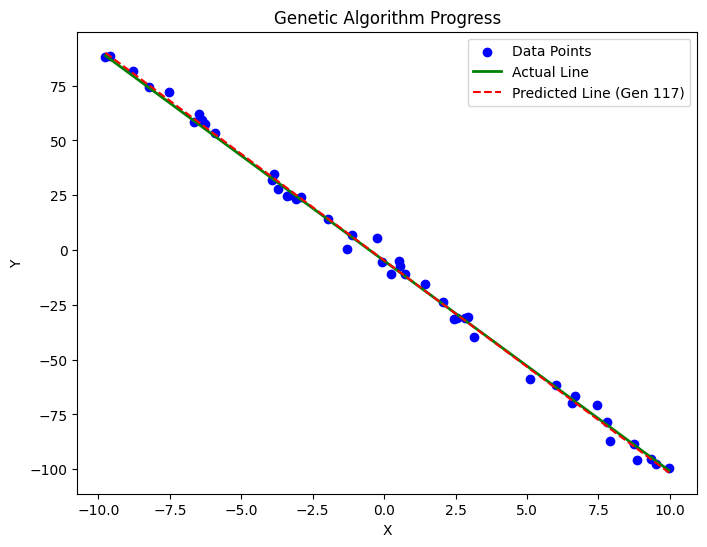

Generation 117 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


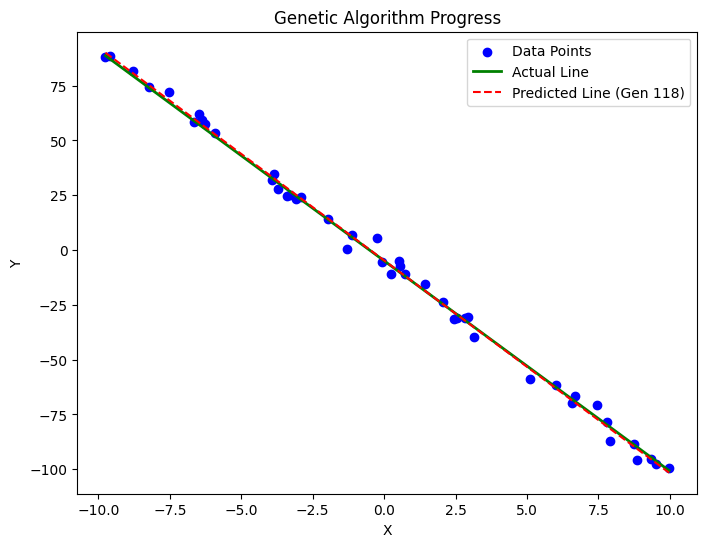

Generation 118 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


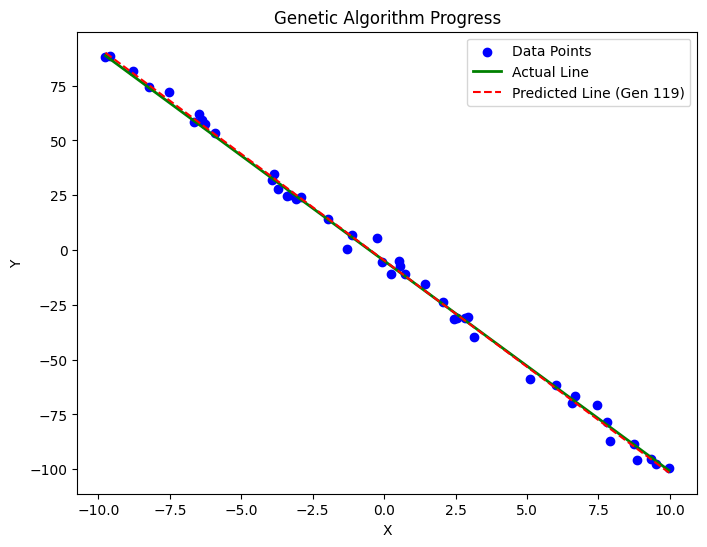

Generation 119 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


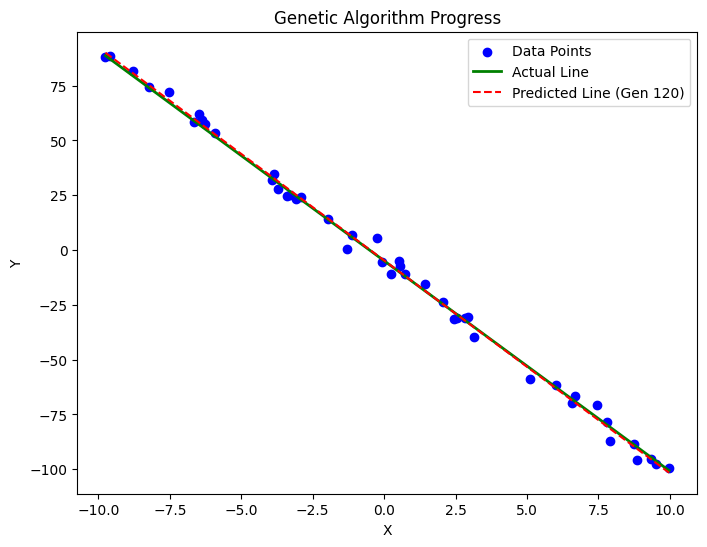

Generation 120 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


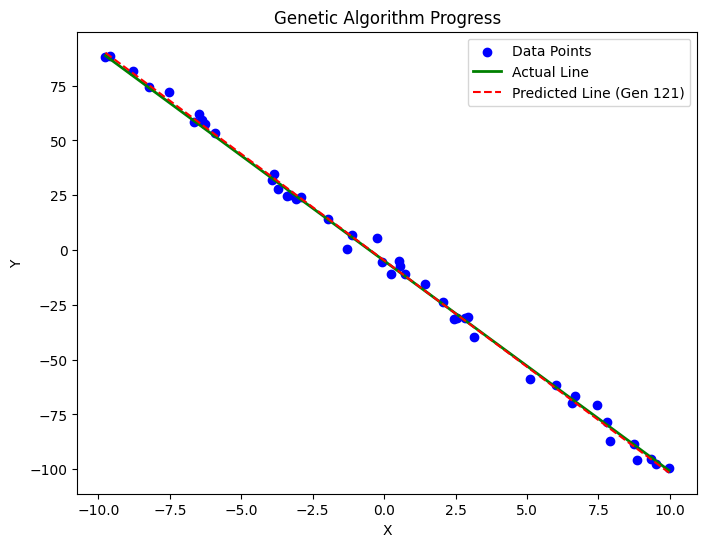

Generation 121 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


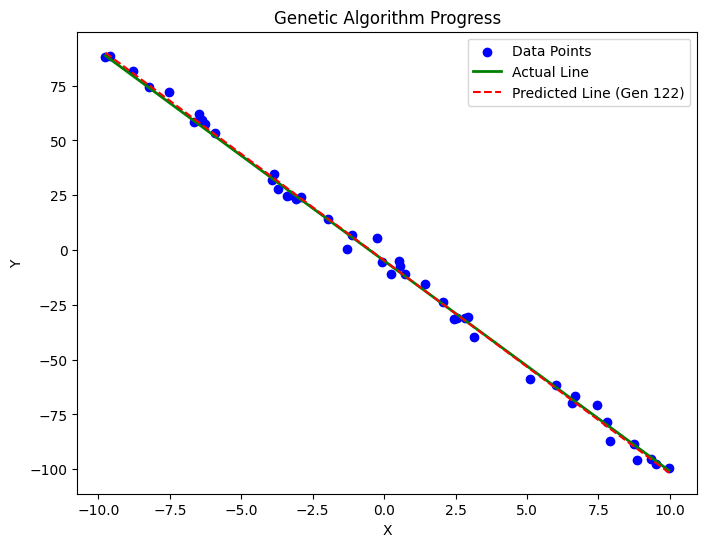

Generation 122 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


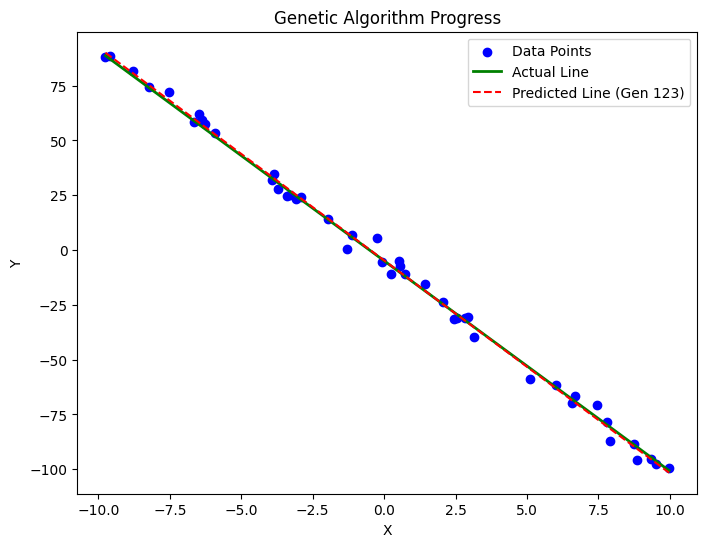

Generation 123 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


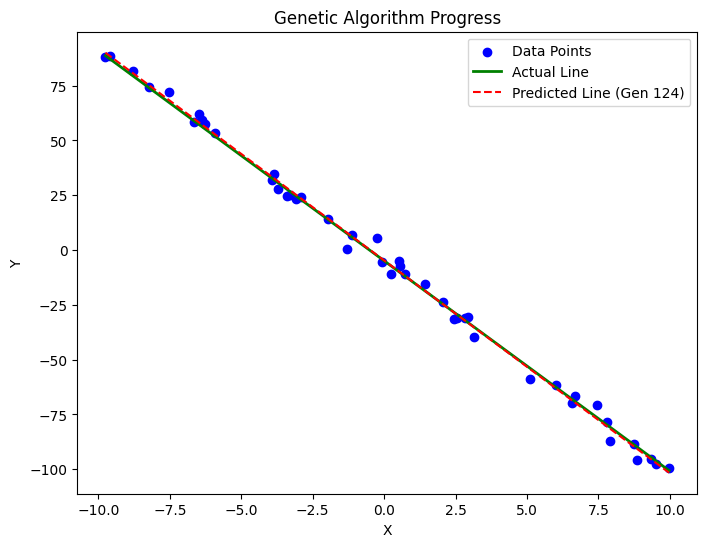

Generation 124 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


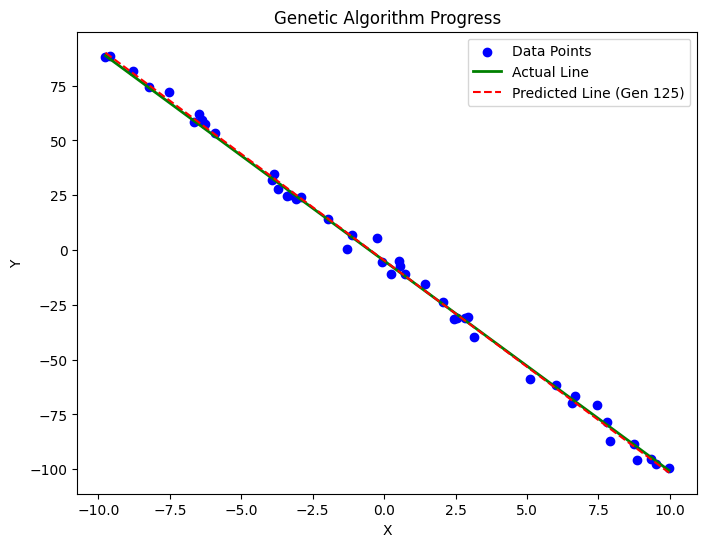

Generation 125 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


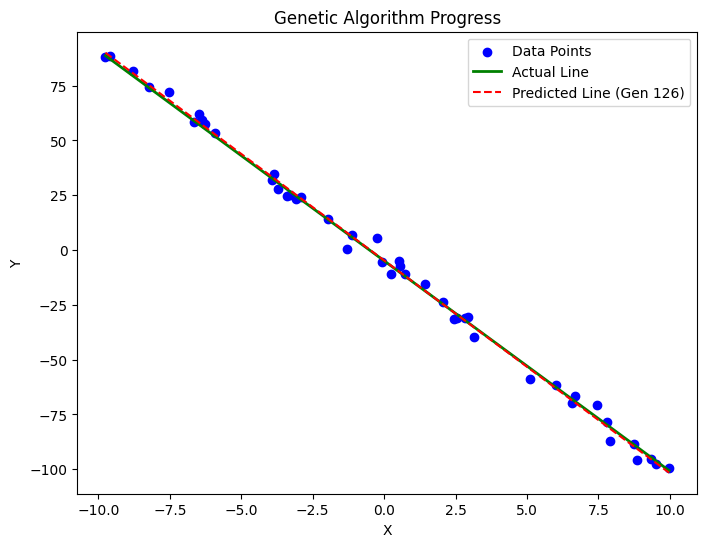

Generation 126 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


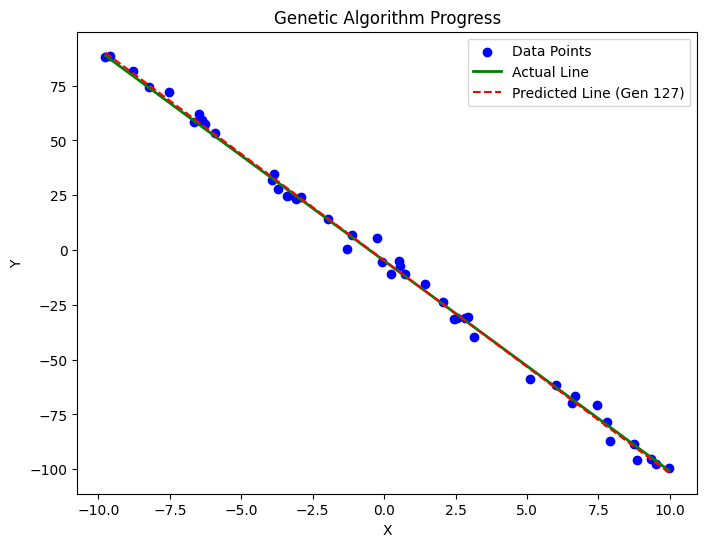

Generation 127 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


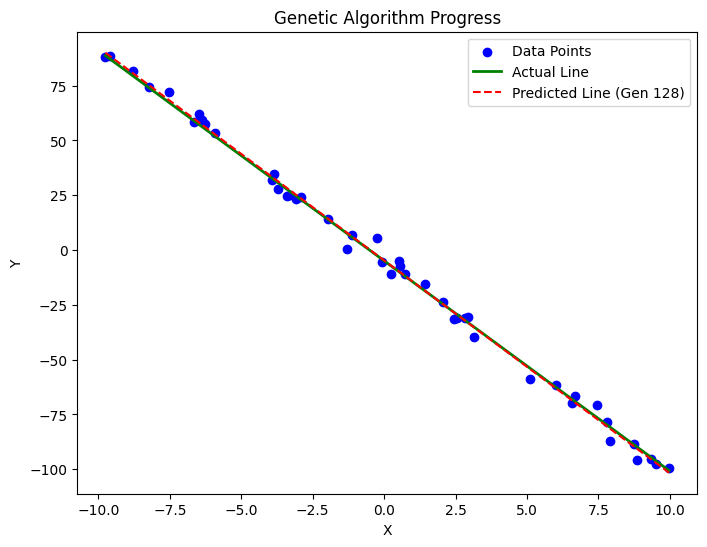

Generation 128 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


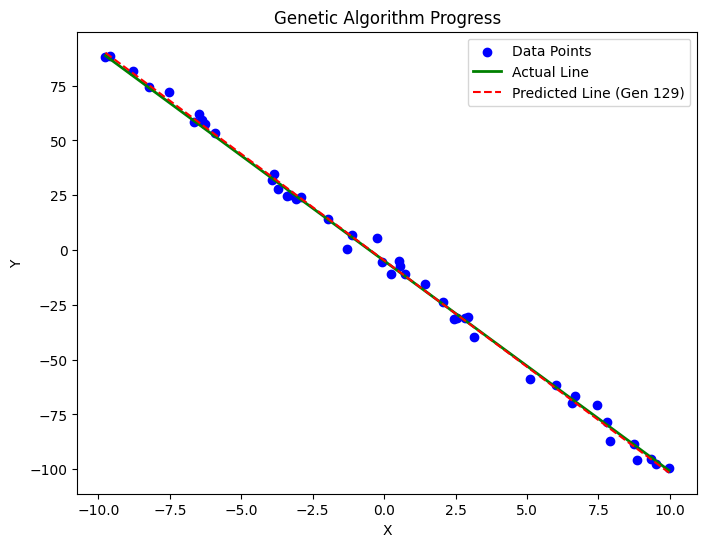

Generation 129 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


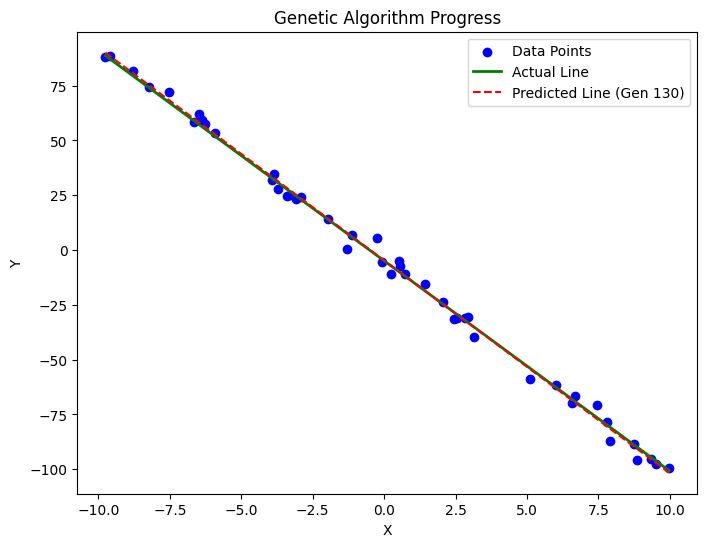

Generation 130 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


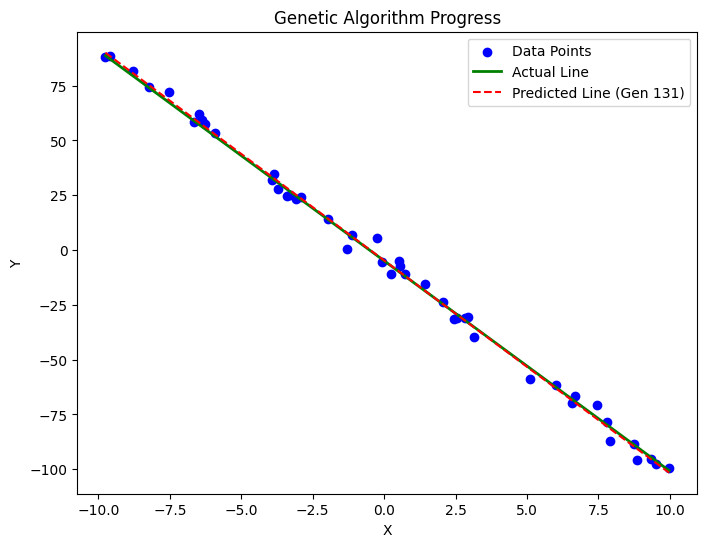

Generation 131 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


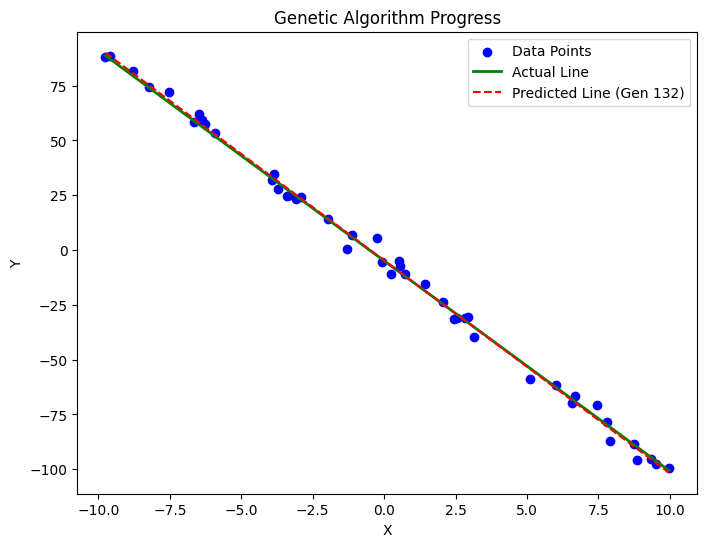

Generation 132 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


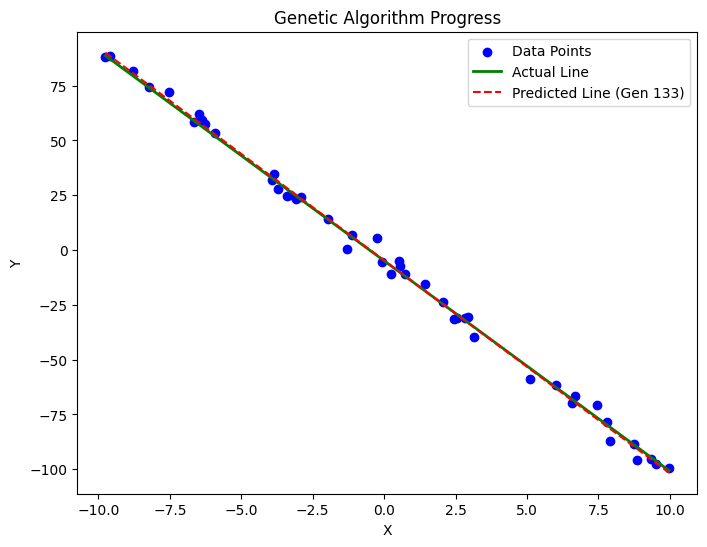

Generation 133 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


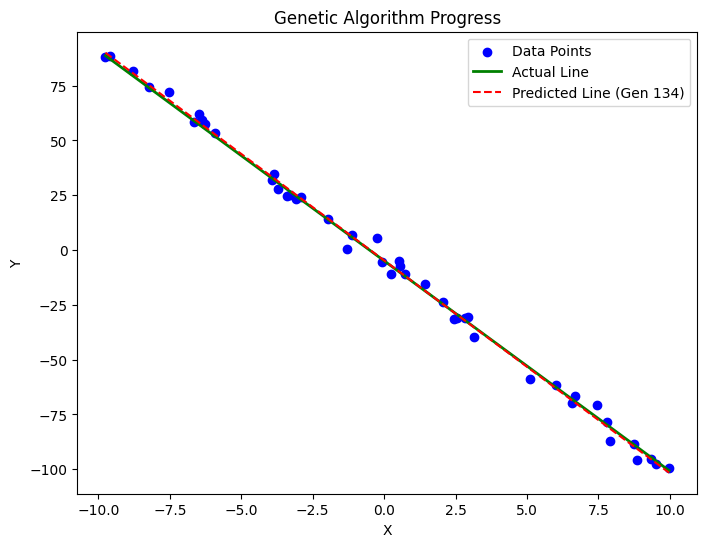

Generation 134 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


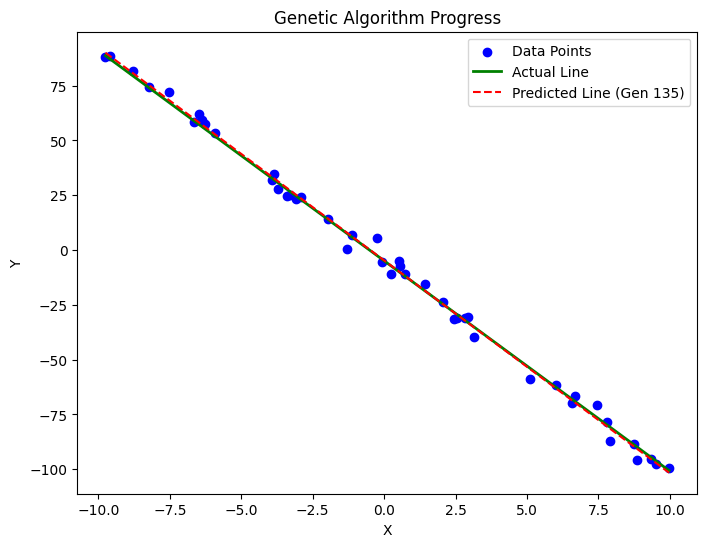

Generation 135 | Best Error: 440.522684 | Best Line: [-9.71405522 -4.7066441 ]


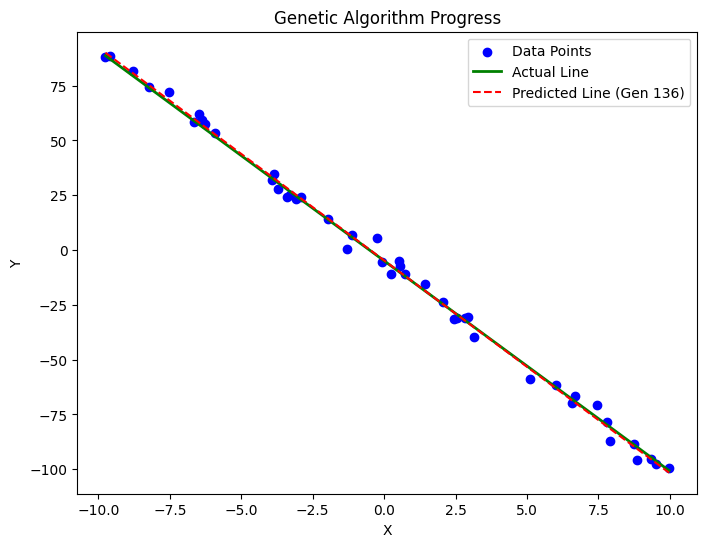

Generation 136 | Best Error: 440.522565 | Best Line: [np.float64(-9.714055217112895), np.float64(-4.704776396651361)]


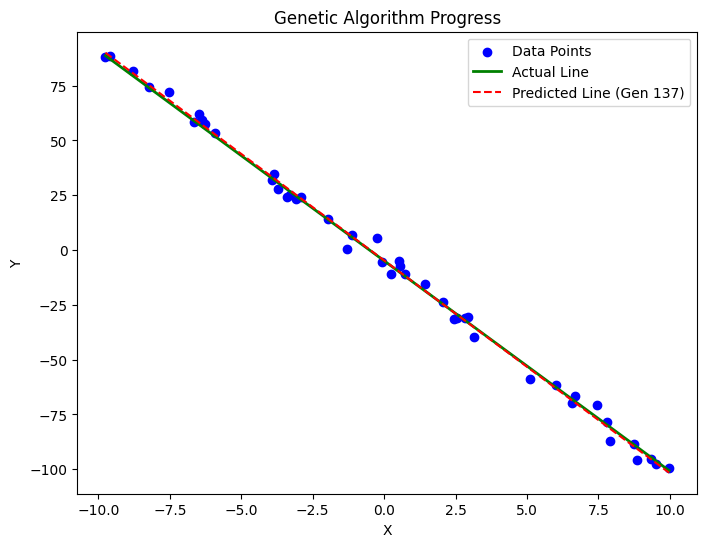

Generation 137 | Best Error: 440.522565 | Best Line: [-9.71405522 -4.7047764 ]


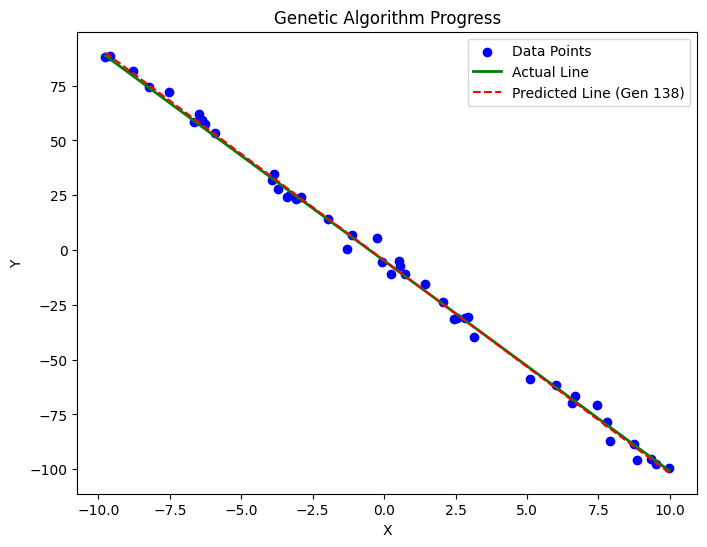

Generation 138 | Best Error: 440.522565 | Best Line: [-9.71405522 -4.7047764 ]


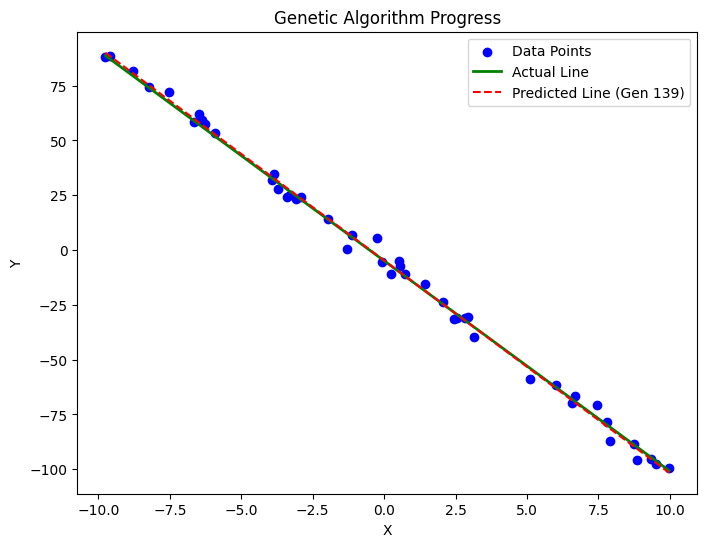

Generation 139 | Best Error: 440.522565 | Best Line: [-9.71405522 -4.7047764 ]


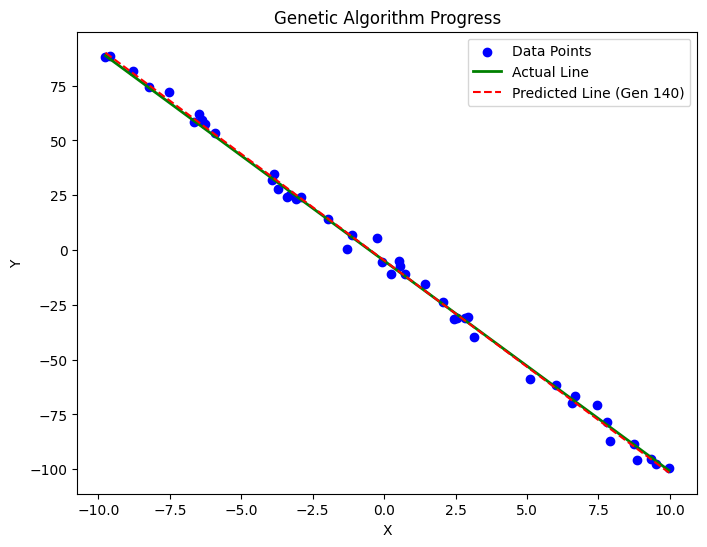

Generation 140 | Best Error: 440.522565 | Best Line: [-9.71405522 -4.7047764 ]


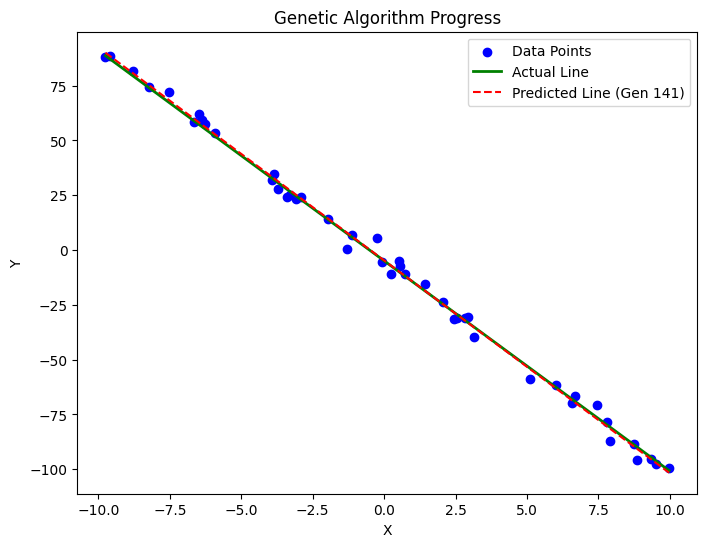

Generation 141 | Best Error: 440.522565 | Best Line: [-9.71405522 -4.7047764 ]


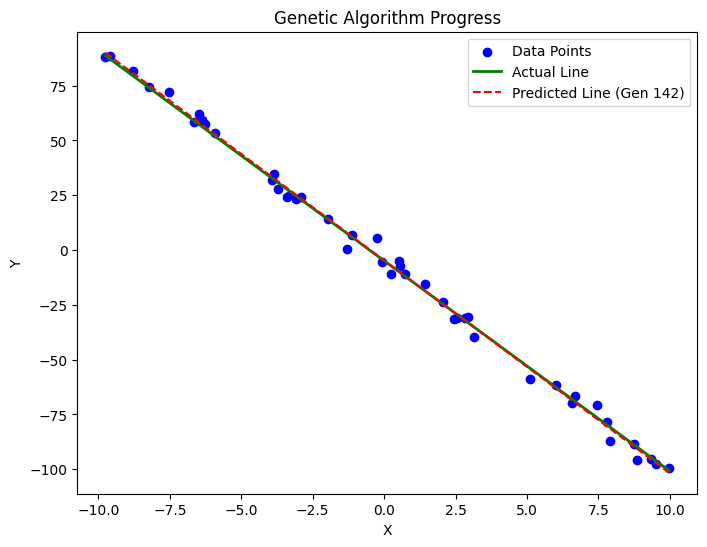

Generation 142 | Best Error: 440.522565 | Best Line: [-9.71405522 -4.7047764 ]


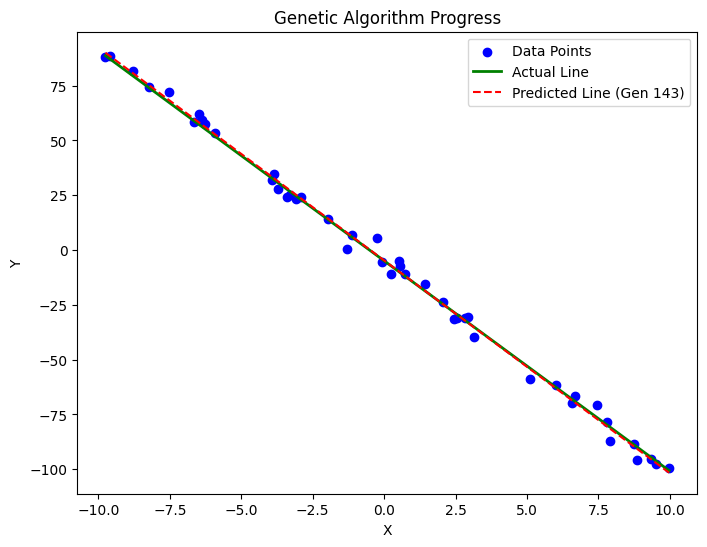

Generation 143 | Best Error: 440.522565 | Best Line: [-9.71405522 -4.7047764 ]


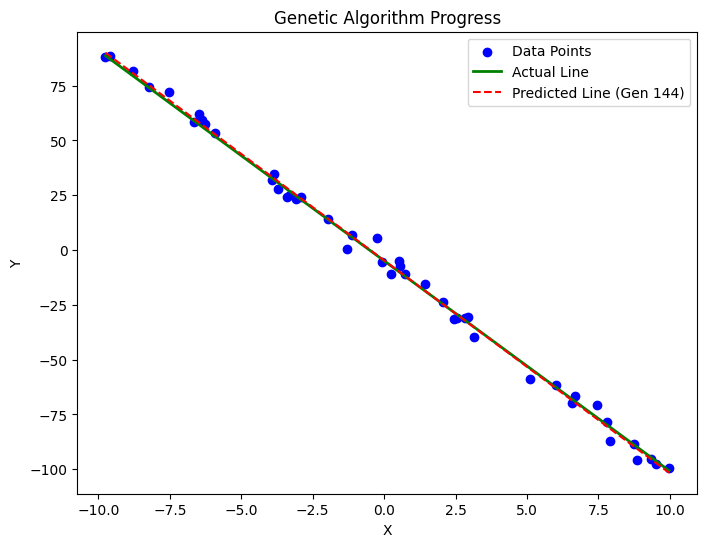

Generation 144 | Best Error: 440.522565 | Best Line: [-9.71405522 -4.7047764 ]


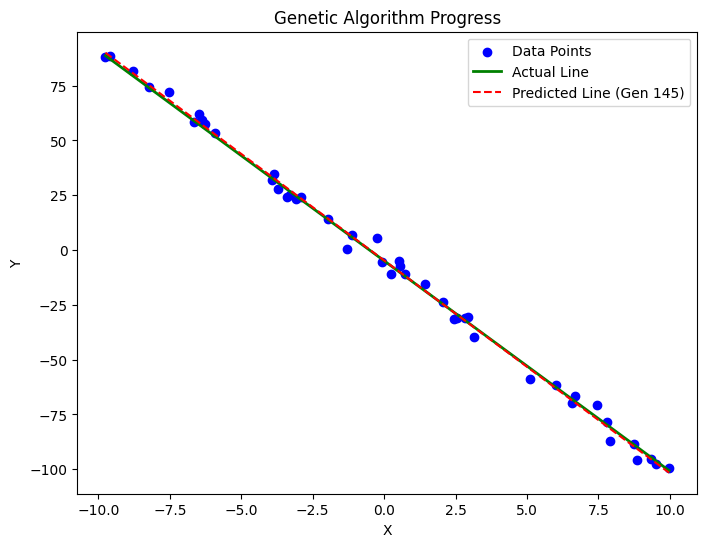

Generation 145 | Best Error: 440.522565 | Best Line: [-9.71405522 -4.7047764 ]


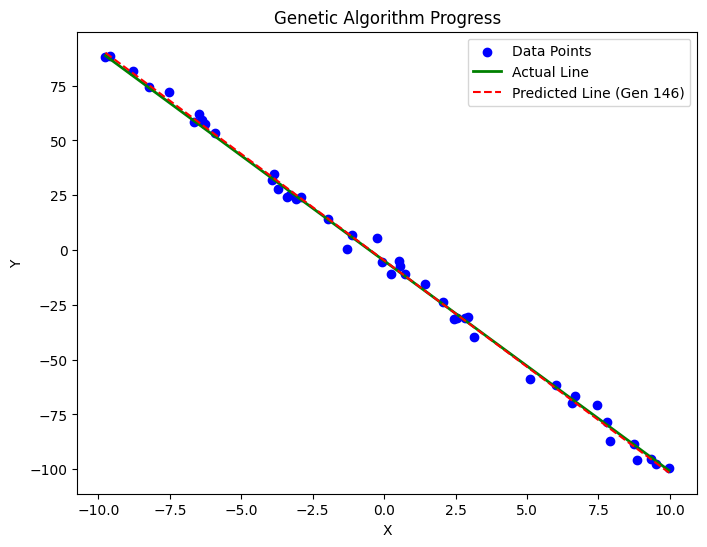

Generation 146 | Best Error: 440.522565 | Best Line: [-9.71405522 -4.7047764 ]


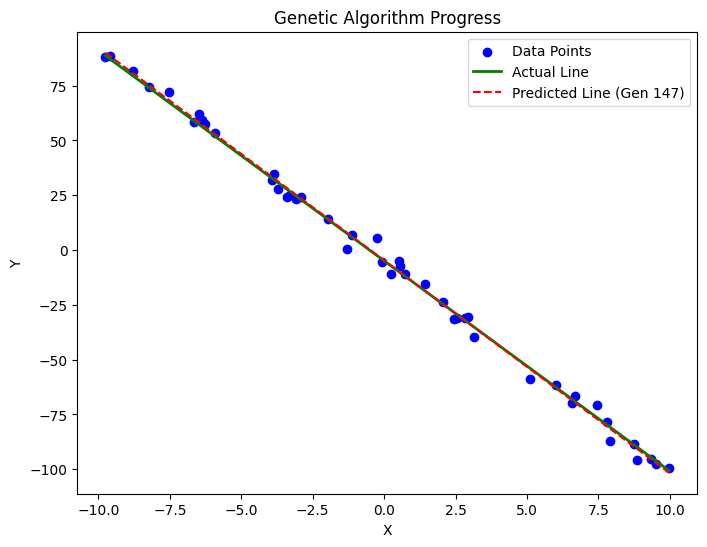

Generation 147 | Best Error: 440.522565 | Best Line: [-9.71405522 -4.7047764 ]


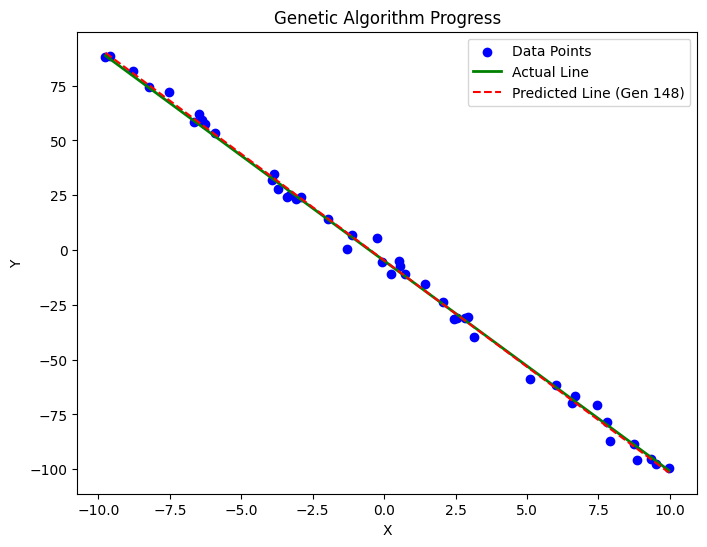

Generation 148 | Best Error: 440.522565 | Best Line: [-9.71405522 -4.7047764 ]


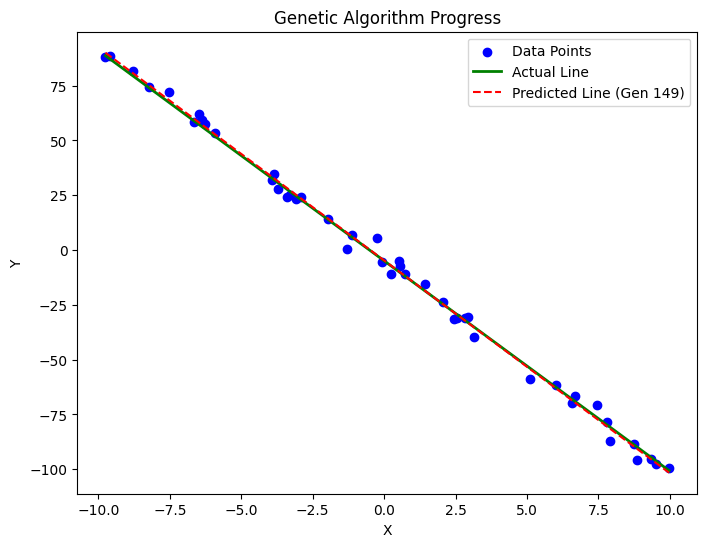

Generation 149 | Best Error: 440.522565 | Best Line: [-9.71405522 -4.7047764 ]


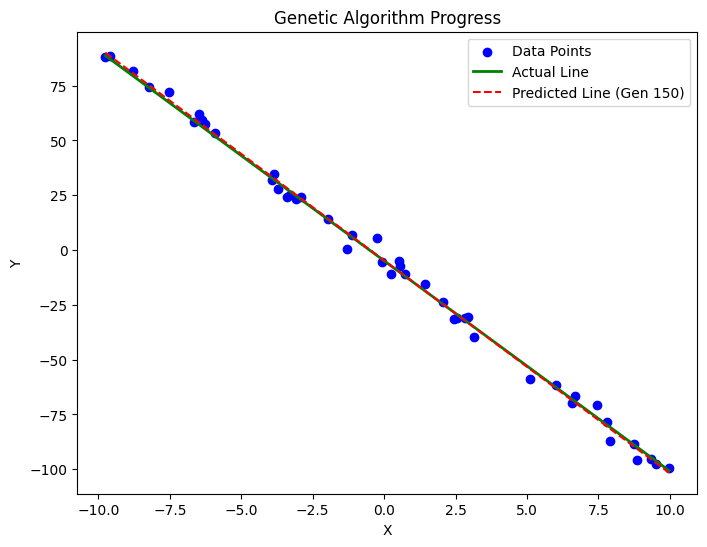

Generation 150 | Best Error: 440.522565 | Best Line: [-9.71405522 -4.7047764 ]


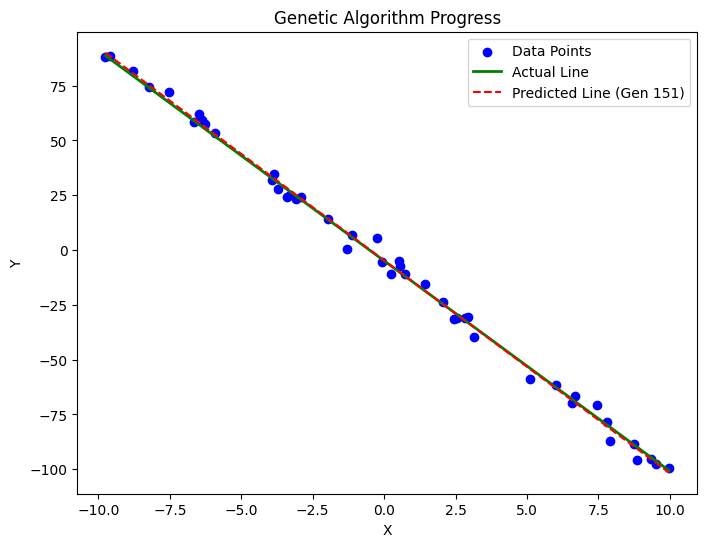

Generation 151 | Best Error: 440.522565 | Best Line: [-9.71405522 -4.7047764 ]


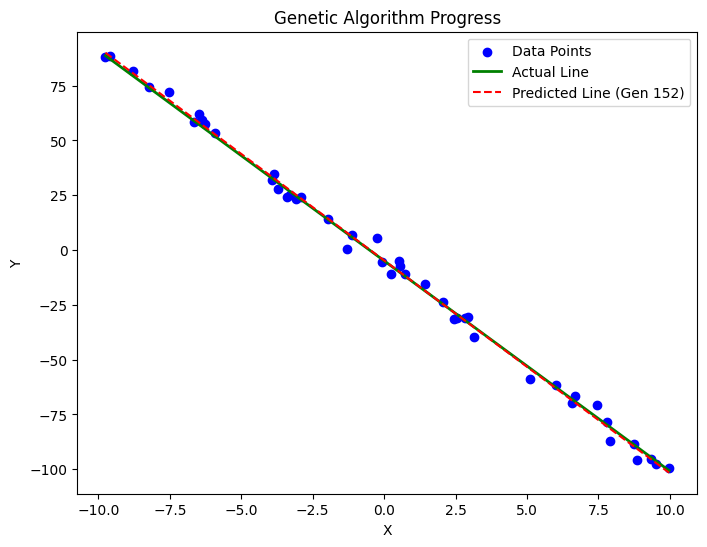

Generation 152 | Best Error: 440.522565 | Best Line: [-9.71405522 -4.7047764 ]


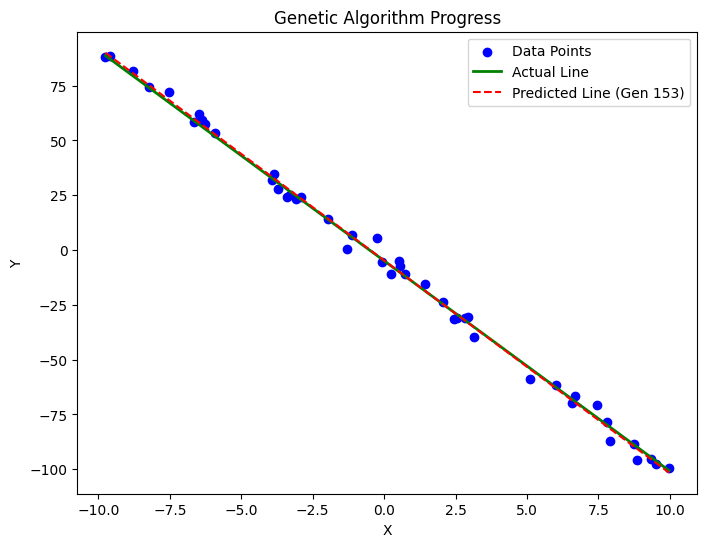

Generation 153 | Best Error: 440.522565 | Best Line: [-9.71405522 -4.7047764 ]


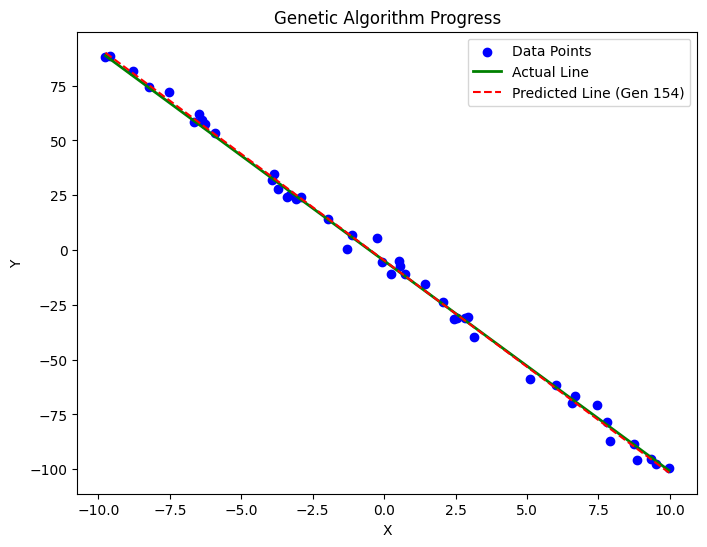

Generation 154 | Best Error: 440.522565 | Best Line: [-9.71405522 -4.7047764 ]


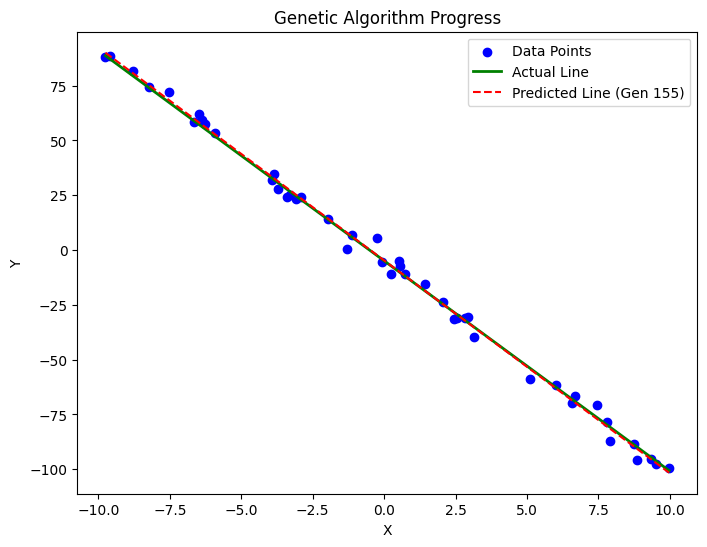

Generation 155 | Best Error: 440.522565 | Best Line: [-9.71405522 -4.7047764 ]


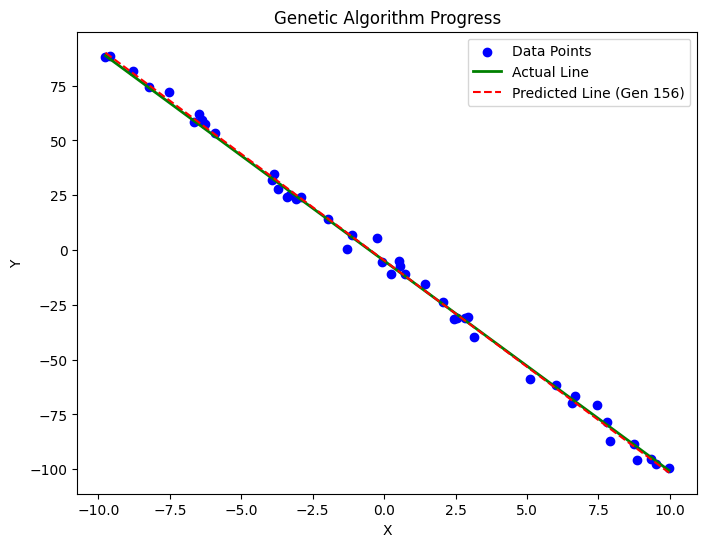

Generation 156 | Best Error: 440.522565 | Best Line: [-9.71405522 -4.7047764 ]


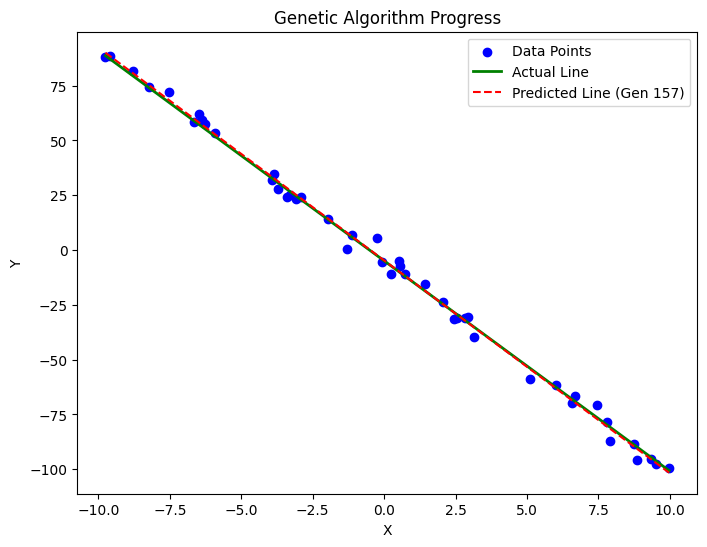

Generation 157 | Best Error: 440.522565 | Best Line: [-9.71405522 -4.7047764 ]


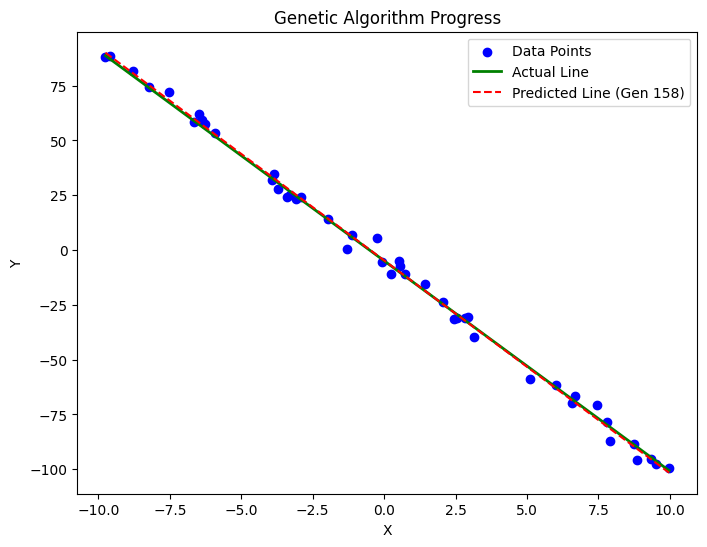

Generation 158 | Best Error: 440.522565 | Best Line: [-9.71405522 -4.7047764 ]


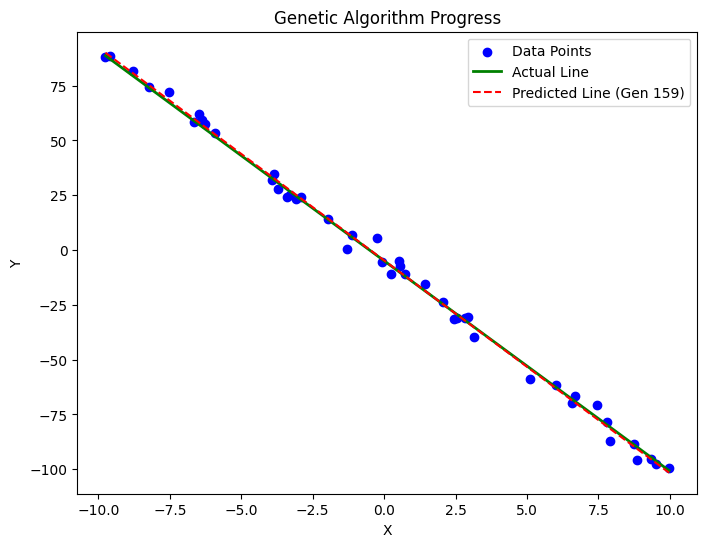

Generation 159 | Best Error: 440.522565 | Best Line: [-9.71405522 -4.7047764 ]


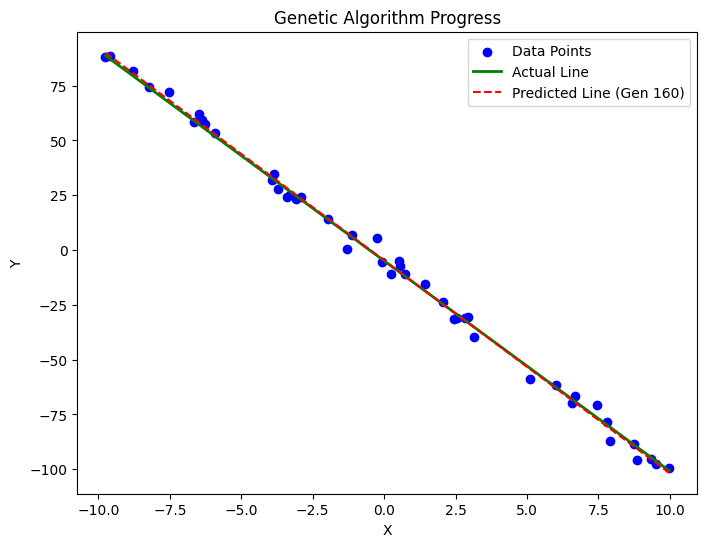

Generation 160 | Best Error: 440.522565 | Best Line: [-9.71405522 -4.7047764 ]


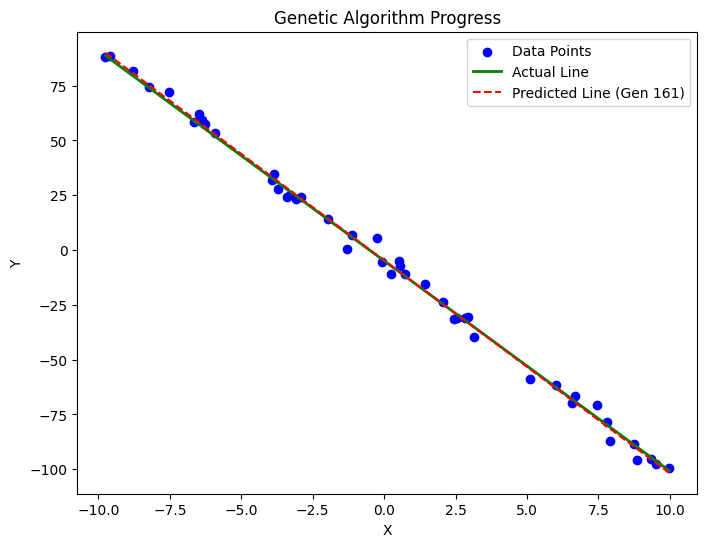

Generation 161 | Best Error: 440.522565 | Best Line: [-9.71405522 -4.7047764 ]


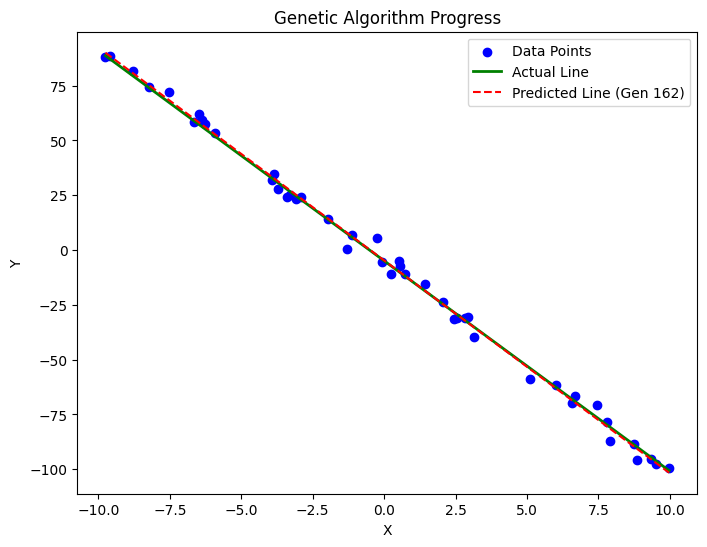

Generation 162 | Best Error: 440.522565 | Best Line: [-9.71405522 -4.7047764 ]


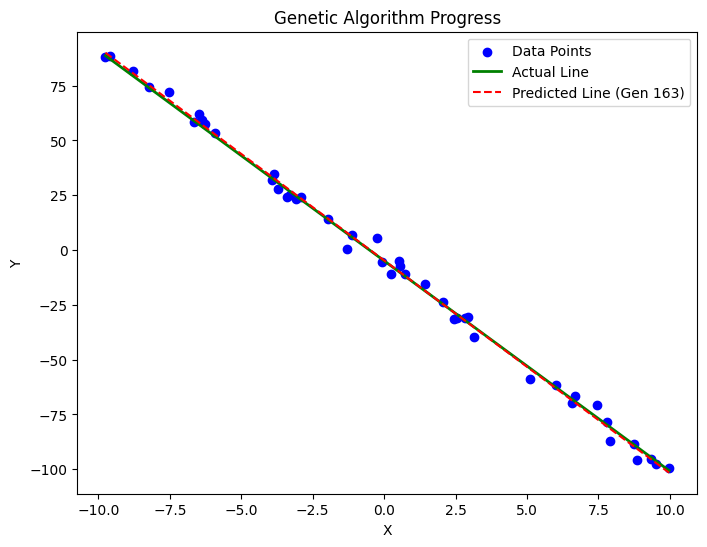

Generation 163 | Best Error: 440.522565 | Best Line: [-9.71405522 -4.7047764 ]


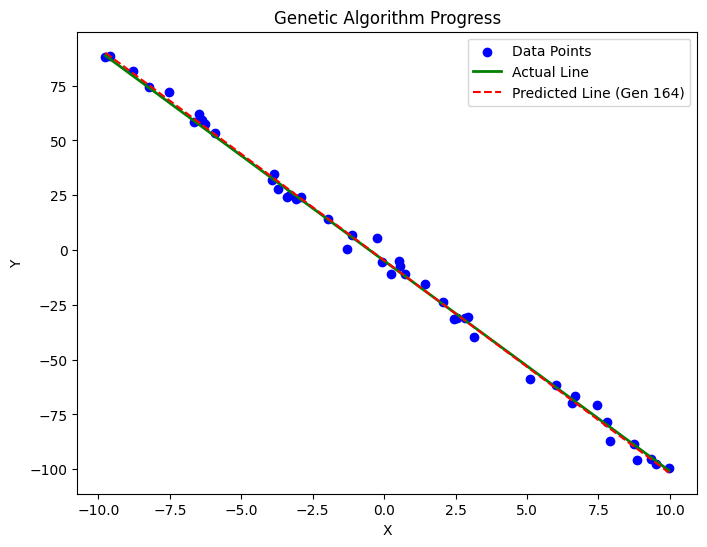

Generation 164 | Best Error: 440.522565 | Best Line: [-9.71405522 -4.7047764 ]


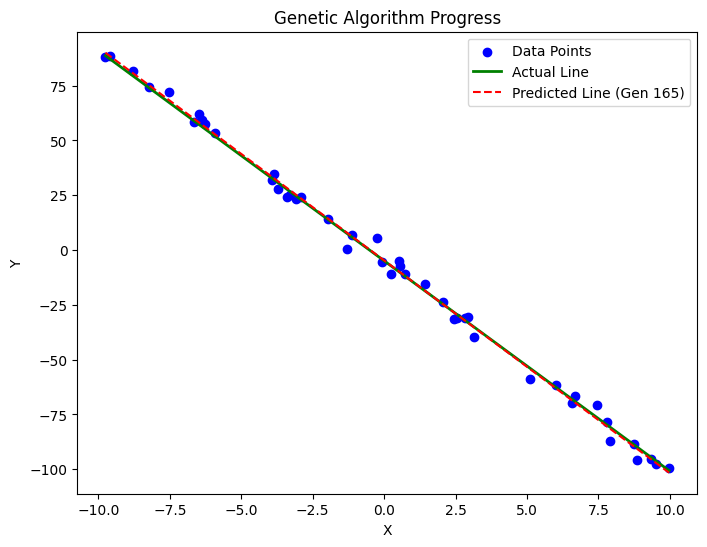

Generation 165 | Best Error: 440.522565 | Best Line: [-9.71405522 -4.7047764 ]


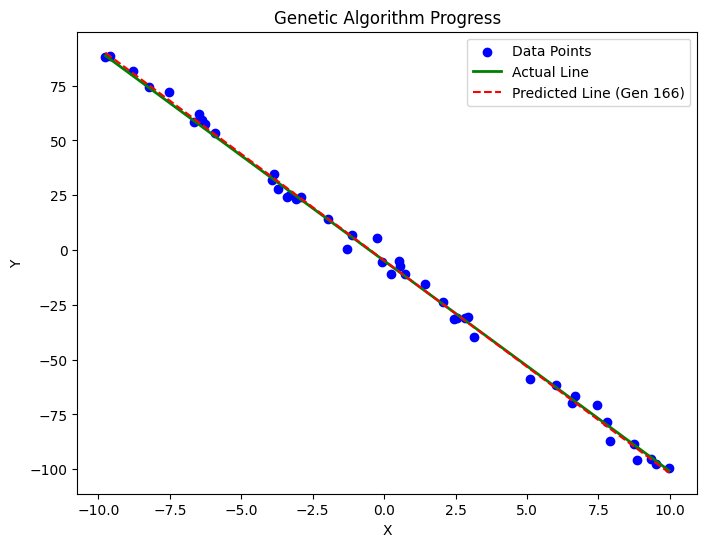

Generation 166 | Best Error: 440.522565 | Best Line: [-9.71405522 -4.7047764 ]


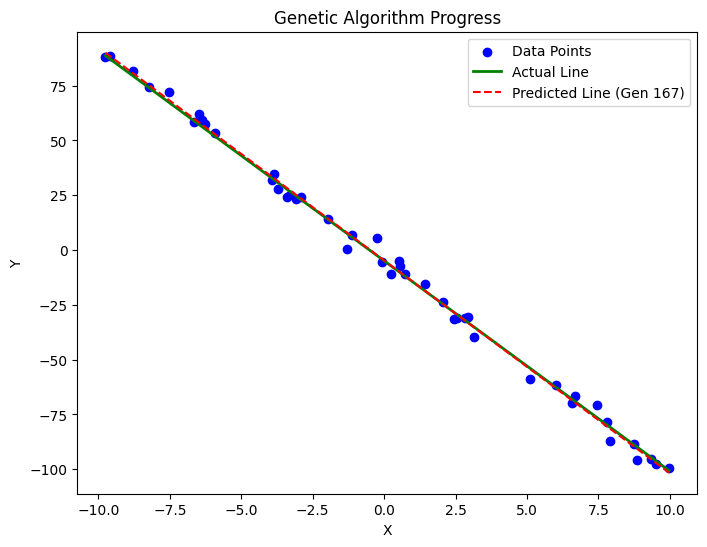

Generation 167 | Best Error: 440.522565 | Best Line: [-9.71405522 -4.7047764 ]


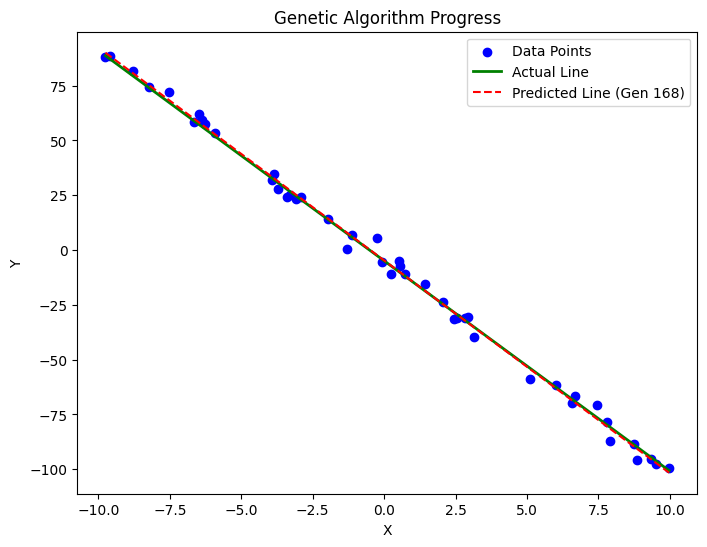

Generation 168 | Best Error: 440.522565 | Best Line: [-9.71405522 -4.7047764 ]


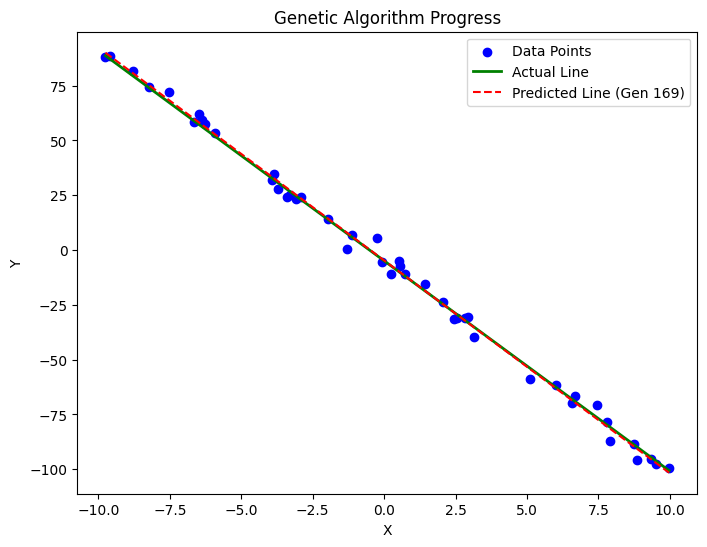

Generation 169 | Best Error: 440.522565 | Best Line: [-9.71405522 -4.7047764 ]


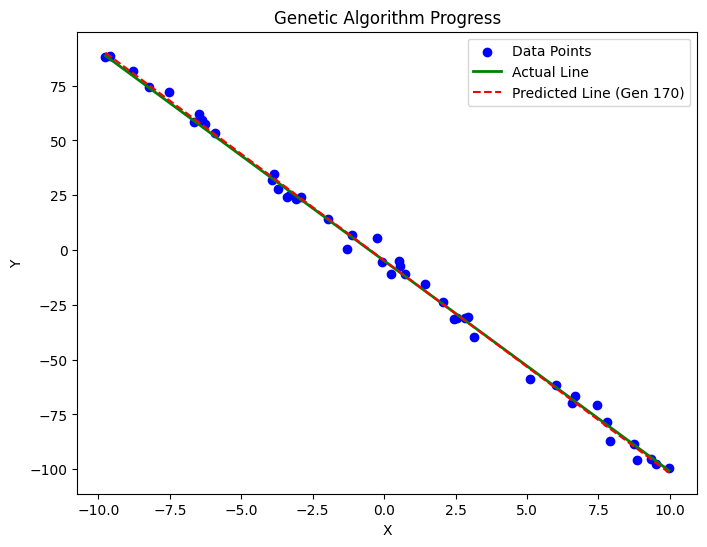

Generation 170 | Best Error: 440.522565 | Best Line: [-9.71405522 -4.7047764 ]


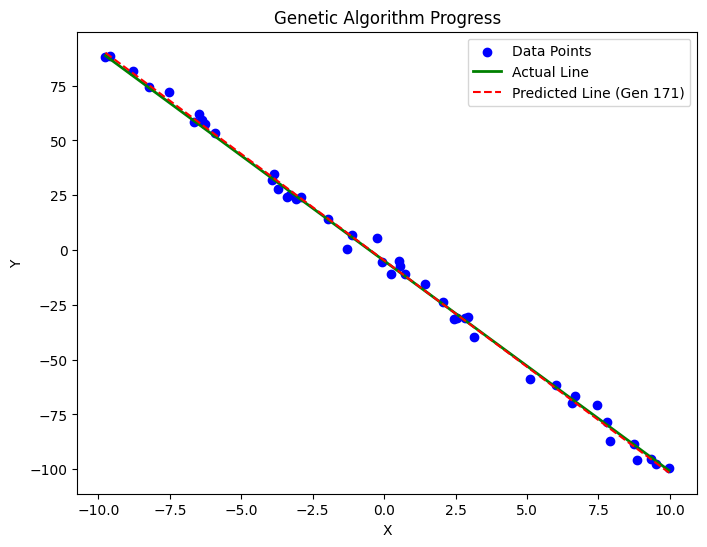

Generation 171 | Best Error: 440.522565 | Best Line: [-9.71405522 -4.7047764 ]


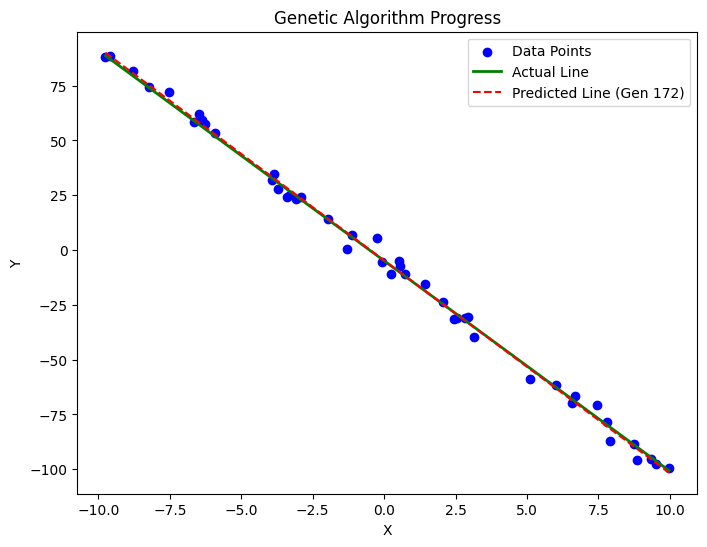

Generation 172 | Best Error: 440.522565 | Best Line: [-9.71405522 -4.7047764 ]


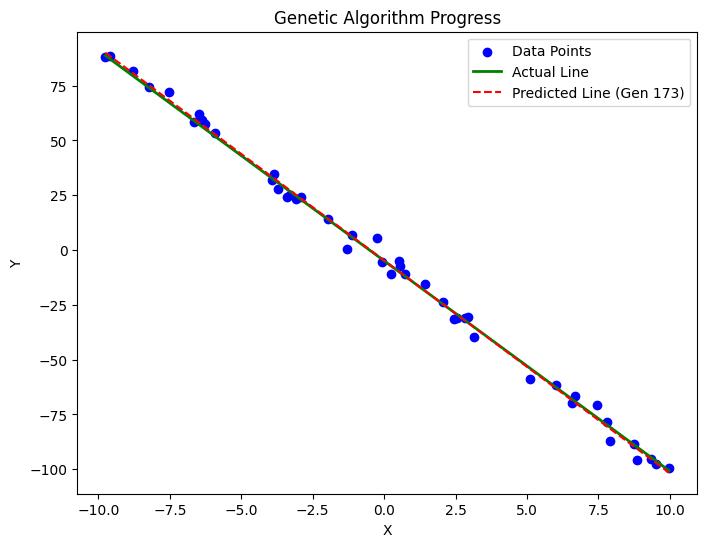

Generation 173 | Best Error: 440.522565 | Best Line: [-9.71405522 -4.7047764 ]


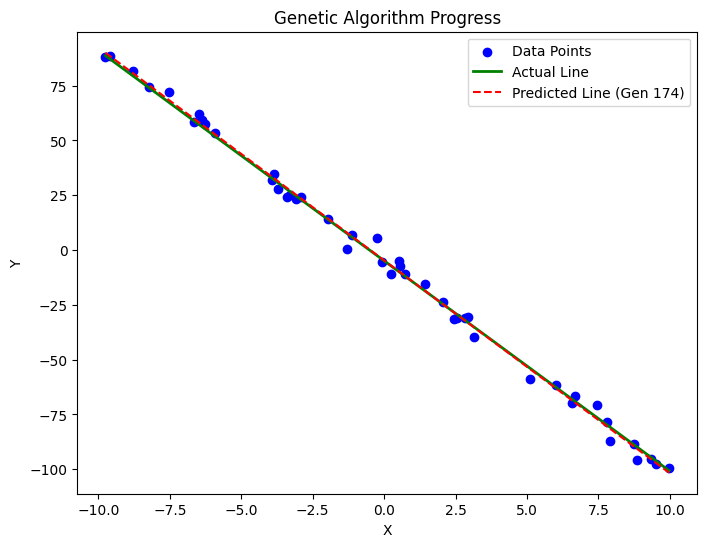

Generation 174 | Best Error: 440.522565 | Best Line: [-9.71405522 -4.7047764 ]


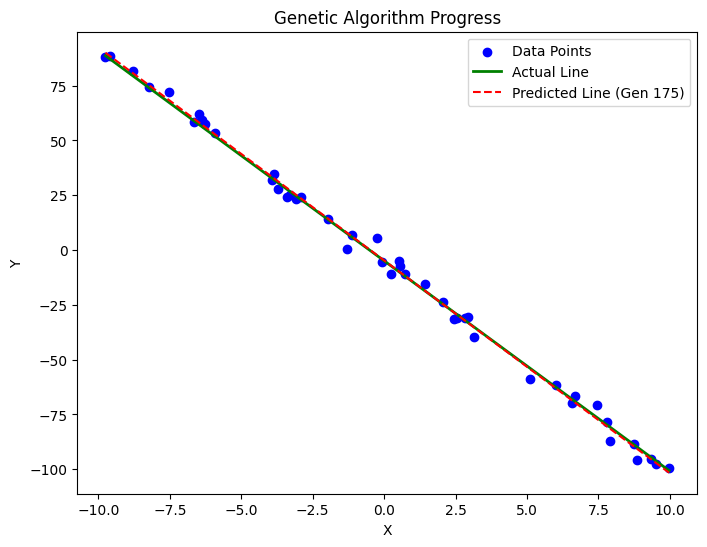

Generation 175 | Best Error: 440.522565 | Best Line: [-9.71405522 -4.7047764 ]


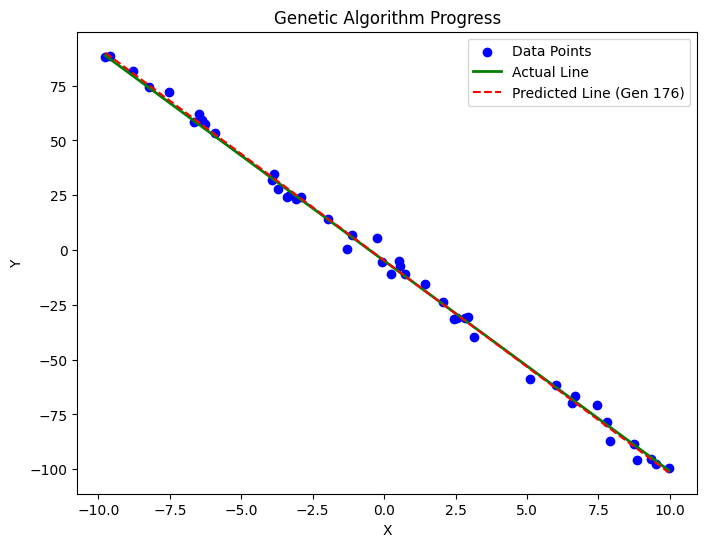

Generation 176 | Best Error: 440.522565 | Best Line: [-9.71405522 -4.7047764 ]


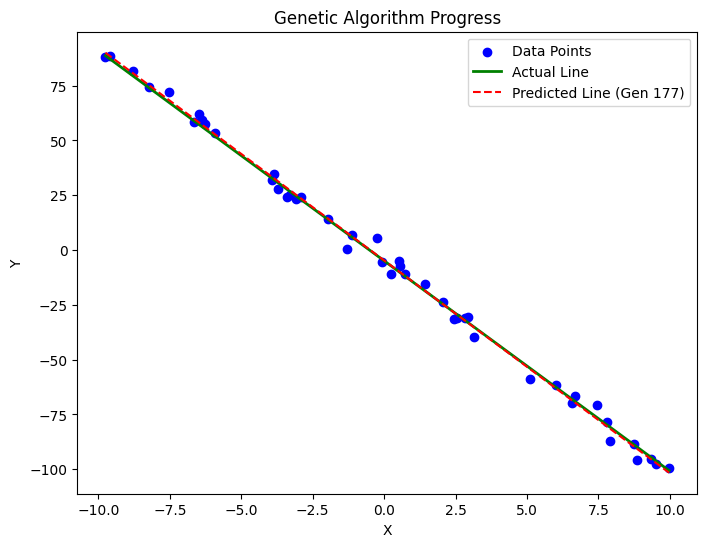

Generation 177 | Best Error: 440.522565 | Best Line: [-9.71405522 -4.7047764 ]


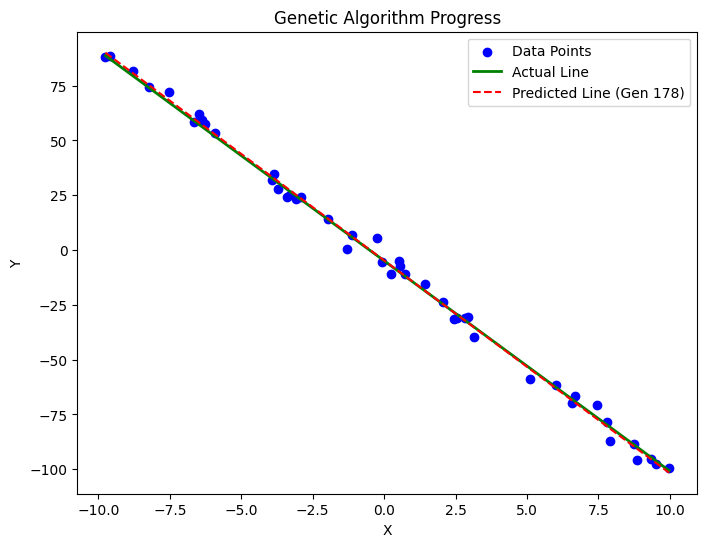

Generation 178 | Best Error: 440.522565 | Best Line: [-9.71405522 -4.7047764 ]


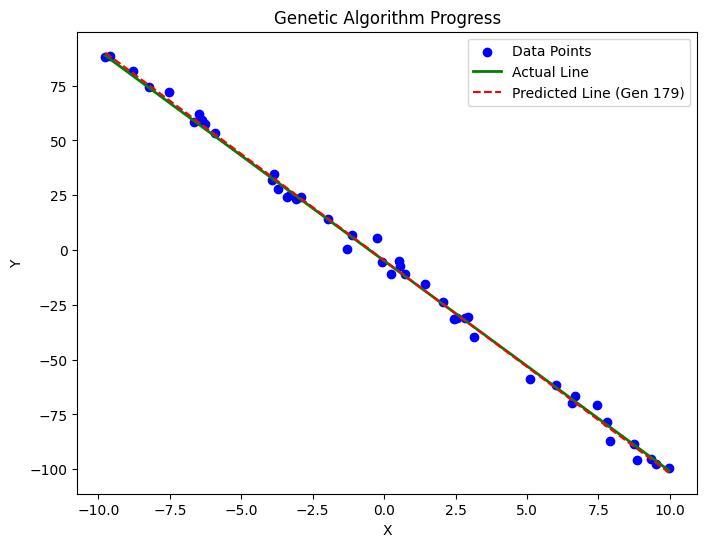

Generation 179 | Best Error: 440.522565 | Best Line: [-9.71405522 -4.7047764 ]


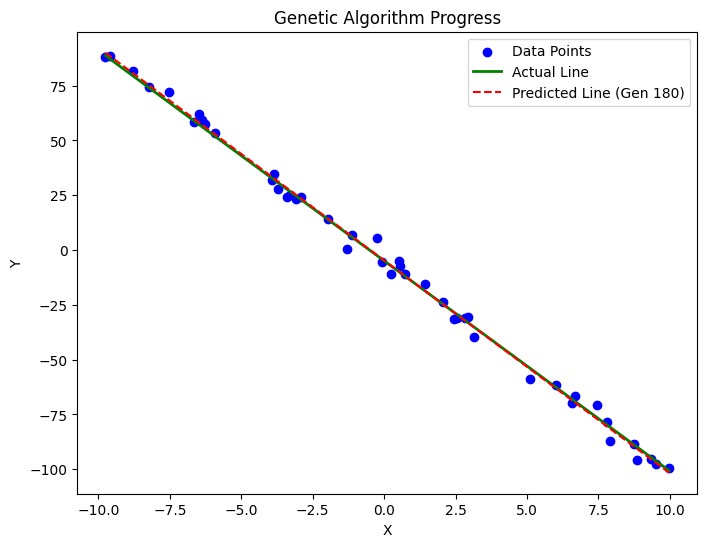

Generation 180 | Best Error: 440.522565 | Best Line: [-9.71405522 -4.7047764 ]


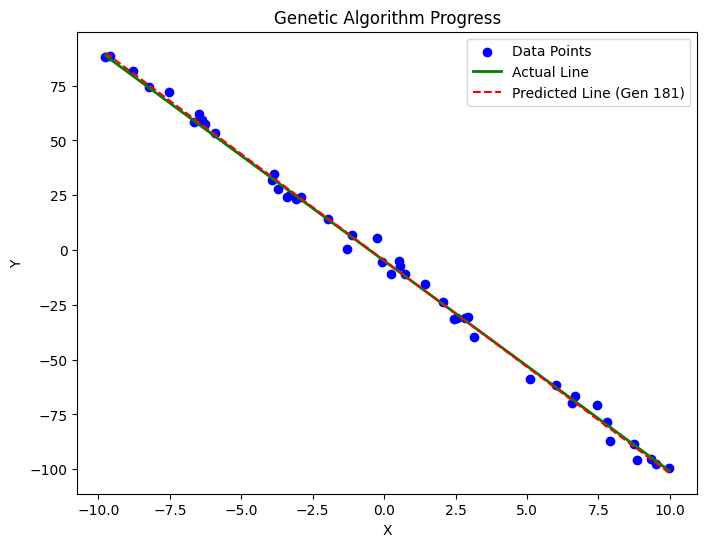

Generation 181 | Best Error: 440.522565 | Best Line: [-9.71405522 -4.7047764 ]


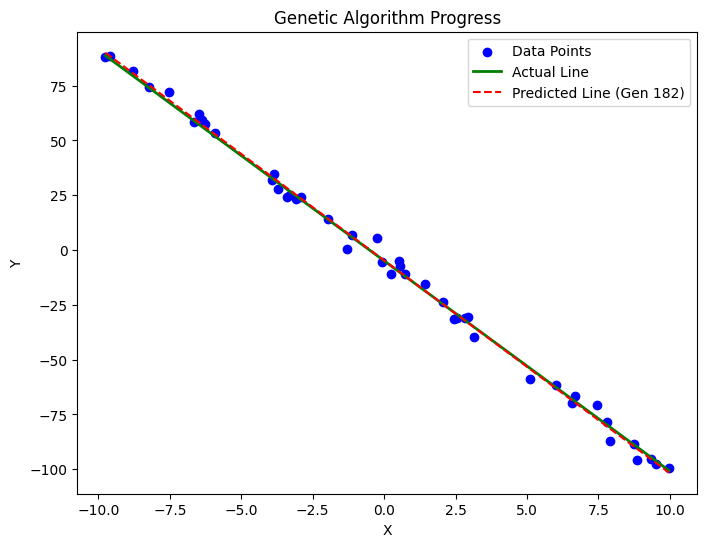

Generation 182 | Best Error: 440.522565 | Best Line: [-9.71405522 -4.7047764 ]


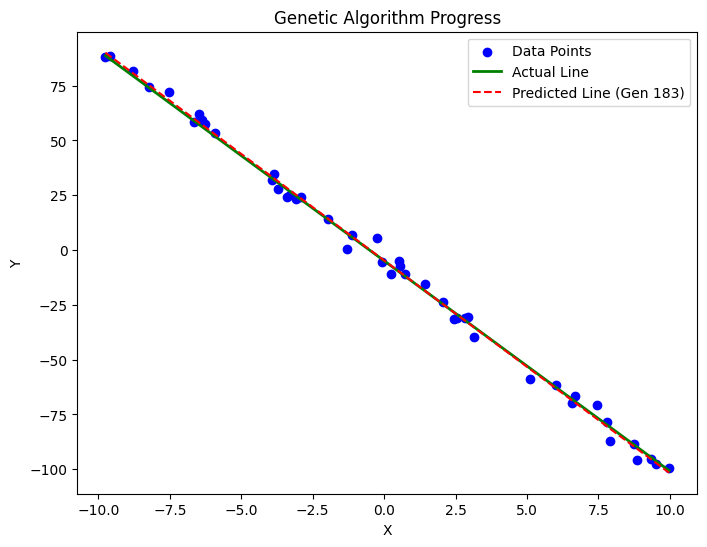

Generation 183 | Best Error: 440.522565 | Best Line: [-9.71405522 -4.7047764 ]


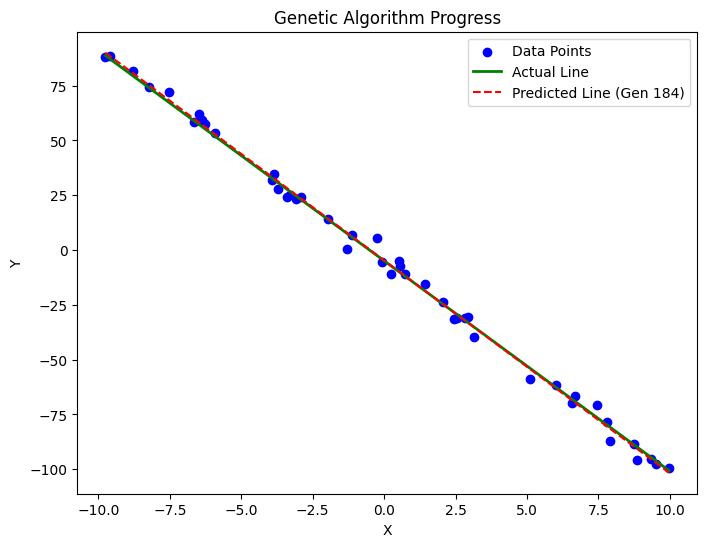

Generation 184 | Best Error: 440.522565 | Best Line: [-9.71405522 -4.7047764 ]


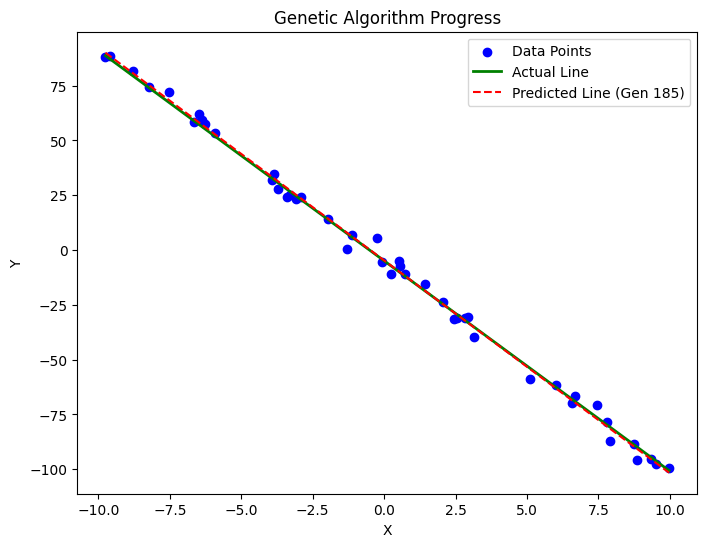

Generation 185 | Best Error: 440.522565 | Best Line: [-9.71405522 -4.7047764 ]


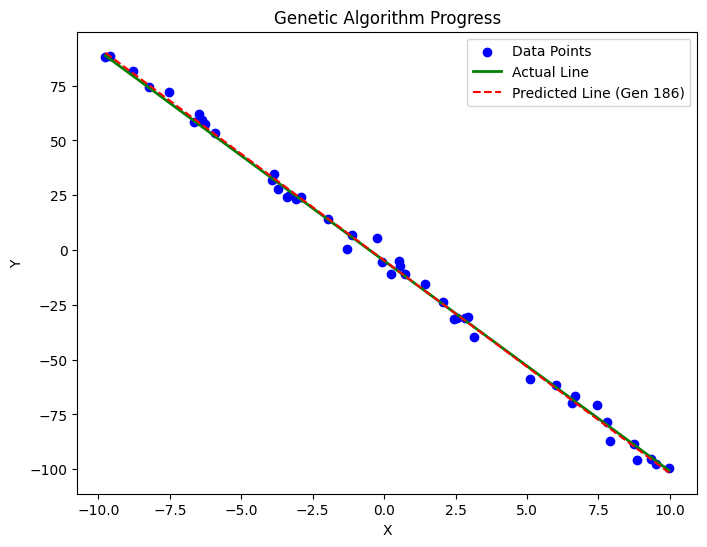

Generation 186 | Best Error: 440.522565 | Best Line: [-9.71405522 -4.7047764 ]


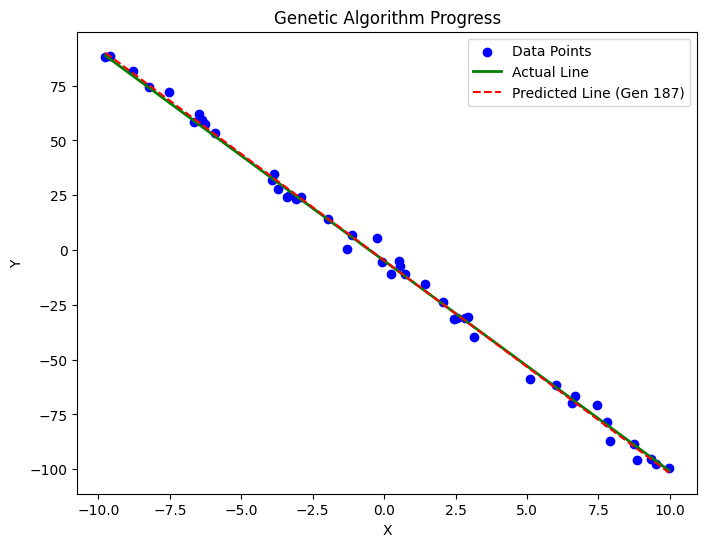

Generation 187 | Best Error: 440.522565 | Best Line: [-9.71405522 -4.7047764 ]


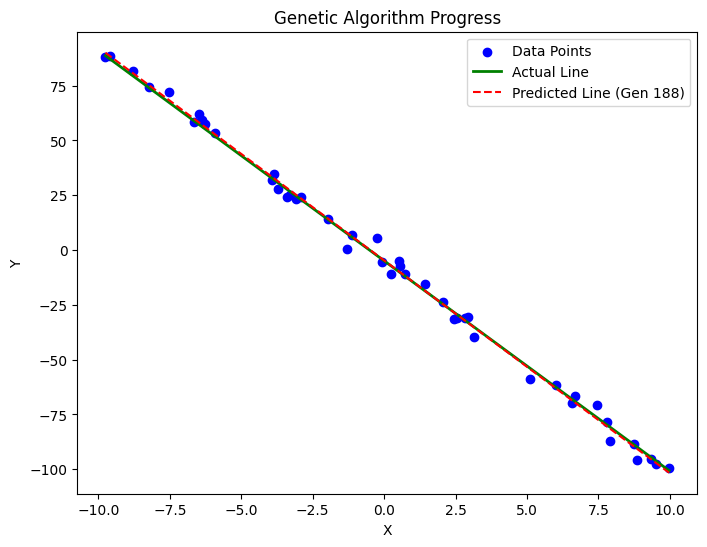

Generation 188 | Best Error: 440.522565 | Best Line: [-9.71405522 -4.7047764 ]


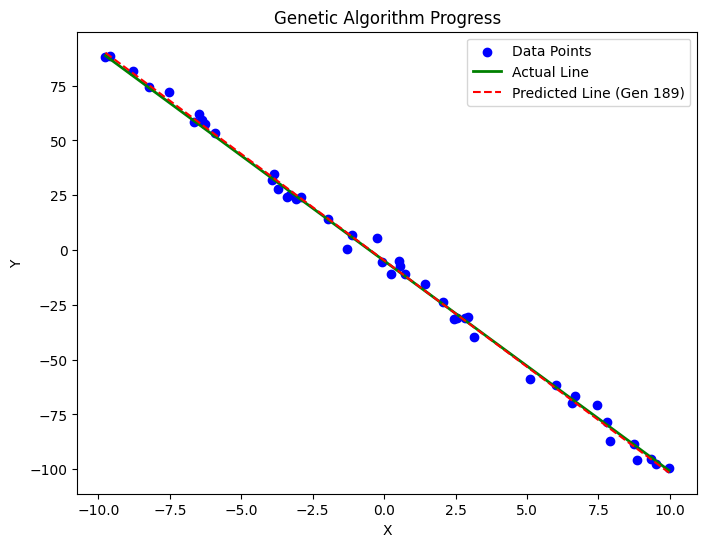

Generation 189 | Best Error: 440.522565 | Best Line: [-9.71405522 -4.7047764 ]


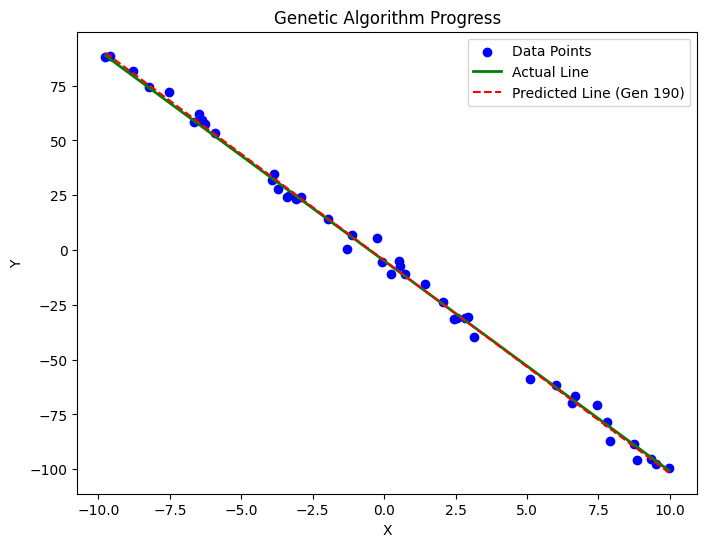

Generation 190 | Best Error: 440.522565 | Best Line: [-9.71405522 -4.7047764 ]


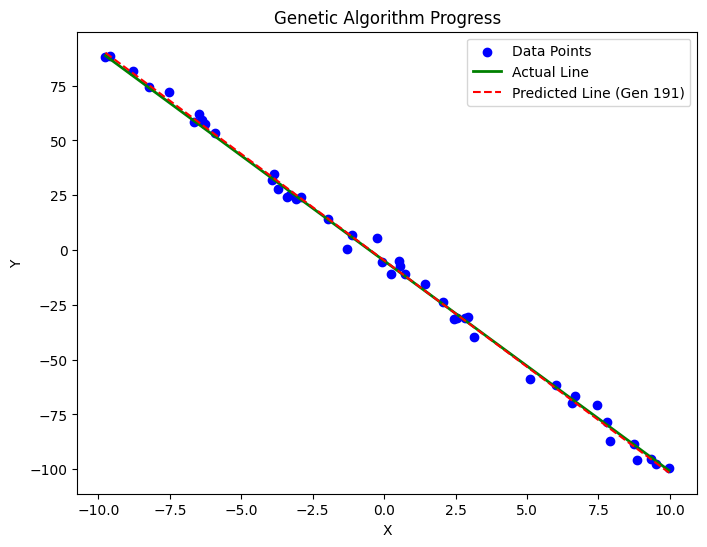

Generation 191 | Best Error: 440.522565 | Best Line: [-9.71405522 -4.7047764 ]


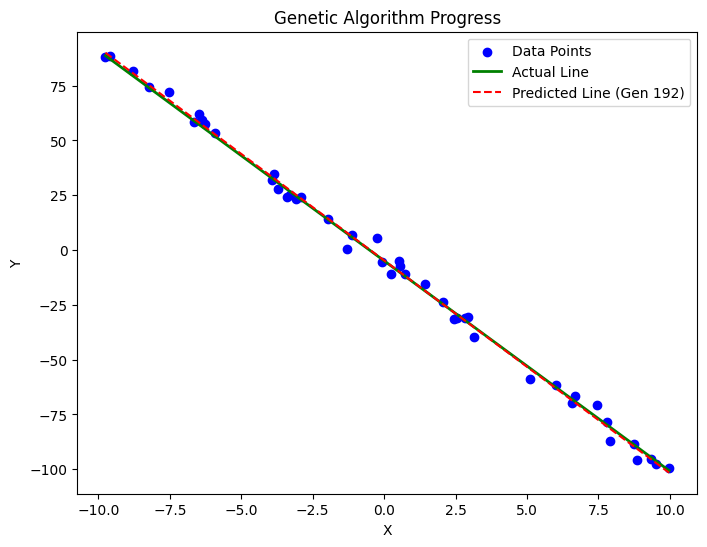

Generation 192 | Best Error: 440.522565 | Best Line: [-9.71405522 -4.7047764 ]


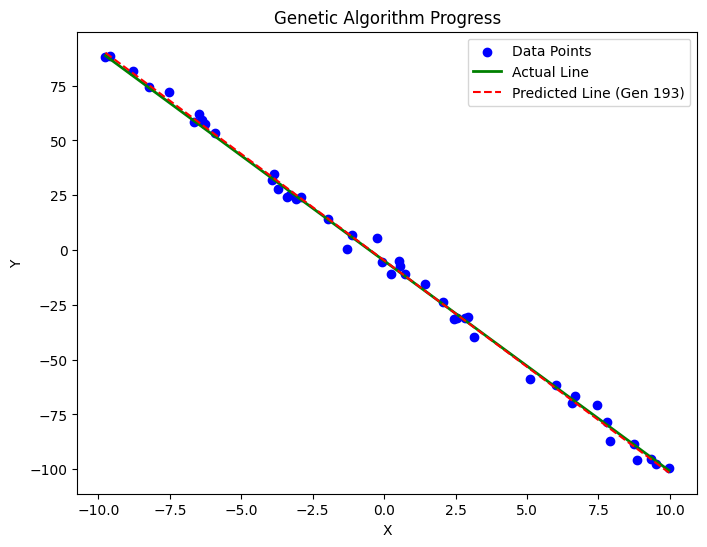

Generation 193 | Best Error: 440.522565 | Best Line: [-9.71405522 -4.7047764 ]


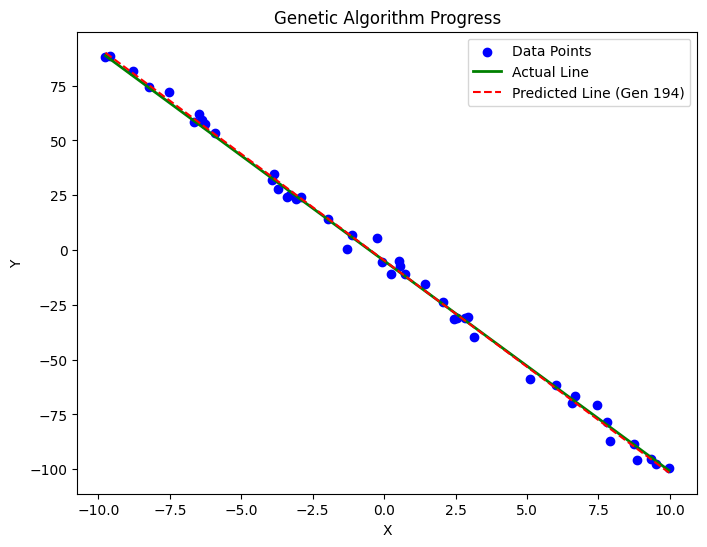

Generation 194 | Best Error: 440.522565 | Best Line: [-9.71405522 -4.7047764 ]


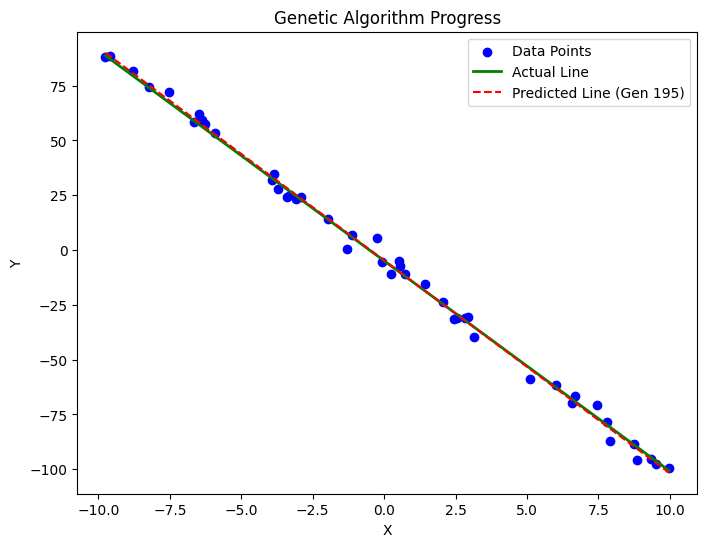

Generation 195 | Best Error: 440.522565 | Best Line: [-9.71405522 -4.7047764 ]


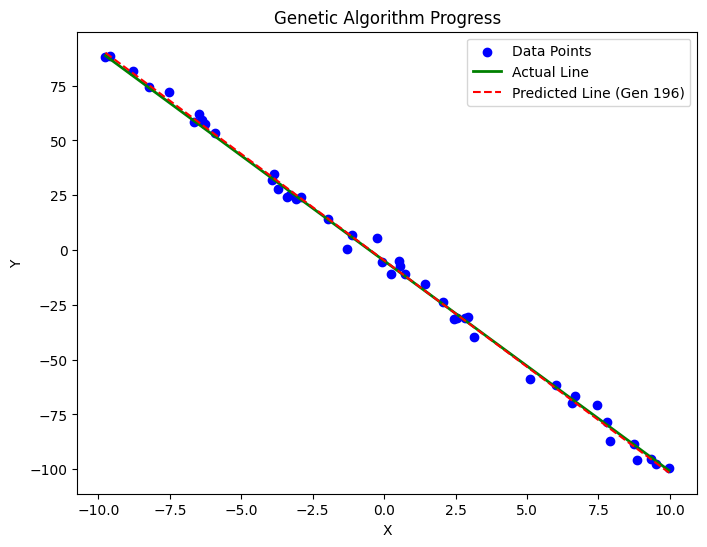

Generation 196 | Best Error: 440.522565 | Best Line: [-9.71405522 -4.7047764 ]


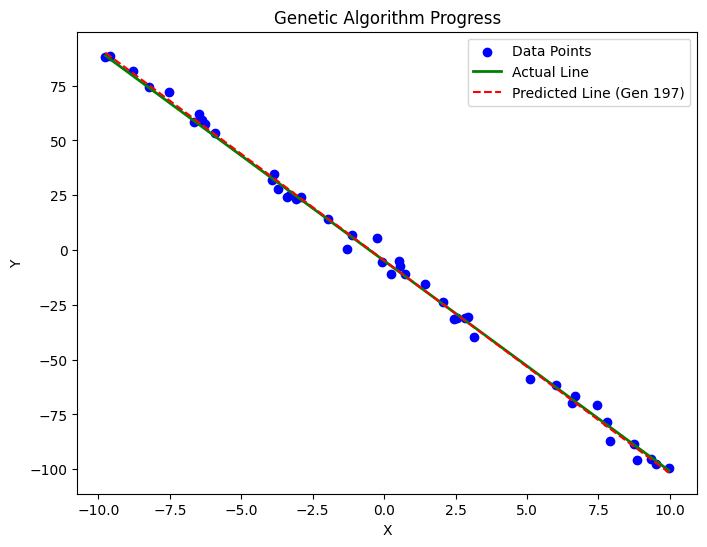

Generation 197 | Best Error: 440.522565 | Best Line: [-9.71405522 -4.7047764 ]


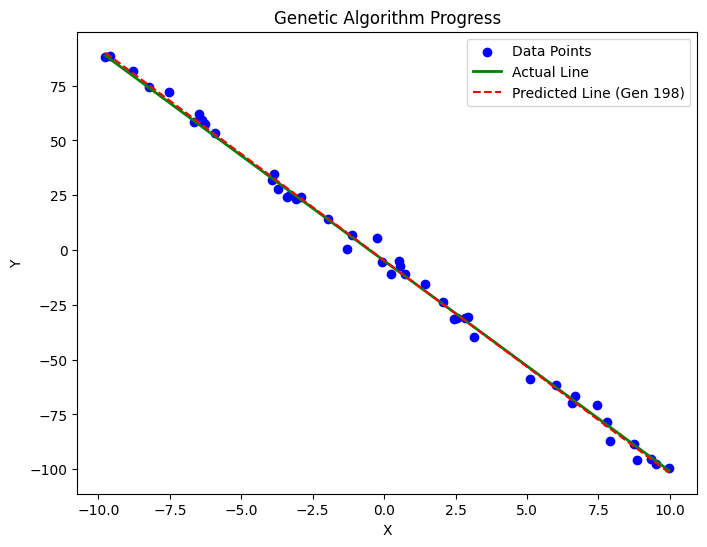

Generation 198 | Best Error: 440.522565 | Best Line: [-9.71405522 -4.7047764 ]


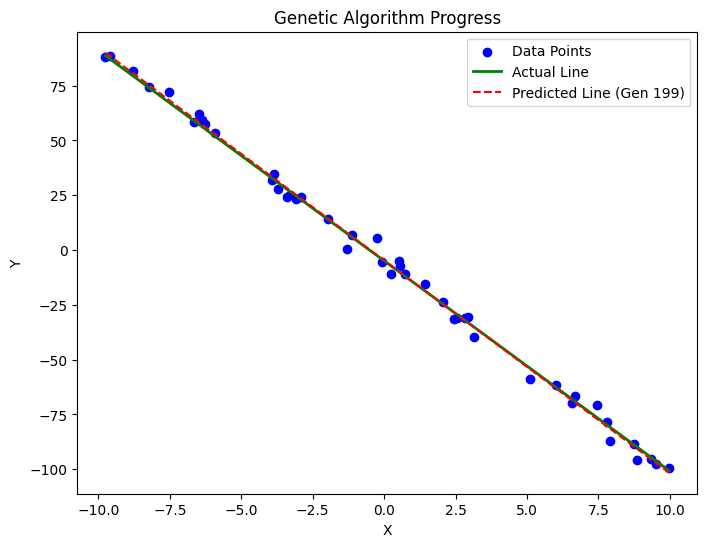

Generation 199 | Best Error: 440.522565 | Best Line: [-9.71405522 -4.7047764 ]

Final Best Line: [np.float64(-9.714055217112895), np.float64(-4.704776396651361)]
Final Error: 440.5225650778722


[np.float64(-9.714055217112895), np.float64(-4.704776396651361)]

In [22]:

# Run the algorithm
genetic_algorithm()